# Line ratios from saved refined maps from the PZ cube

This is a repetition of the PZ-01-01 and original 01-01 notebook, but using the 3-wave maps

In [1]:
from pathlib import Path
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from mpdaf.obj import Image
import regions
import sys
import pandas as pd
import cmasher as cmr
import pyneb as pn

sns.set_context("talk")
sns.set_color_codes()

/Users/will/Dropbox/muse-hii-regions/.venv/lib/python3.14/site-packages/mpdaf/version.py:34: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound


## Path to the root of this repo

In [2]:
ROOT = Path.cwd().parent.parent

In [3]:
mapspath = ROOT / "data/n346-bow-lines/refined"

In [4]:
def get_image(lineid, combo="P-007", ext="SUM"):
    im = Image(str(mapspath / f"map-{lineid}-{combo}.fits"), ext=ext)
    im.data = im.data.astype(float)
    return im

def get_image_raw(lineid, variant="csub", channel="ABC"):
    p = ROOT / "data" / "n346-bow-lines" / f"maps-n346-PZ-2pass-{variant}-007"
    candidates = list(p.glob(f"**/*-{lineid}-{channel}.fits"))
    assert candidates
    imfile = candidates[0]
    im = Image(str(imfile))
    im.data = im.data.astype(float)
    return im
   



## Calculate reddening from Balmer decrement

In [5]:
# Load the Hα and Hβ maps
imha = get_image_raw("h-i-6562-79")
imhb = get_image_raw("h-i-4861-32")

### Look at the raw Hα/Hβ ratio:

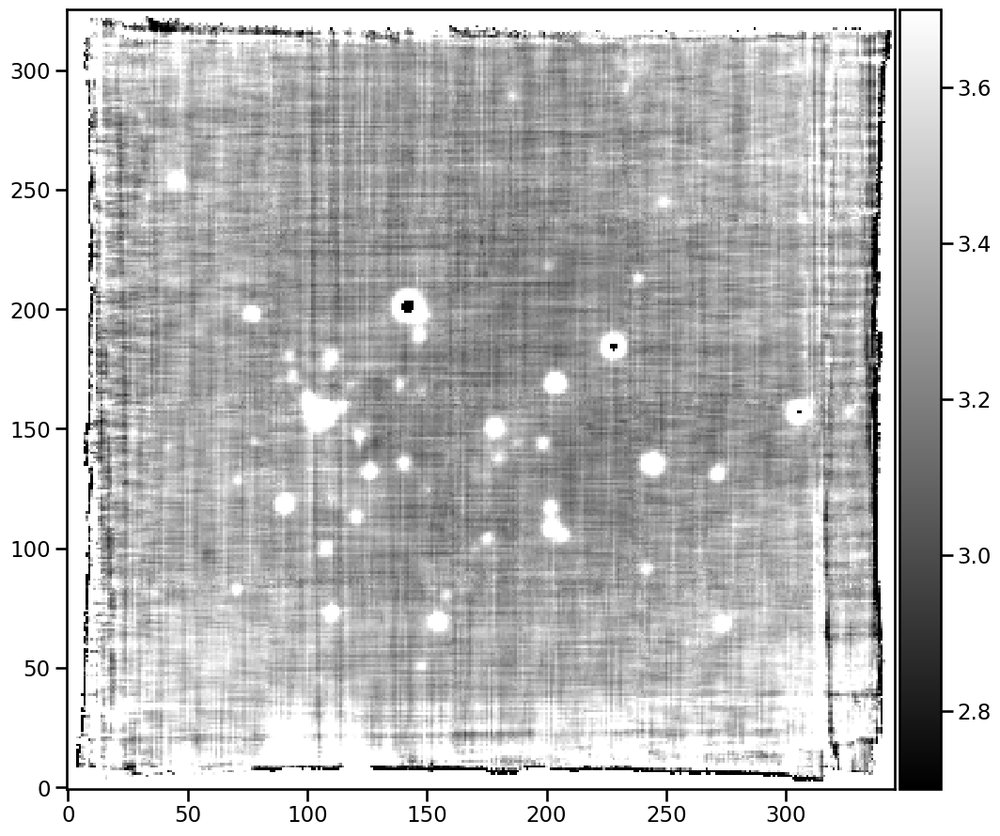

In [6]:
fig, ax = plt.subplots(figsize=(12, 12))
(imha / imhb).plot(vmin=2.7, vmax=3.7, cmap="gray", colorbar="v")

So we see very little structure there, compared with in the ESO pipeline cube case.  In priniciple, lighter means more extinction.  There might be a hint of this at the bottom of the image, where we see possible signs of the foreground filament.

But in other parts, we just see the stars (which have a different ratio because of photospheric absorption)

### PyNeb calculation of intrinsic Balmer decrement

In [7]:
hi = pn.RecAtom("H", 1)

Calculate the theoretical Balmer decrement from PyNeb. Density and temperature from Valerdi:2019a

In [8]:
tem, den = 12500, 100
R0 = hi.getEmissivity(tem, den, wave=6563) / hi.getEmissivity(tem, den, wave=4861)
R0

2.8205128205128207

### Look at correlation between Hα and Hβ in the faint limit

To make thinks easier, I multiply the Hb values by R0 so we have a square plot.  I zoom in on the faint parts:

In [9]:
imax = 100000
m = imha.data < imax
m = m & (R0 * imhb.data < imax)
m = m & ~imha.mask & ~imhb.mask
df = pd.DataFrame(
    {
        "ha": imha.data[m],
        "hb": R0 * imhb.data[m],
    }
)

Text(0.5, 0.98, 'Correlation between Ha and Hb brightness')

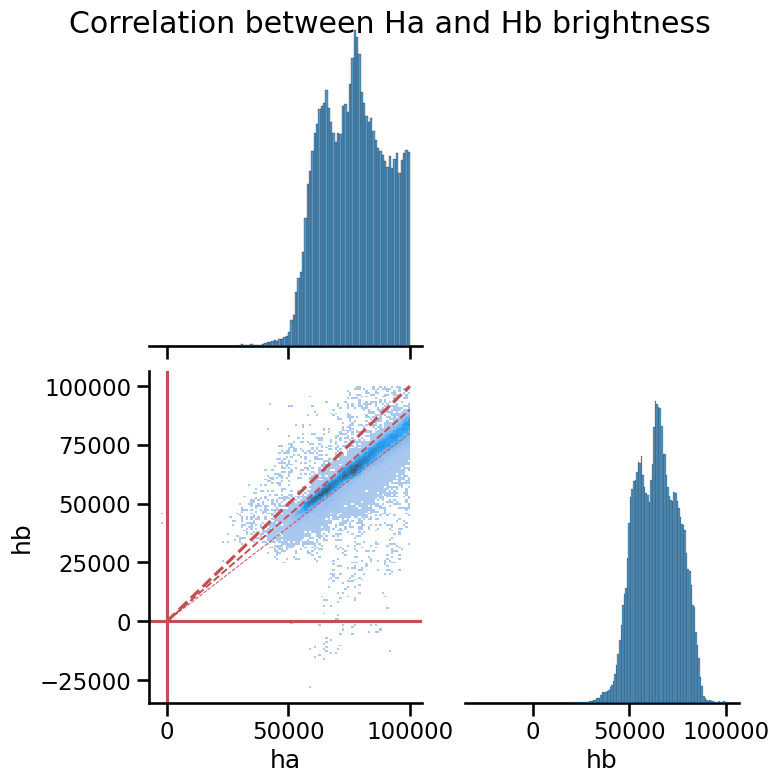

In [10]:
g = sns.pairplot(
    df,
    kind="hist",
    height=4,
    corner=True,
)
g.axes[1, 0].axvline(0.0, color="r")
g.axes[1, 0].axhline(0.0, color="r")
g.axes[1, 0].plot([0, imax], [0, imax], "--", color="r")
g.axes[1, 0].plot([0, imax], [0, 0.9 * imax], "--", color="r", linewidth=1.4)
g.axes[1, 0].plot([0, imax], [0, 0.8 * imax], "--", color="r", linewidth=0.7)
g.fig.suptitle("Correlation between Ha and Hb brightness")

So, the slope is not unity, meaning the extinction is not zero.  But the intercept is zero, which is great. So nothing more to do,

Now define some regions to take averages

In [11]:
boxes = {
    "sw filament": regions.RegionBoundingBox(
        iymin=20,
        iymax=40,
        ixmin=200,
        ixmax=310,
    ),
    "bow shock": regions.RegionBoundingBox(
        iymin=165,
        iymax=205,
        ixmin=240,
        ixmax=290,
    ),
    "w filament": regions.RegionBoundingBox(
        iymin=100,
        iymax=130,
        ixmin=25,
        ixmax=55,
    ),
    "c filament": regions.RegionBoundingBox(
        iymin=195,
        iymax=210,
        ixmin=155,
        ixmax=195,
    ),
}

Plot on a better scale and show the regions:

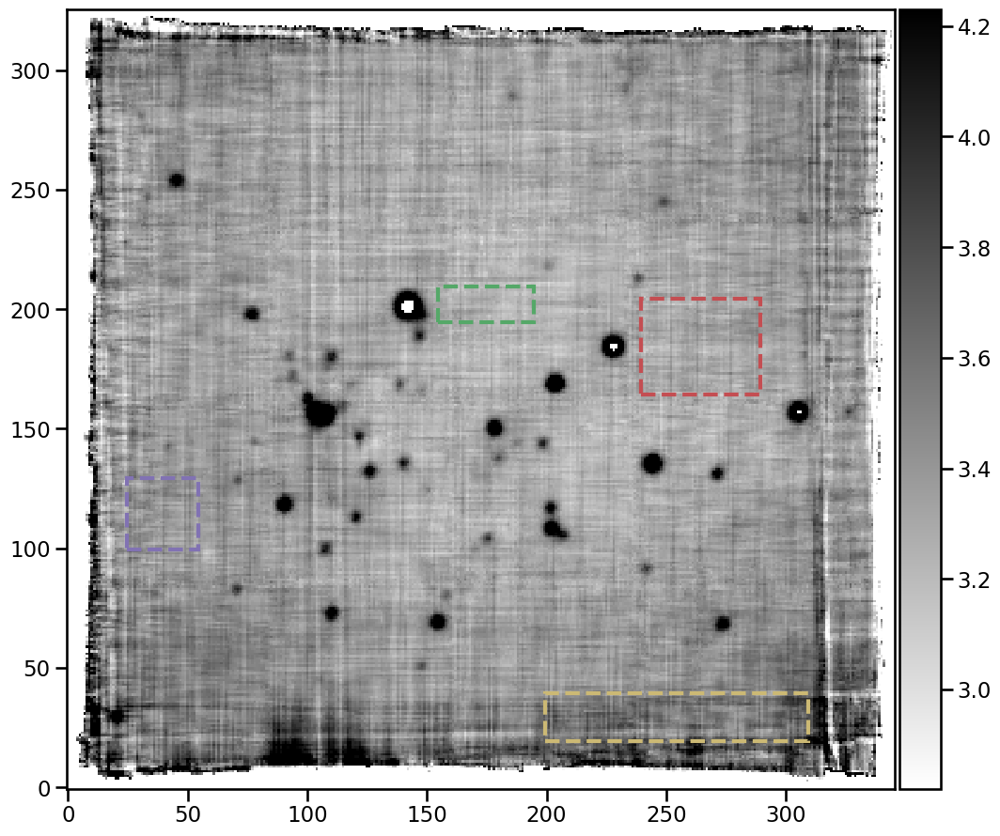

In [12]:
fig, ax = plt.subplots(figsize=(12, 12))
(imha / (imhb)).plot(
    vmin=R0,
    vmax=1.5 * R0,
    scale="linear",
    cmap="gray_r",
    colorbar="v",
)

for box, c in zip(boxes.values(), "yrmgc"):
    box.plot(
        ax=ax,
        lw=3,
        edgecolor=c,
        linestyle="dashed",
        #        facecolor=(1.0, 1.0, 1.0, 0.4),
        fill=False,
    )

We can see some very high extinction at in the S filaments.  And some small increase in extinction in the main diagonal filament.  This is probably limited having foreground emission to some extent.

Look at average values in the sample boxes

In [13]:
for label, box in boxes.items():
    (yslice, xslice), _ = box.get_overlap_slices(imha.shape)
    ha = np.median(imha[yslice, xslice].data.data)
    hb = np.median(imhb[yslice, xslice].data.data)
    print(f"{label}: {ha/hb:.3f}")

sw filament: 3.574
bow shock: 3.309
w filament: 3.411
c filament: 3.238


For reference, the values from the PZ notebook
```
sw filament: 3.318
bow shock: 3.156
w filament: 3.226
c filament: 3.224
```

I tried mean and median, and it made very little difference.  Lowest in the bow shock region; slightly higher in the west and central filaments.  Even higher in the southwest filament.

### Equivalent widths
*New 2024-04-23*

In [14]:
#imnii = Image(str(ROOT / "data/ngc346-PZ-nii-6583-bin01-sum.fits"))
imcont_ha = get_image_raw("h-i-6562-79", variant="cont")
imcont_hb = get_image_raw("h-i-4861-32", variant="cont")

In [15]:
imcont_ha.wcs

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN' 'DEC--TAN' 
CRVAL : 14.767543933184 -72.175622488396 
CRPIX : 149.82608074324 164.12571876734 
PC1_1 PC1_2  : -5.5555555555556e-05 0.0 
PC2_1 PC2_2  : 0.0 5.5555555555556e-05 
CDELT : 1.0 1.0 
NAXIS : 346  326

In [16]:
imha.wcs

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN' 'DEC--TAN' 
CRVAL : 14.767543933184 -72.175622488396 
CRPIX : 149.82608074324 164.12571876734 
PC1_1 PC1_2  : -5.5555555555556e-05 0.0 
PC2_1 PC2_2  : 0.0 5.5555555555556e-05 
CDELT : 1.0 1.0 
NAXIS : 346  326

We now have a local continuum for all the lines

In [17]:
ewha = 3 * 1.25 * imha / imcont_ha

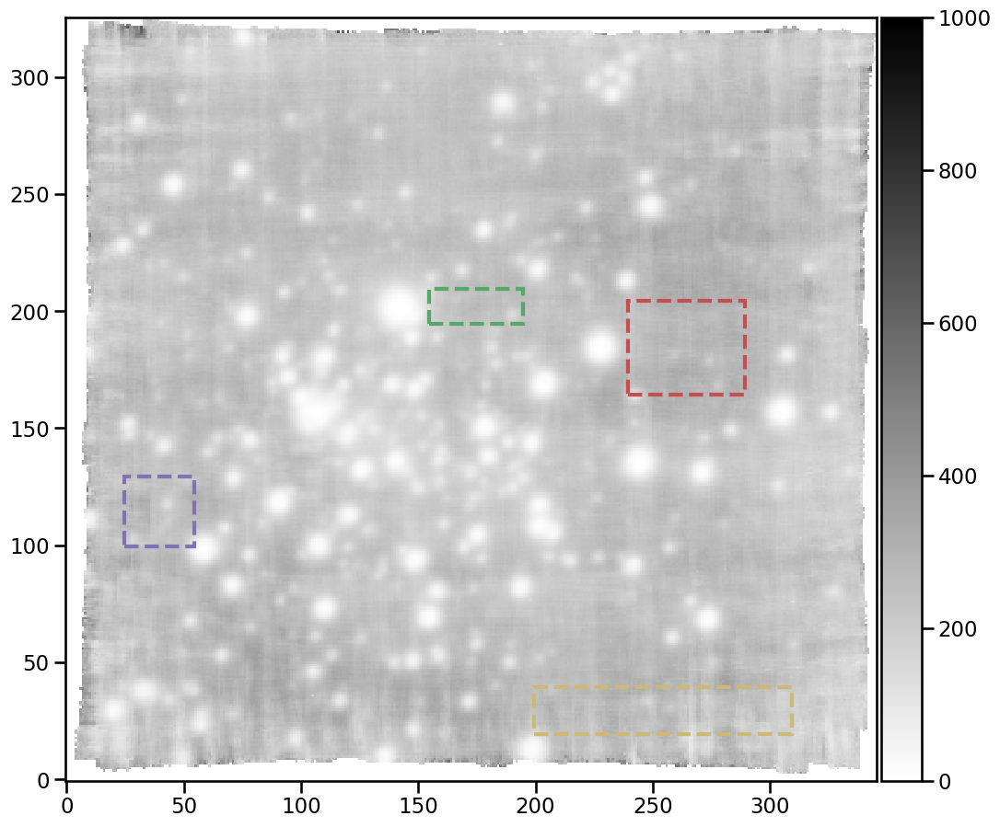

In [18]:
fig, ax = plt.subplots(figsize=(12, 12))
(ewha).plot(
    vmin=0,
    vmax=1000,
    scale="linear",
    cmap="gray_r",
    colorbar="v",
)

for box, c in zip(boxes.values(), "yrmgc"):
    box.plot(
        ax=ax,
        lw=3,
        edgecolor=c,
        linestyle="dashed",
        #        facecolor=(1.0, 1.0, 1.0, 0.4),
        fill=False,
    )

In [19]:
for label, box in boxes.items():
    (yslice, xslice), _ = box.get_overlap_slices(imha.shape)
    ew = np.mean(ewha[yslice, xslice].data.data)
    dew = np.std(ewha[yslice, xslice].data.data)
    print(f"{label}: {ew:.3f} +/- {dew:.3f}")

sw filament: 243.377 +/- 38.587
bow shock: 275.787 +/- 26.617
w filament: 237.484 +/- 33.780
c filament: 230.646 +/- 30.356


### The reddening law

In [20]:
pn.RedCorr().getLaws()

dict_keys(['No correction', 'CCM89', 'CCM89 Bal07', 'CCM89 oD94', 'S79 H83 CCM89', 'K76', 'SM79 Gal', 'G03 LMC', 'MCC99 FM90 LMC', 'F99-like', 'F99', 'F88 F99 LMC', 'Cal00'])

PyNeb does not seem to have anything specifically tailored to the SMC.  The average SMC extinction law is supposedly simply $1/\lambda$.

But, it is possible to get a SMC curve by using the "F99-like" option, which uses the curve of Fitzpatrick & Massa 1990, ApJS, 72, 163. This depends on $R_V$ and 6 other parameters (!!!).  Most of the parameters only affect the UV part of the curve, which does not concern us.

Then, we can use the average values of $R_V$ and the other parameters, which were fit by Gordon:2003l to SMC stars. This is $R_V = 2.74 \pm 0.13$.

So here I compare that SMC curve with $1/\lambda$ and with the Clayton curve for Milky Way (but also adjusted to $R_V = 2.74$):

[(4000.0, 9300.0), (-2.5, 1.0)]

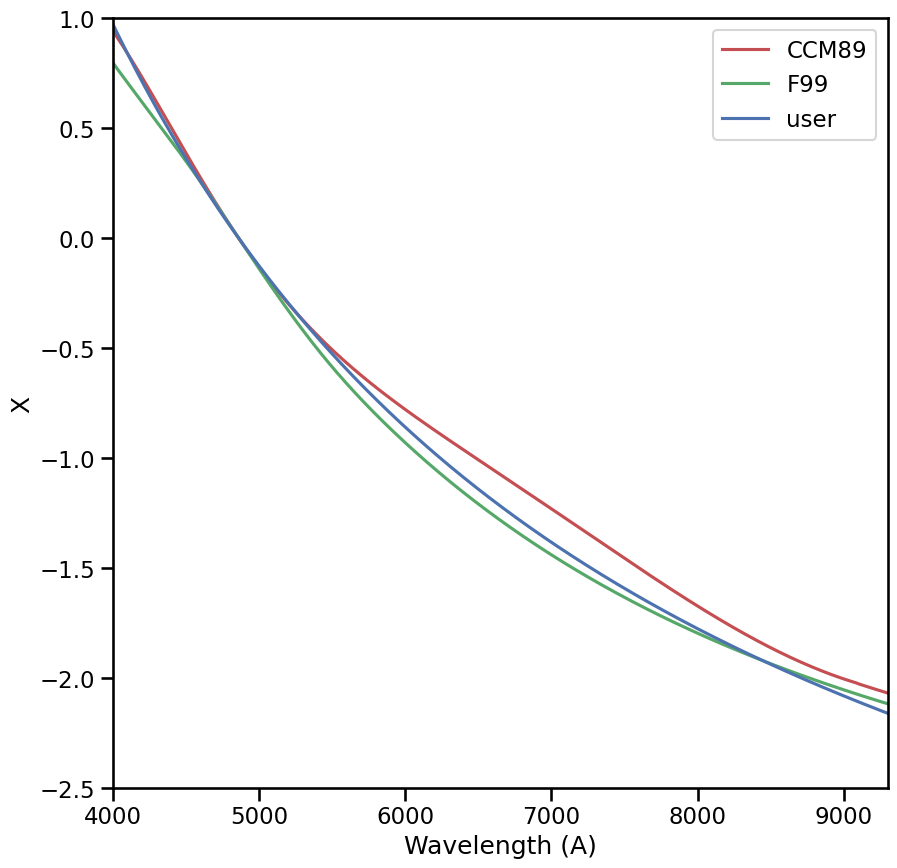

In [21]:
def A_lam(wave):
    return 4861.32 / wave


def my_X(wave, params=[]):
    """A_lam / E(B - V) ~ lam^-1"""
    return A_lam(wave) / (A_lam(4400) - A_lam(5500))


rc = pn.RedCorr()
rc.UserFunction = my_X
rc.R_V = 2.74
rc.FitzParams = [-4.96, 2.26, 0.39, 0.6, 4.6, 1.0]
f, ax = plt.subplots(figsize=(10, 10))
rc.plot(laws=["user", "F99", "CCM89"], ax=ax)

ax.set(
    xlim=[4000, 9300],
    ylim=[-2.5, 1.0],
    #    xlim=[4000, 7000],
    #    ylim=[-1, 1],
)

So the Gordon curve is flatter in the blue, steeper in green, and flatter in red, as compared to $1/\lambda$.

In [22]:
rc = pn.RedCorr()
rc.R_V = 2.74
rc.FitzParams = [-4.96, 2.26, 0.39, 0.6, 4.6, 1.0]
rc.law = "F99"

Test it out for the bow shock region:

In [23]:
rc.setCorr(obs_over_theo=3.123 / R0, wave1=6563.0, wave2=4861.0)
rc.E_BV, rc.cHbeta

(array(0.08918852), 0.11614443544515395)

And for the highest extinction region

In [24]:
rc.setCorr(obs_over_theo=4.165 / R0, wave1=6563.0, wave2=4861.0)
rc.E_BV, rc.cHbeta

(array(0.3412549), 0.44439418598965574)

So $E(B - V)$ varies from about 0.1 to about 0.35. This is similar to what is found for the stars.

### The reddening map

We can now make a map of $E(B - V)$

In [25]:
R = imha / (imhb)
rc.setCorr(obs_over_theo=R.data / R0, wave1=6563.0, wave2=4861.0)
imEBV = R.copy()
imEBV.data = rc.E_BV
imEBV.mask = imha.mask | imhb.mask

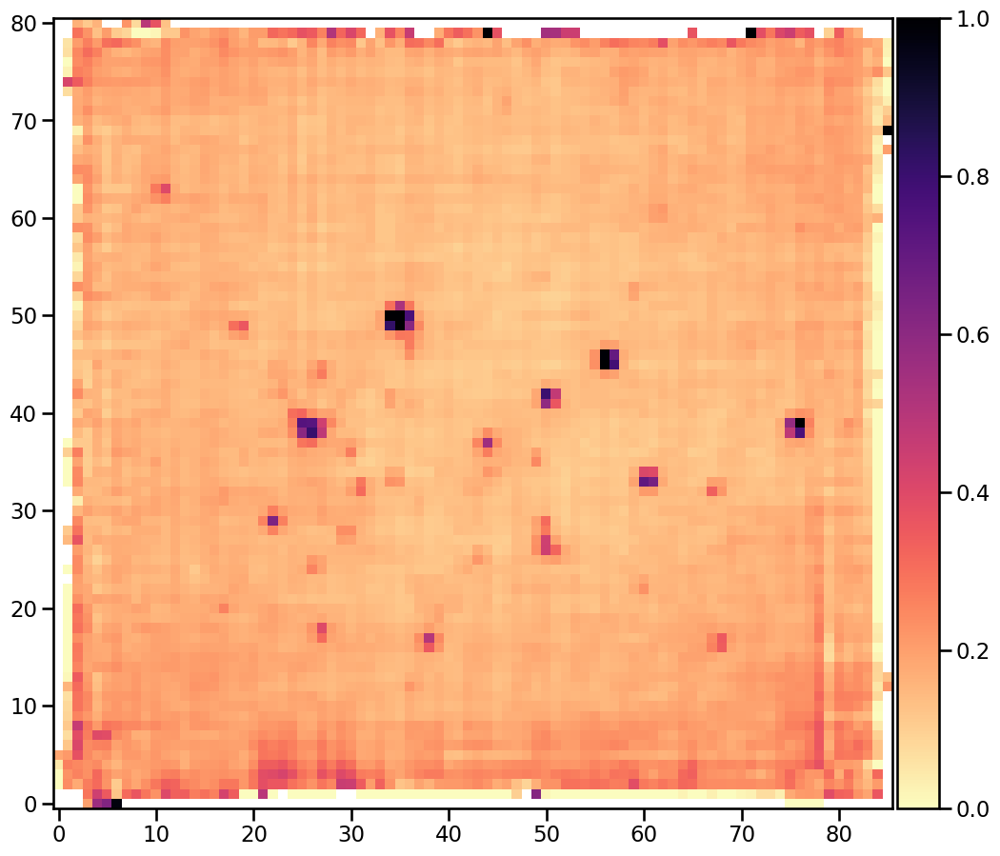

In [26]:
fig, ax = plt.subplots(figsize=(12, 12))
imEBV.rebin(4).plot(
    vmin=0.0,
    vmax=1.0,
    scale="linear",
    cmap="magma_r",
    colorbar="v",
)

Looks like I would expect. Check values in the boxes:

In [27]:
for label, box in boxes.items():
    (yslice, xslice), _ = box.get_overlap_slices(imha.shape)
    ebv = np.median(imEBV[yslice, xslice].data.data)
    print(f"{label}: {ebv:.3f}")

sw filament: 0.210
bow shock: 0.139
w filament: 0.164
c filament: 0.122


These seem the same as before.  But we want to eliminate extreme values.

In [28]:
badpix = (imEBV.data > 1.0) | (imEBV.data < 0.0)
imEBV.mask = imEBV.mask | badpix

Save it to a file:

In [29]:
imEBV.write(str(ROOT / "data/ngc346-ZZ-reddening-E_BV.fits"), savemask="nan")

Lots of regions are affected by the stellar absorption.  There are apparent increases in reddening at the position of each star.  This is not real, but is due to the photospheric absorption having more of an effect on Hb (mainly because the emission line is weaker).

At some point, I am going to have to deal with that. But it is not an issue for the bow shock emission, since this is in an area free of stars.  We should just use the median bow shock reddening of $E(B-V) = 0.139$ so that we don't introduce any extra noise.

<>:8: SyntaxWarning: "\l" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\l"? A raw string is also an option.
<>:9: SyntaxWarning: "\l" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\l"? A raw string is also an option.
<>:8: SyntaxWarning: "\l" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\l"? A raw string is also an option.
<>:9: SyntaxWarning: "\l" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\l"? A raw string is also an option.
/var/folders/0q/3pcjvc3n6sn2wk6g8ck6ry300000gn/T/ipykernel_81351/2657971787.py:8: SyntaxWarning: "\l" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\l"? A raw string is also an option.
  xlabel="Wavelength, $\lambda$, Å",
/var/folders/0q/3pcjvc3n6sn2wk6g8ck6ry300000gn/T/ipykernel_81351/2657971787.py:9: SyntaxWarning: "\l" is an invalid escape

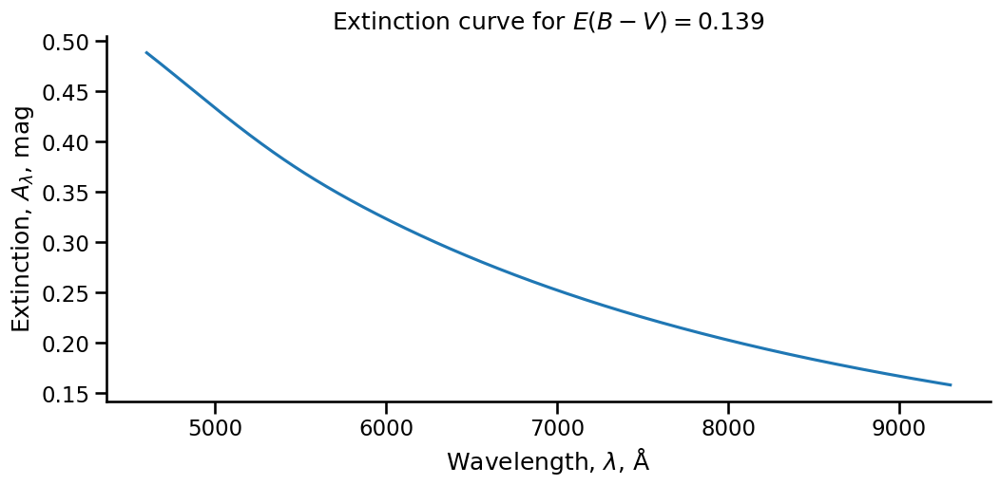

In [30]:
rc.E_BV = 0.139
wavs = np.arange(4600, 9300)
Alam = rc.E_BV * rc.X(wavs)

fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(wavs, Alam)
ax.set(
    xlabel="Wavelength, $\lambda$, Å",
    ylabel="Extinction, $A_\lambda$, mag",
    title=f"Extinction curve for $E(B - V) = {rc.E_BV:.3f}$",
)
sns.despine()

## Calculate the [S III] temperature

In [31]:
im6312 = get_image_raw("s-iii-6312-06")
im9069 = get_image_raw("s-iii-9068-90")
cont6312 = get_image_raw("s-iii-6312-06", variant="cont")

The raw ratio:

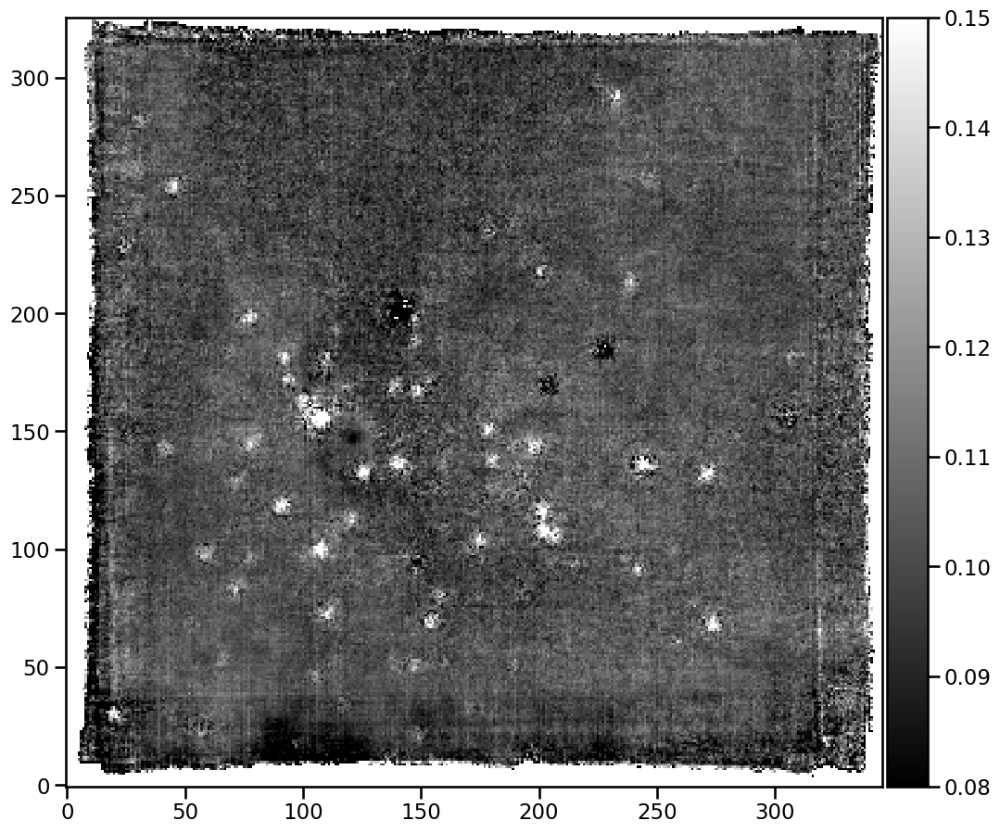

In [32]:
fig, ax = plt.subplots(figsize=(12, 12))
(im6312 / im9069).plot(vmin=0.08, vmax=0.15, cmap="gray", colorbar="v")

That looks more or less like the last time

In [33]:
imax = 15000
slope = 0.1
m = im9069.data < imax
m = m & (im9069.data > -100)
m = m & (im6312.data < slope * imax)
m = m & ~im9069.mask & ~im6312.mask
df = pd.DataFrame(
    {
        "9069": im9069.data[m].astype(float),
        "6312": im6312.data[m].astype(float),
    }
)

Text(0.5, 0.98, 'Correlation between [S III] 9069 and 6312 brightness')

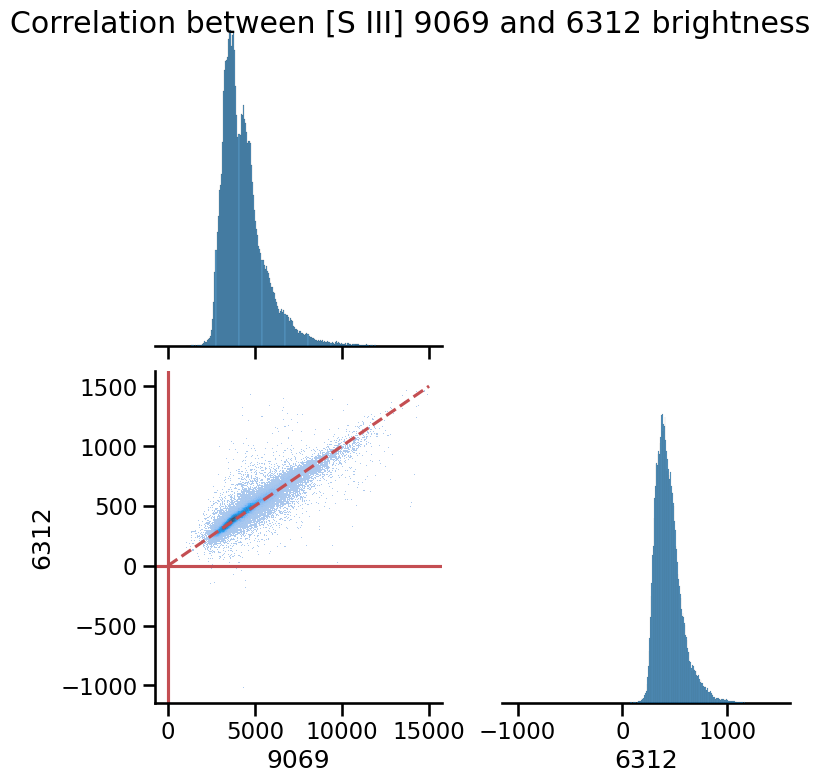

In [34]:
g = sns.pairplot(
    df,
    kind="hist",
    height=4,
    corner=True,
)

g.axes[1, 0].axvline(0.0, color="r")
g.axes[1, 0].axhline(0.0, color="r")
g.axes[1, 0].plot([0, imax], [0, slope * imax], "--", color="r")
g.fig.suptitle("Correlation between [S III] 9069 and 6312 brightness")

Nothing needs to get added to anything. 

In [35]:
imax = 5000
slope = 0.1
x = im9069.data
y = im6312.data
m = x < imax
m = m & (x > -100) & (y > -100)
m = m & (y < 1.2 * slope * imax)
m = m & ~im9069.mask & ~im6312.mask
df = pd.DataFrame(
    {
        "9069": x.data[m],
        "6312": y.data[m],
    }
)

Text(0.5, 0.98, 'ZOOMED Correlation between [S III] 9069 and 6312 brightness')

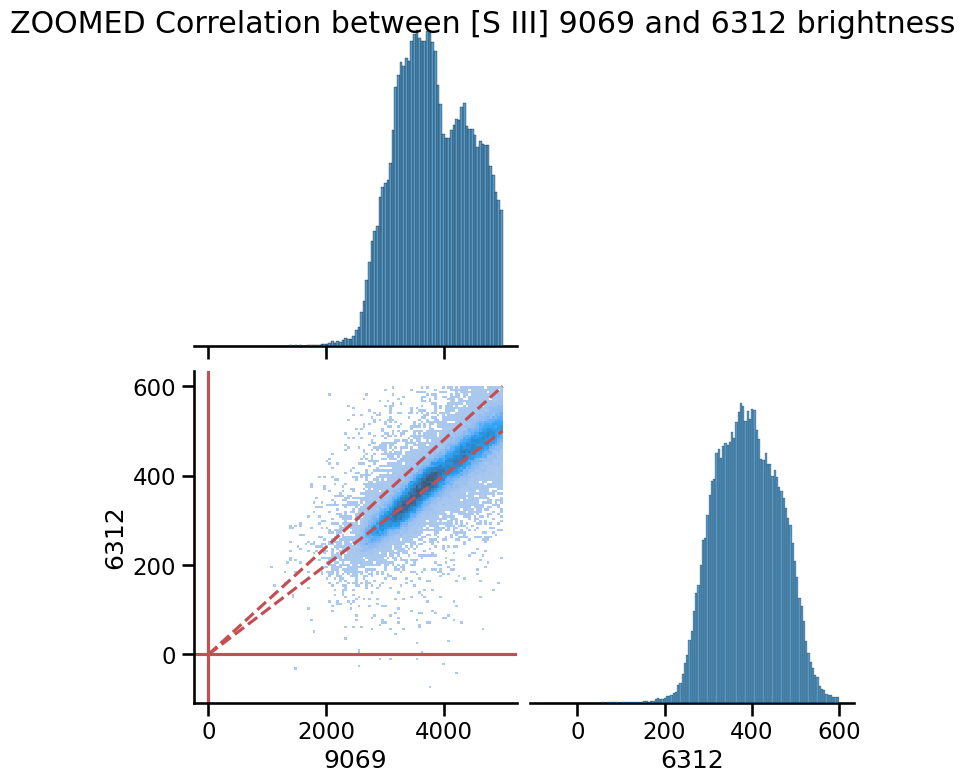

In [36]:
g = sns.pairplot(
    df,
    kind="hist",
    height=4,
    corner=True,
)

g.axes[1, 0].axvline(0.0, color="r")
g.axes[1, 0].axhline(0.0, color="r")
g.axes[1, 0].plot([0, imax], [0, slope * imax], "--", color="r")
g.axes[1, 0].plot([0, imax], [0, 1.2 * slope * imax], "--", color="r")
g.fig.suptitle("ZOOMED Correlation between [S III] 9069 and 6312 brightness")

In [37]:
df.describe()

,9069,6312
count,79428.000000,79428.000000
mean,3824.137518,389.904971
std,614.034385,73.724752
min,1053.216553,-75.019531
25%,3354.666931,334.600403
50%,3782.454346,388.797180
75%,4326.563843,445.370155
max,4999.865234,599.507080


Now we need to correct for reddening.

In [38]:
A9069 = rc.X(9069) * imEBV
im9069c = im9069.copy()
im9069c.data = im9069.data * 10 ** (0.4 * A9069.data)

In [39]:
A6312 = rc.X(6312) * imEBV
im6312c = im6312.copy()
im6312c.data = (im6312.data) * 10 ** (0.4 * A6312.data)

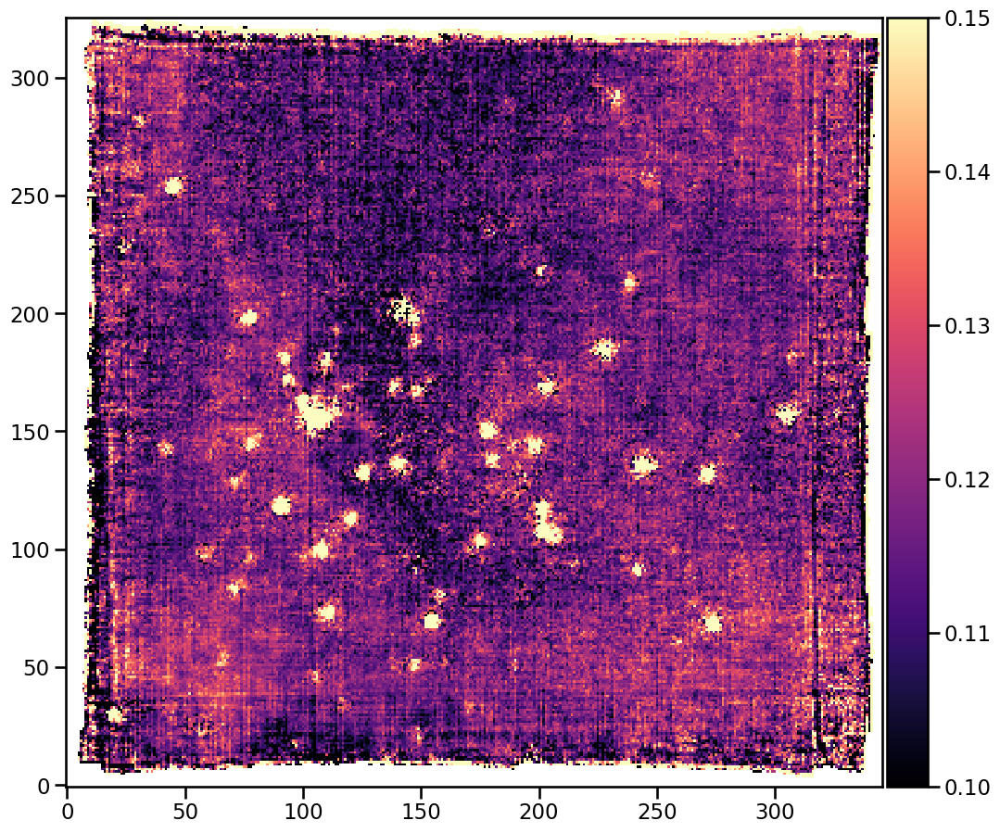

In [40]:
n = 1
fig, ax = plt.subplots(figsize=(12, 12))
(im6312c.rebin(n) / im9069c.rebin(n)).plot(
    vmin=0.1, vmax=0.15, cmap="magma", colorbar="v"
)

/var/folders/0q/3pcjvc3n6sn2wk6g8ck6ry300000gn/T/ipykernel_81351/1931966129.py:2: RuntimeWarning: divide by zero encountered in log10
  x = np.log10(im9069c.rebin(n).data)
/var/folders/0q/3pcjvc3n6sn2wk6g8ck6ry300000gn/T/ipykernel_81351/1931966129.py:3: RuntimeWarning: divide by zero encountered in log10
  y = np.log10(im6312c.rebin(n).data / im9069c.rebin(n).data)
/var/folders/0q/3pcjvc3n6sn2wk6g8ck6ry300000gn/T/ipykernel_81351/1931966129.py:3: RuntimeWarning: invalid value encountered in log10
  y = np.log10(im6312c.rebin(n).data / im9069c.rebin(n).data)


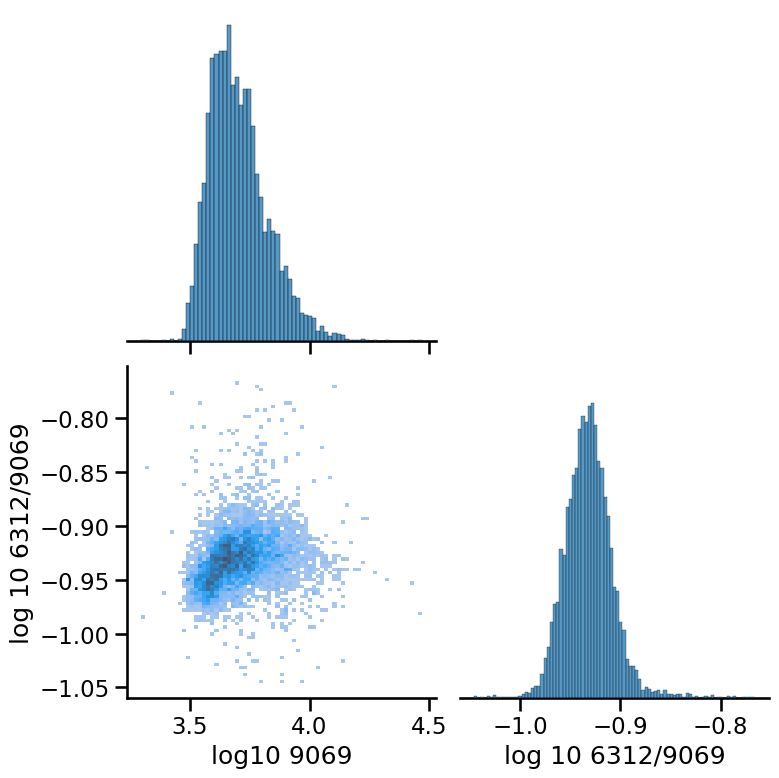

In [41]:
n = 4
x = np.log10(im9069c.rebin(n).data)
y = np.log10(im6312c.rebin(n).data / im9069c.rebin(n).data)
m = (x > 3.0) & (x < 4.5)
m = m & (y > -1.05) & (y < -0.75)
m = m & ~im9069c.rebin(n).mask & ~im6312c.rebin(n).mask
df = pd.DataFrame(
    {
        "log10 9069": x[m],
        "log 10 6312/9069": y[m],
    }
)
g = sns.pairplot(
    df,
    kind="hist",
    height=4,
    corner=True,
)

This is totally different from what we got from the ESO cube.  This version is much more reliable, since with the other one we had no idea where the zeropoint was

Now, make a mask of EW(6312).  But first, we need to correct the zero point of the continuum.

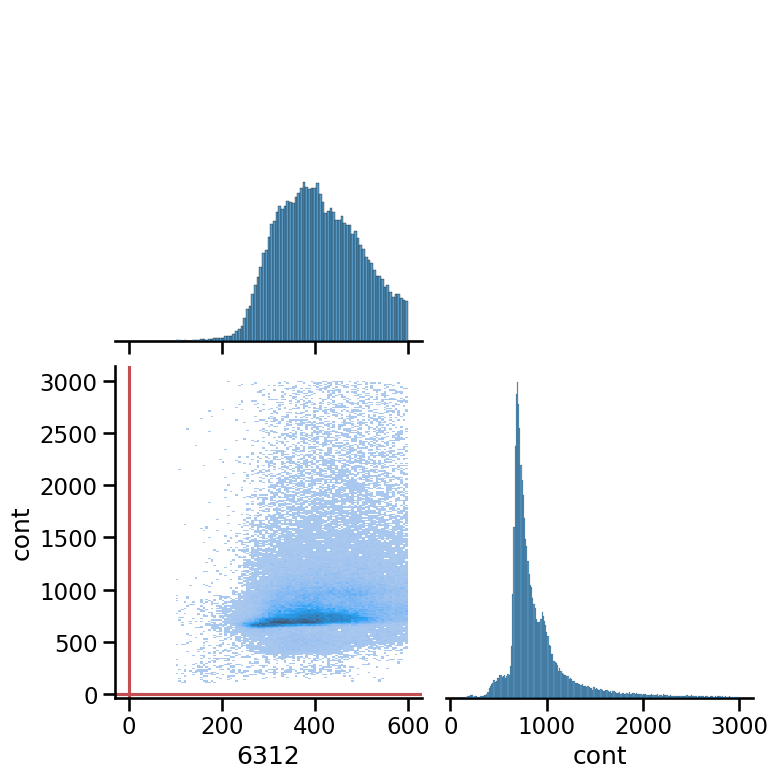

In [42]:
im6312_zero = 0.0
cont6312_zero = 0.0
imax = 600
x = im6312.data - im6312_zero
y = cont6312.data - cont6312_zero
m = x < imax
m = m & (x > 100)
m = m & (y < 3000) & (y > 100)
m = m & ~cont6312.mask & ~im6312.mask
df = pd.DataFrame(
    {
        "6312": x[m],
        "cont": y[m],
    }
)
g = sns.pairplot(
    df,
    kind="hist",
    height=4,
    corner=True,
)

g.axes[1, 0].axvline(0.0, color="r")
g.axes[1, 0].axhline(0.0, color="r")

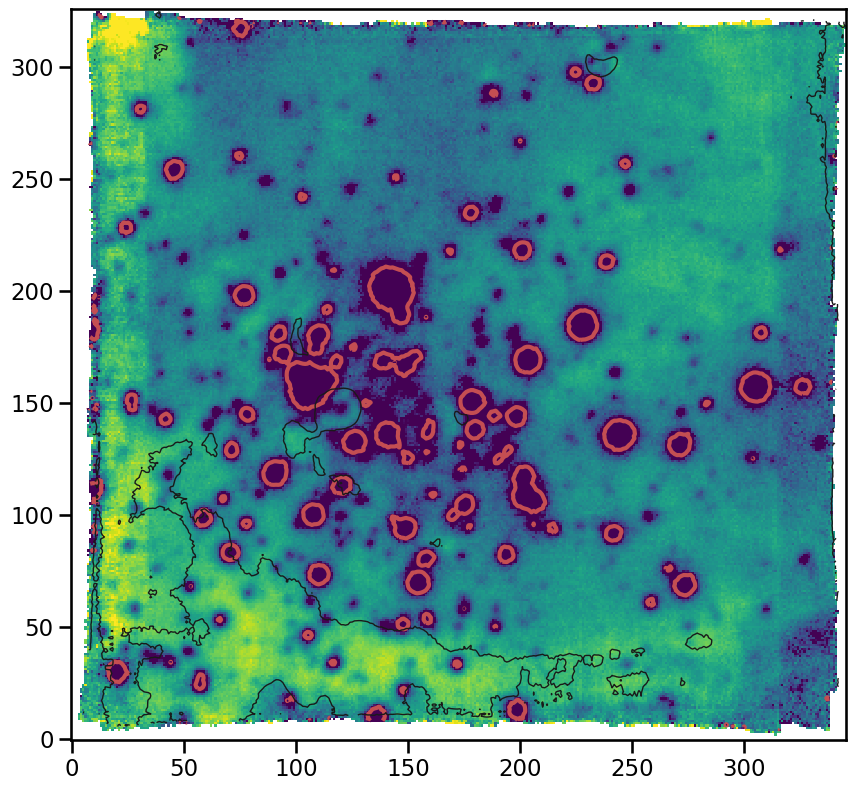

In [43]:
fig, ax = plt.subplots(figsize=(10, 10))
ew6312 = 3 * 1.25 * (im6312 - im6312_zero) / (cont6312 - cont6312_zero)
ew6312.plot(vmin=1.0, vmax=5.0, scale="sqrt")
ax.contour(ew6312.data, levels=[0.5], colors="r", linewidths=3)
ax.contour(im9069.data, levels=[6000.0], colors="k", linewidths=1)

In [44]:
fixmask = (ew6312.data < 1.0) | (im9069.data < 3000.0)
fixmask = fixmask & (im6312c.data < 0.1 * im9069c.data)
fixmask = fixmask & (im6312c.data > 0.2 * im9069c.data)
iborder = 12
fixmask[:iborder, :] = True
fixmask[-iborder:, :] = True
fixmask[:, :iborder] = True
fixmask[:, -iborder:] = True

In [45]:
im6312c.mask = im6312c.mask | fixmask

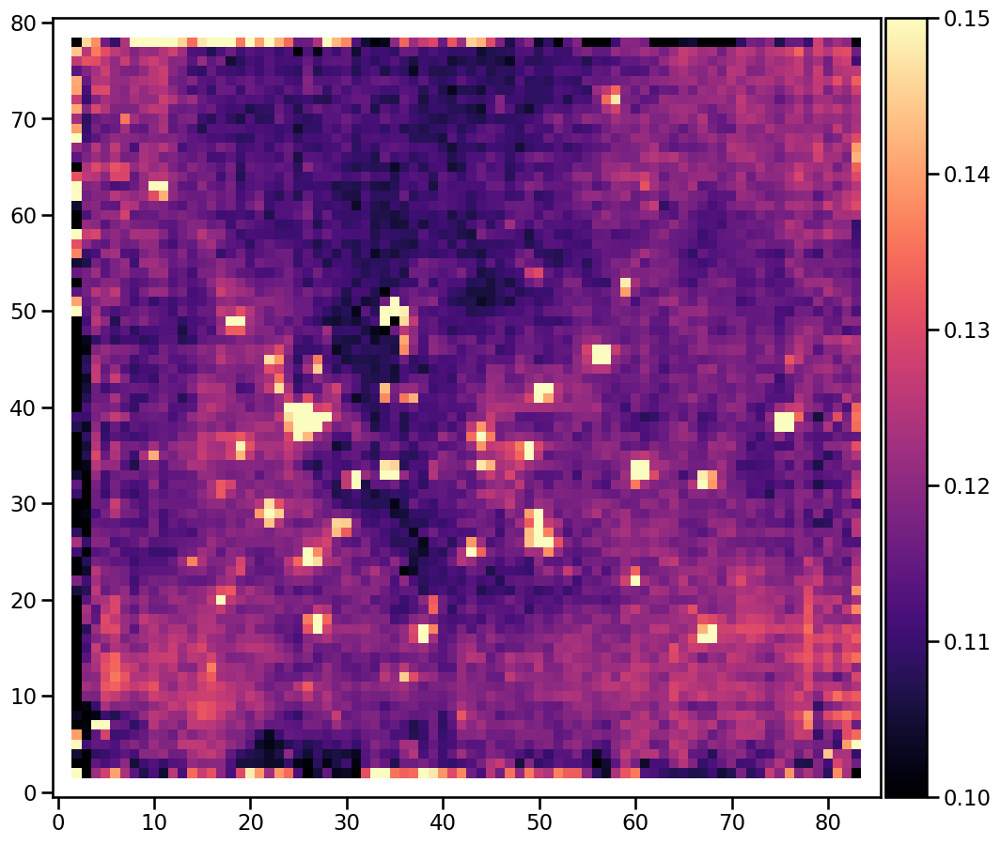

In [46]:
n = 4
fig, ax = plt.subplots(figsize=(12, 12))
(im6312c.rebin(n) / im9069c.rebin(n)).plot(
    vmin=0.1, vmax=0.15, cmap="magma", colorbar="v"
)

Honestly, this looks identical to the last one. So I do not know what I am even doing here. 

/var/folders/0q/3pcjvc3n6sn2wk6g8ck6ry300000gn/T/ipykernel_81351/1463797845.py:2: RuntimeWarning: divide by zero encountered in log10
  x = np.log10(im9069c.rebin(n).data)
/var/folders/0q/3pcjvc3n6sn2wk6g8ck6ry300000gn/T/ipykernel_81351/1463797845.py:3: RuntimeWarning: divide by zero encountered in log10
  y = np.log10(im6312c.rebin(n).data / im9069c.rebin(n).data)
/var/folders/0q/3pcjvc3n6sn2wk6g8ck6ry300000gn/T/ipykernel_81351/1463797845.py:3: RuntimeWarning: invalid value encountered in log10
  y = np.log10(im6312c.rebin(n).data / im9069c.rebin(n).data)


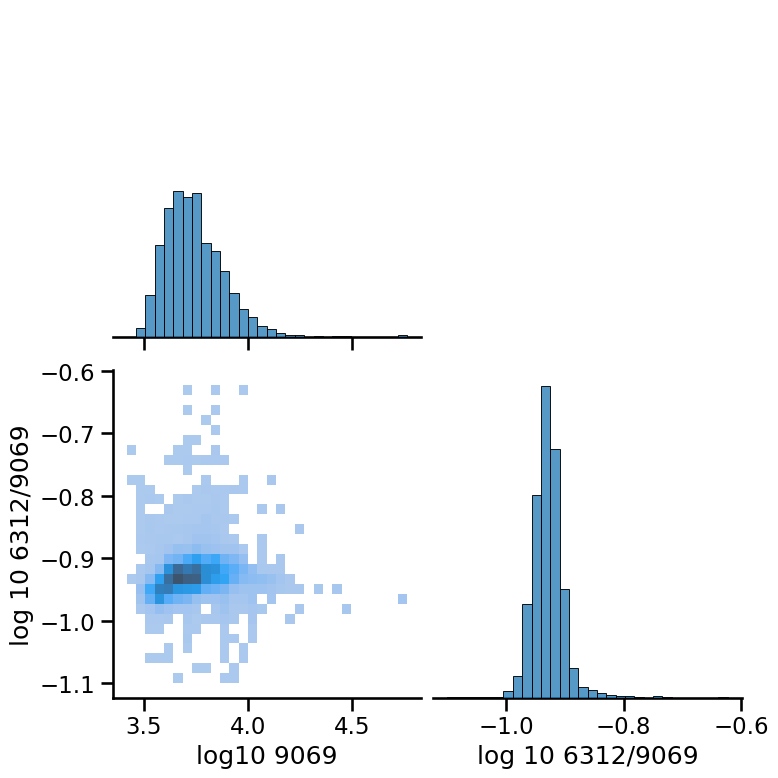

In [47]:
n = 4
x = np.log10(im9069c.rebin(n).data)
y = np.log10(im6312c.rebin(n).data / im9069c.rebin(n).data)
z = im9069c.rebin(n).data
m = (x > 2.5) & (x < 5.5)
m = m & (y > -1.1) & (y < -0.6)
m = m & ~im9069c.rebin(n).mask & ~im6312c.rebin(n).mask
df = pd.DataFrame(
    {
        "log10 9069": x[m],
        "log 10 6312/9069": y[m],
    }
)
kws = dict(weights=z[m], bins=30)
g = sns.pairplot(
    df,
    kind="hist",
    height=4,
    corner=True,
    plot_kws=kws,
    diag_kws=kws,
)

### Convert to actual temperatures with pyneb

In [48]:
s3 = pn.Atom("S", 3)

In [49]:
s3.getTemDen([0.1, 0.2], den=100.0, wave1=6300, wave2=9069)

array([12128.90515246, 19243.6434518 ])

In [50]:
r_s3_grid = np.linspace(0.05, 0.25, 201)
T_s3_grid = s3.getTemDen(r_s3_grid, den=100.0, wave1=6300, wave2=9069)

In [176]:
imT_siii = im6312c.clone(data_init=np.empty)
imT_siii.data[~fixmask] = np.interp(
    im6312c.data[~fixmask] / im9069c.data[~fixmask],
    r_s3_grid,
    T_s3_grid,
    left=np.nan,
    right=np.nan,
)
# imT_siii.mask = imT_siii.mask | fixmask
# imT_siii.data[imT_siii.mask] = np.nan

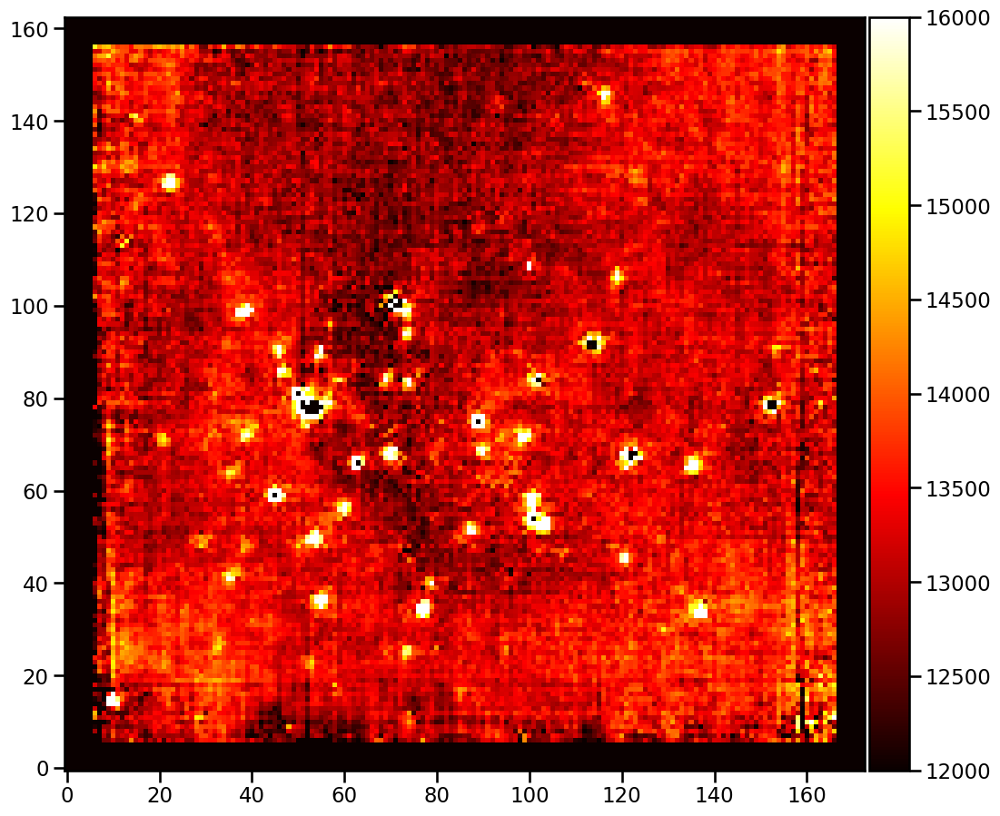

In [177]:
fig, ax = plt.subplots(figsize=(12, 12))
imT_siii.rebin(2).plot(colorbar="v", cmap="hot", vmin=12000, vmax=16000)

In [53]:
badpix = ~np.isfinite(imT_siii.data)
imT_siii.mask = imT_siii.mask | badpix

In [54]:
imT_siii.write(str(ROOT / "data/ngc346-ZZ-T-siii.fits"), savemask="nan")

The rather disappointing conclusion of this is that the [S III] temperatures do vary from about 13 to 16 kK, but they don't show anything special at the bow shock, being about 13.7 +/- 0.4 kK there.

If anything, the T is lower in the bow shock.

Average over whole FOV is 14.2 +/- 0.8 kK after smoothing to eliminate the noise contribution.  This implies $t^2 = 0.003$ in plane of sky, which is small.

## Calculate [O III]/[S III]

In [55]:
im5007 = get_image_raw("o-iii-5006-84")

Correct for extinction:

In [56]:
A5007 = rc.X(5007) * imEBV
im5007c = im5007.copy()
im5007c.data = im5007.data * 10 ** (0.4 * A5007.data)

In [57]:
median_EBV = np.median(imEBV[150:250, 200:300].data)
median_EBV

/Users/will/Dropbox/muse-hii-regions/.venv/lib/python3.14/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


0.1374645935930482

In [58]:
im5007cc = im5007.copy()
im5007cc.data = im5007.data * 10 ** (0.4 * rc.X(5007) * median_EBV)
im9069cc = im9069.copy()
im9069cc.data = im9069.data * 10 ** (0.4 * rc.X(9069) * median_EBV)

Quick look:

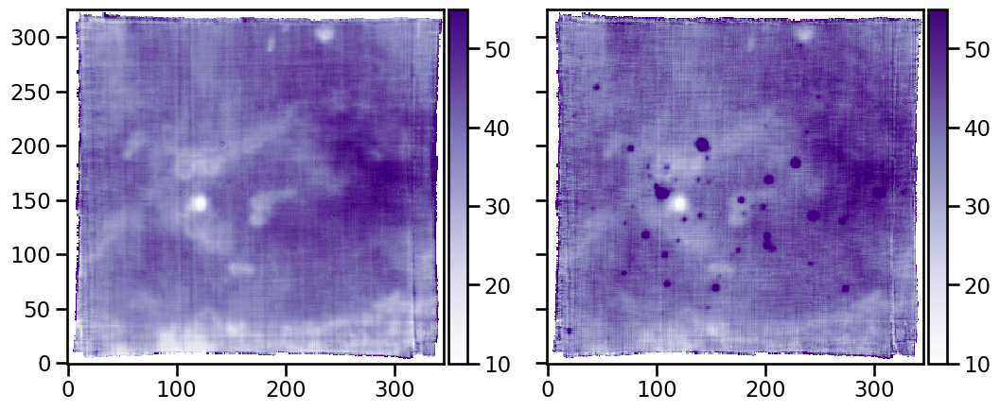

In [59]:
fig, axes = plt.subplots(1, 2, sharey=True, figsize=(12, 6))
((im5007cc) / im9069cc).plot(
    vmin=10,
    vmax=55,
    colorbar="v",
    scale="linear",
    cmap="Purples",
    ax=axes[0],
)
((im5007c) / im9069c).plot(
    vmin=10,
    vmax=55,
    colorbar="v",
    scale="linear",
    cmap="Purples",
    ax=axes[1],
)

The left panel is with a median reddening. The right panel is with a pixel-by-pixel reddening but that fails at the position of stars. 

Check zero points:

Text(0.5, 0.98, 'Correlation between [S III] 9069 and [O III] 5007 brightness')

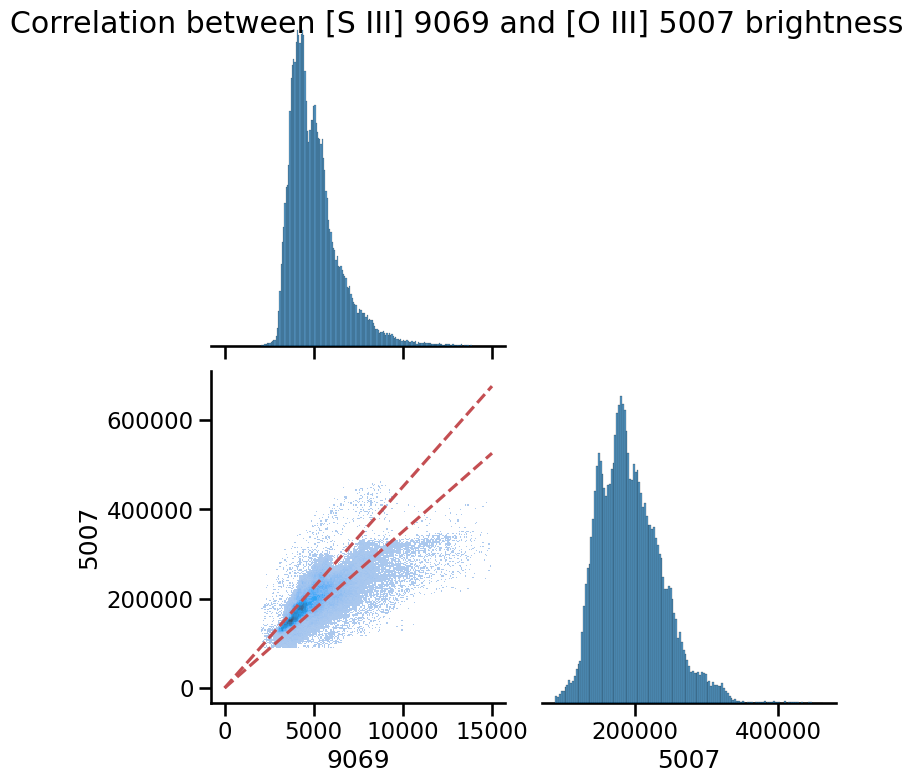

In [60]:
imax = 15000
imin = 2000
slope = 45
slope2 = 35
x = im9069cc.data
y = im5007cc.data
m = x < imax
m = m & (x > imin)
m = m & (y < slope * imax)
m = m & (y > slope * imin)
m = m & ~im9069c.mask & ~im5007c.mask
df = pd.DataFrame(
    {
        "9069": x[m],
        "5007": y[m],
    }
)
g = sns.pairplot(
    df,
    kind="hist",
    height=4,
    corner=True,
)
# g.axes[1, 0].axvline(0.0, color="r")
# g.axes[1, 0].axhline(0.0, color="r")
g.axes[1, 0].plot([0, imax], [0, slope * imax], "--", color="r")
g.axes[1, 0].plot([0, imax], [0, slope2 * imax], "--", color="r")
g.fig.suptitle("Correlation between [S III] 9069 and [O III] 5007 brightness")

Text(0.5, 0.98, 'Correlation between [S III] 9069 and [O III] / [S III] ratio')

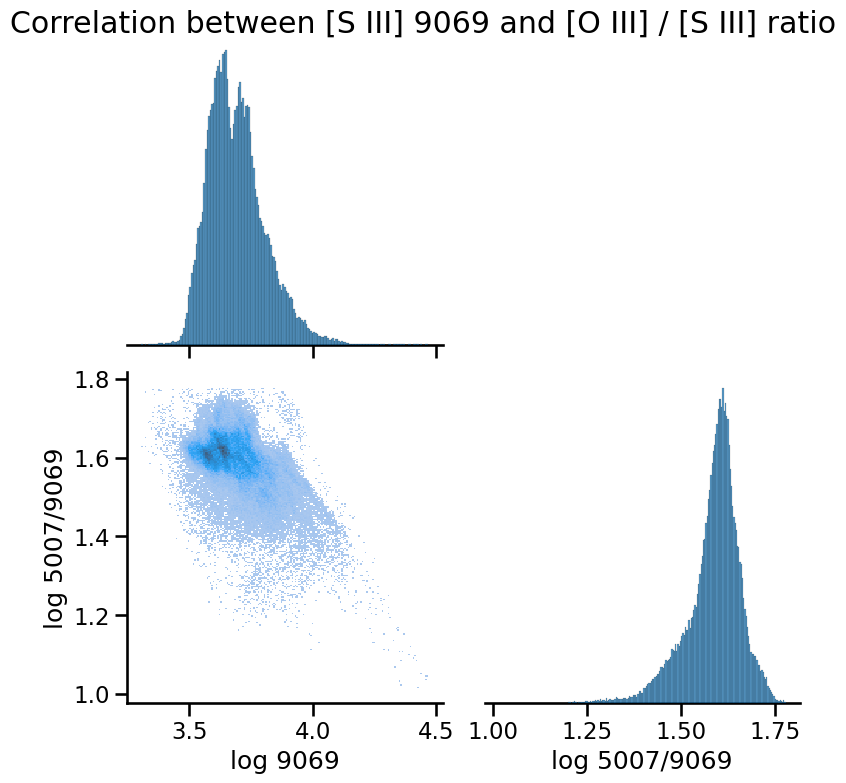

In [61]:
slope = 45
slope2 = 35
x = im9069cc.data
y = im5007cc.data
m = x > imin
m = m & (y > 10 * x) & (y < 60 * x)
m = m & ~im9069cc.mask & ~im5007cc.mask
df = pd.DataFrame(
    {
        "log 9069": np.log10(x[m]),
        "log 5007/9069": np.log10(y[m] / x[m]),
    }
)
g = sns.pairplot(
    df,
    kind="hist",
    height=4,
    corner=True,
)
g.fig.suptitle("Correlation between [S III] 9069 and [O III] / [S III] ratio")

In [62]:
imR_oiii_siii = (im5007cc) / im9069cc
imR_oiii_siii.write(
    str(ROOT / "data/ngc346-ZZ-R-oiii-5007-siii-9069.fits"), savemask="nan"
)

## Calculate [O III] / Hβ

This might be better since at least it is not affected by reddening.

Text(0.5, 0.98, 'Correlation between Hβ 4861 and [O III] 5007 brightness')

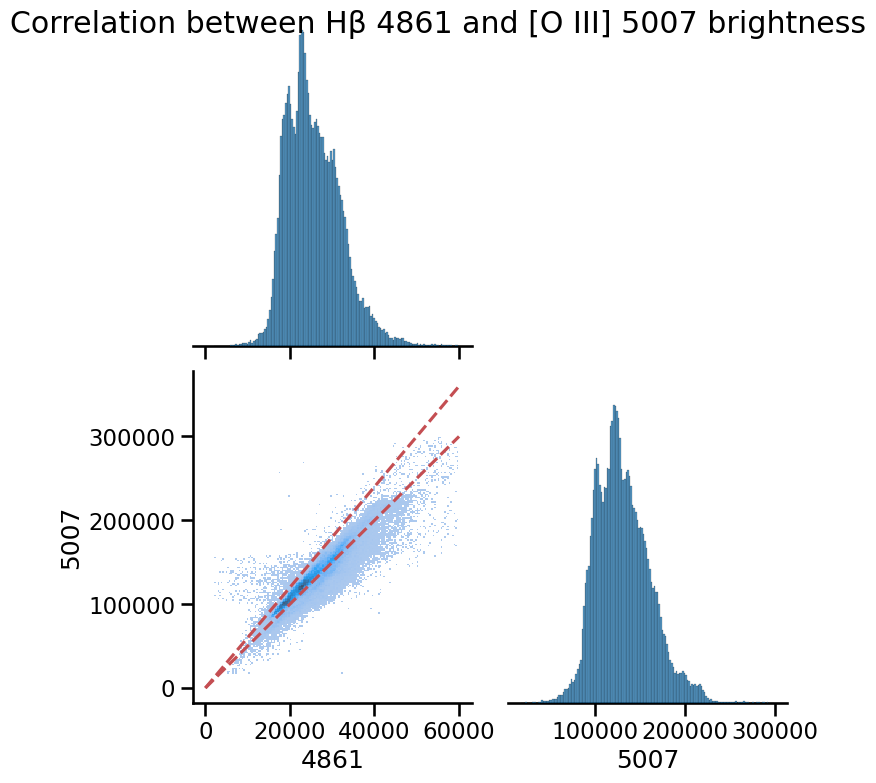

In [63]:
imax = 60000
imin = 2000
slope = 5.0
slope2 = 6.0
x = imhb.data
y = im5007.data
m = x < imax
m = m & (x > imin)
m = m & (y < slope * imax)
m = m & (y > slope * imin)
m = m & ~imhb.mask & ~im5007.mask
df = pd.DataFrame(
    {
        "4861": x[m],
        "5007": y[m],
    }
)
g = sns.pairplot(
    df,
    kind="hist",
    height=4,
    corner=True,
)
g.axes[1, 0].plot([0, imax], [0, slope * imax], "--", color="r")
g.axes[1, 0].plot([0, imax], [0, slope2 * imax], "--", color="r")
g.fig.suptitle("Correlation between Hβ 4861 and [O III] 5007 brightness")

Text(0.5, 0.98, 'Correlation between Hβ 4861 and [O III] / Hβ ratio')

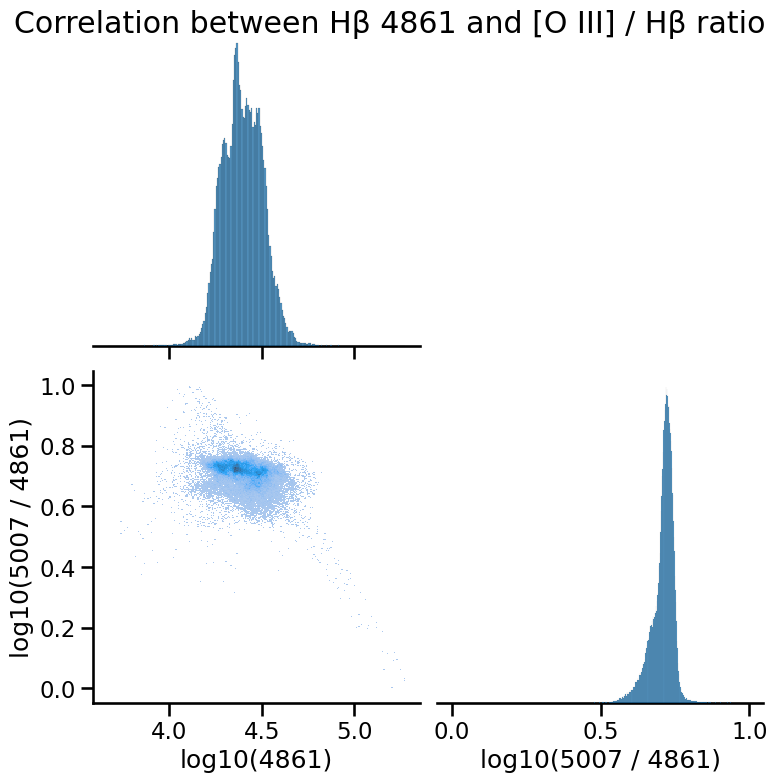

In [64]:
n = 1
x = imhb.rebin(n).data
y = im5007.rebin(n).data
m = (x > imin) & (y > x) & (y < 10 * x)
m = m & ~imhb.rebin(n).mask & ~im5007.rebin(n).mask
df = pd.DataFrame(
    {
        "log10(4861)": np.log10(x[m]),
        "log10(5007 / 4861)": np.log10(y[m] / x[m]),
    }
)
g = sns.pairplot(
    df,
    kind="hist",
    height=4,
    corner=True,
)
g.fig.suptitle("Correlation between Hβ 4861 and [O III] / Hβ ratio")

In [65]:
imR_oiii_hb = (im5007) / (imhb)
imR_oiii_hb.write(str(ROOT / "data/ngc346-ZZ-R-oiii-5007-hi-4861.fits"), savemask="nan")

In [66]:
im4740 = get_image_raw("ar-iv-4740-17")

In [67]:
from astropy.convolution import convolve_fft
from astropy.convolution import Gaussian2DKernel

In [68]:
im = convolve_fft(im4740.data, Gaussian2DKernel(5.0))

Text(0.5, 1.0, '[O III] / Hβ')

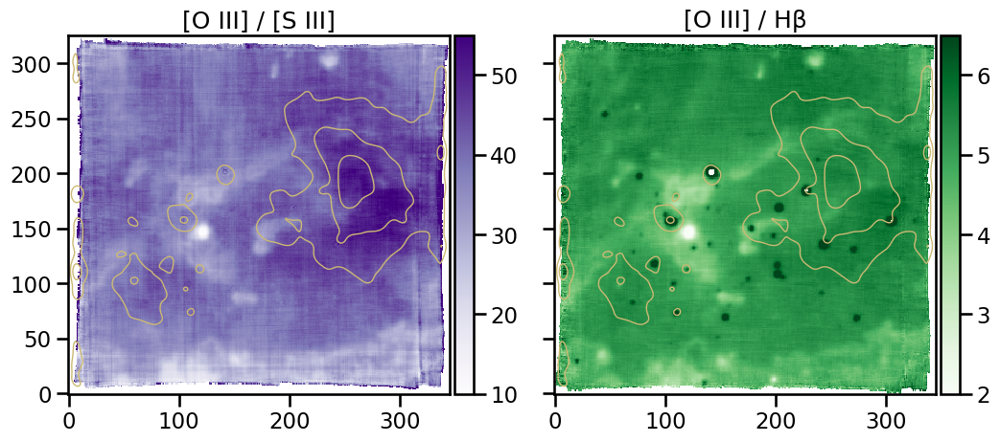

In [69]:
fig, axes = plt.subplots(1, 2, sharey=True, figsize=(12, 6))
imR_oiii_siii.plot(
    vmin=10,
    vmax=55,
    colorbar="v",
    scale="linear",
    ax=axes[0],
    cmap="Purples",
)
imR_oiii_hb.plot(
    vmin=2,
    vmax=6.5,
    colorbar="v",
    scale="linear",
    ax=axes[1],
    cmap="Greens",
)
for ax in axes:
    ax.contour(im, levels=[100, 150, 200], linewidths=1, colors="y")
axes[0].set_title("[O III] / [S III]")
axes[1].set_title("[O III] / Hβ")

So, the bow shock shows up much better in [O III]/[S III] than it does in [O III]/Hb.  This implies that it must be a lack of [S III], rather than an excess of [O III] that characterises the bow shock.

## Calculate He I / Hβ

Let us see if this has a hole in it where the He II is coming from.

In [70]:
im5875 = get_image_raw("he-i-5875-62")
im4922 = get_image_raw("he-i-4921-93")
im5048 = get_image_raw("he-i-5047-74")
im5016 = get_image_raw("he-i-5015-68")
im6678 = get_image_raw("he-i-6678-15")
im7065 = get_image_raw("he-i-7065-28")
im7281 = get_image_raw("he-i-7281-35")

Text(0.5, 1.0, 'He I 7065')

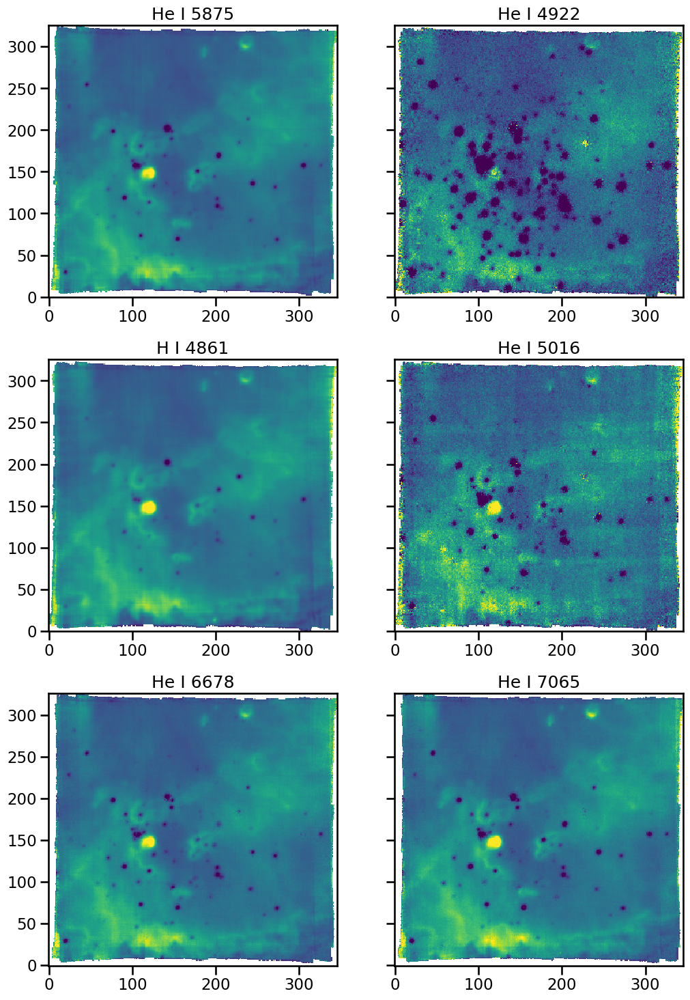

In [71]:
fig, axes = plt.subplots(3, 2, sharey=True, figsize=(12, 18))
im5875.plot(ax=axes[0, 0], vmin=0, vmax=7500)
im4922.plot(ax=axes[0, 1], vmin=0, vmax=550)
(imhb).plot(ax=axes[1, 0], vmin=0, vmax=60000)
im5016.plot(ax=axes[1, 1], vmin=0, vmax=700)
im6678.plot(ax=axes[2, 0], vmin=0, vmax=2000)
im7065.plot(ax=axes[2, 1], vmin=0, vmax=1400)
axes[0, 0].set_title("He I 5875")
axes[0, 1].set_title("He I 4922")
axes[1, 0].set_title("H I 4861")
axes[1, 1].set_title("He I 5016")
axes[2, 0].set_title("He I 6678")
axes[2, 1].set_title("He I 7065")

So 5875 is 10 to 100 times brighter than the other two. And it is almost identical to Hβ!

Text(0.5, 0.98, 'Correlation between Hβ 4861 and He I 5875 brightness')

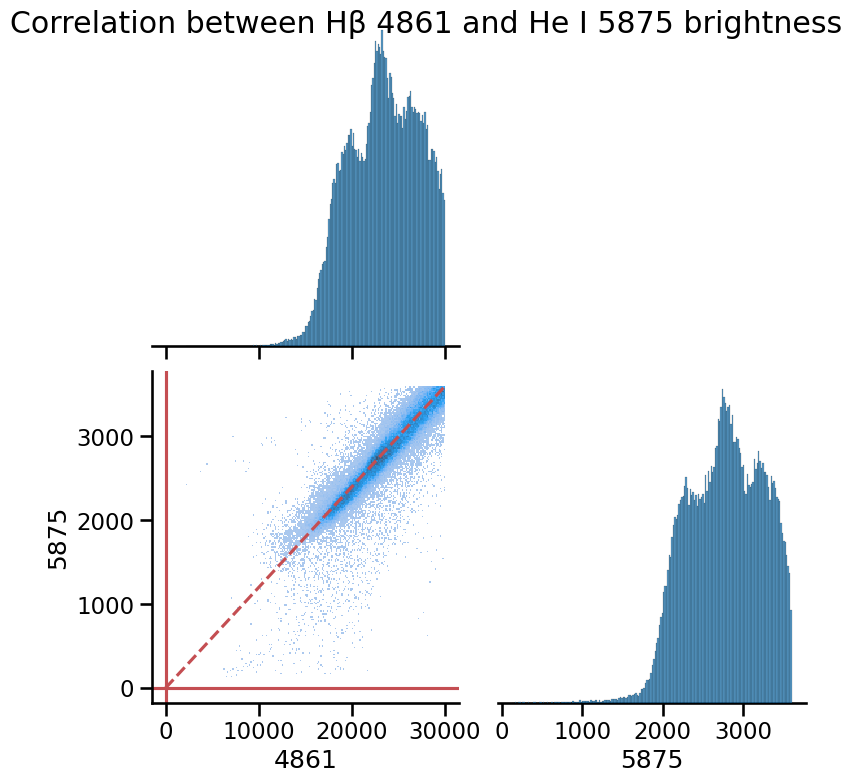

In [72]:
imax = 30000
imin = 1000
slope = 0.12
x = imhb.data
y = im5875.data
m = x < imax
m = m & (x > imin)
m = m & (y < slope * imax)
m = m & (y > imin * slope)
m = m & ~imhb.mask & ~im5875.mask
df = pd.DataFrame(
    {
        "4861": x[m],
        "5875": y[m],
    }
)
g = sns.pairplot(
    df,
    kind="hist",
    height=4,
    corner=True,
    plot_kws=dict(weights=x[m], bins=200),
    diag_kws=dict(weights=x[m], bins=200),
)
g.axes[1, 0].axvline(0.0, color="r")
g.axes[1, 0].axhline(0.0, color="r")
g.axes[1, 0].plot([0, imax], [0, slope * imax], "--", color="r")
g.fig.suptitle("Correlation between Hβ 4861 and He I 5875 brightness")

Text(0.5, 0.98, 'Correlation between Hβ 4861 and He I 5875 brightness')

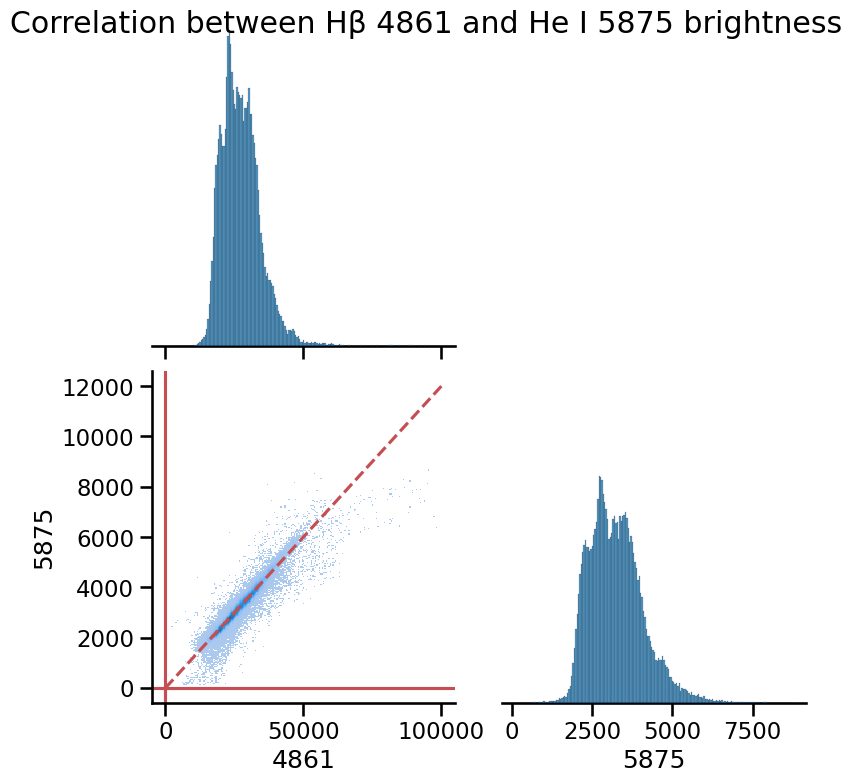

In [73]:
imax = 100000
imin = 1000
slope = 0.12
x = imhb.data
y = im5875.data
m = x < imax
m = m & (x > imin)
m = m & (y < slope * imax)
m = m & (y > imin * slope)
m = m & ~imhb.mask & ~im5875.mask
df = pd.DataFrame(
    {
        "4861": x[m],
        "5875": y[m],
    }
)
g = sns.pairplot(
    df,
    kind="hist",
    height=4,
    corner=True,
    plot_kws=dict(weights=x[m], bins=200),
    diag_kws=dict(weights=x[m], bins=200),
)
g.axes[1, 0].axvline(0.0, color="r")
g.axes[1, 0].axhline(0.0, color="r")
g.axes[1, 0].plot([0, imax], [0, slope * imax], "--", color="r")
g.fig.suptitle("Correlation between Hβ 4861 and He I 5875 brightness")

In [74]:
imR_hei_hb = im5875 / (imhb)

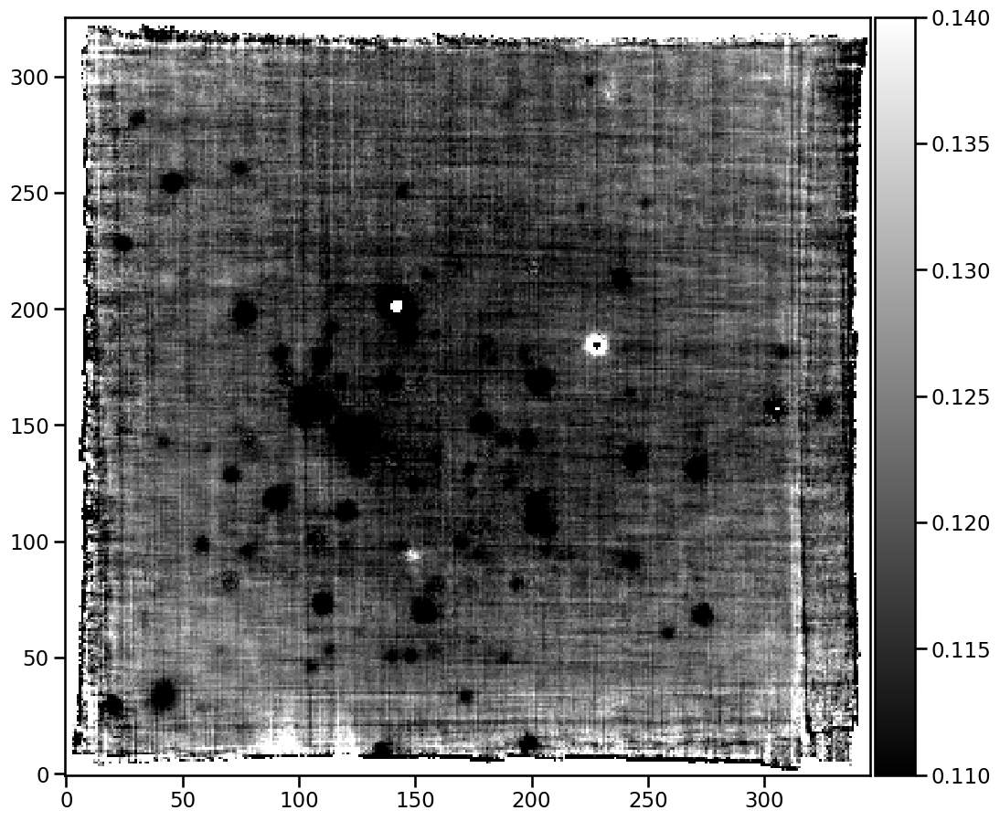

In [75]:
fig, ax = plt.subplots(figsize=(12, 12))
imR_hei_hb.plot(colorbar="v", cmap="gray", vmin=0.11, vmax=0.14)

In [76]:
red_R_hei_hb = imR_hei_hb.copy()
red_R_hei_hb.data = 10 ** (0.4 * imEBV.data * (rc.X(4861) - rc.X(5875)))

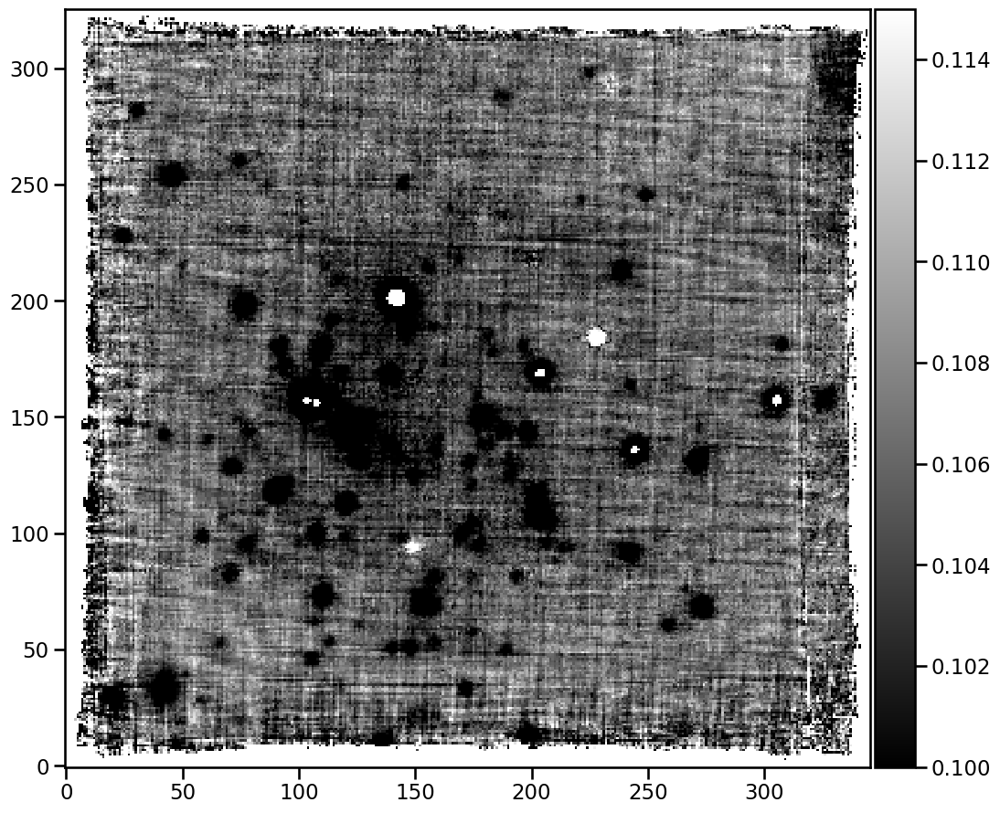

In [77]:
fig, ax = plt.subplots(figsize=(12, 12))
(imR_hei_hb / red_R_hei_hb).plot(colorbar="v", cmap="gray", vmin=0.1, vmax=0.115)

So if we correct it for reddening, then lots of spurious structure disappears.  But we are left with very little variation at all, except for at the mYSO and the top right corner, which both show low He I.

### He I emissivities

In [78]:
hei = pn.RecAtom("He", 1)

In [79]:
dens = [10, 50, 100, 200, 400, 800]
tems = [11000, 13000, 15000, 18000]
e4713 = hei.getEmissivity(tems, dens, wave=4713)
e4921 = hei.getEmissivity(tems, dens, wave=4921)
e5016 = hei.getEmissivity(tems, dens, wave=5016)
e5047 = hei.getEmissivity(tems, dens, wave=5047)
e5876 = hei.getEmissivity(tems, dens, wave=5876)
e6678 = hei.getEmissivity(tems, dens, wave=6678)
e7065 = hei.getEmissivity(tems, dens, wave=7065)
e7281 = hei.getEmissivity(tems, dens, wave=7281)

In [80]:
np.round(e5016 / e5876, 3)

array([[0.217, 0.217, 0.217, 0.215, 0.214, 0.212],
       [0.229, 0.228, 0.228, 0.224, 0.221, 0.217],
       [0.239, 0.238, 0.237, 0.23 , 0.224, 0.219],
       [0.253, 0.249, 0.248, 0.236, 0.227, 0.218]])

In [81]:
np.round(e5876 / e6678, 3)

array([[3.521, 3.522, 3.523, 3.526, 3.529, 3.532],
       [3.53 , 3.53 , 3.53 , 3.531, 3.533, 3.534],
       [3.538, 3.535, 3.534, 3.531, 3.528, 3.525],
       [3.548, 3.539, 3.535, 3.521, 3.508, 3.498]])

In [82]:
np.round((e7281 + e7065) / e6678, 3)

array([[0.828, 0.847, 0.855, 0.912, 0.966, 1.018],
       [0.91 , 0.935, 0.946, 1.02 , 1.089, 1.153],
       [0.989, 1.018, 1.031, 1.114, 1.188, 1.256],
       [1.102, 1.133, 1.145, 1.226, 1.294, 1.352]])

In [83]:
np.round(e4713 / e5876, 3)

array([[0.04 , 0.04 , 0.041, 0.041, 0.042, 0.042],
       [0.045, 0.045, 0.045, 0.046, 0.046, 0.047],
       [0.049, 0.05 , 0.05 , 0.05 , 0.05 , 0.051],
       [0.056, 0.056, 0.056, 0.056, 0.056, 0.056]])

### He I T-sensitive ratio

The (7065 + 7281)/6678 ratio depends on density and temperature

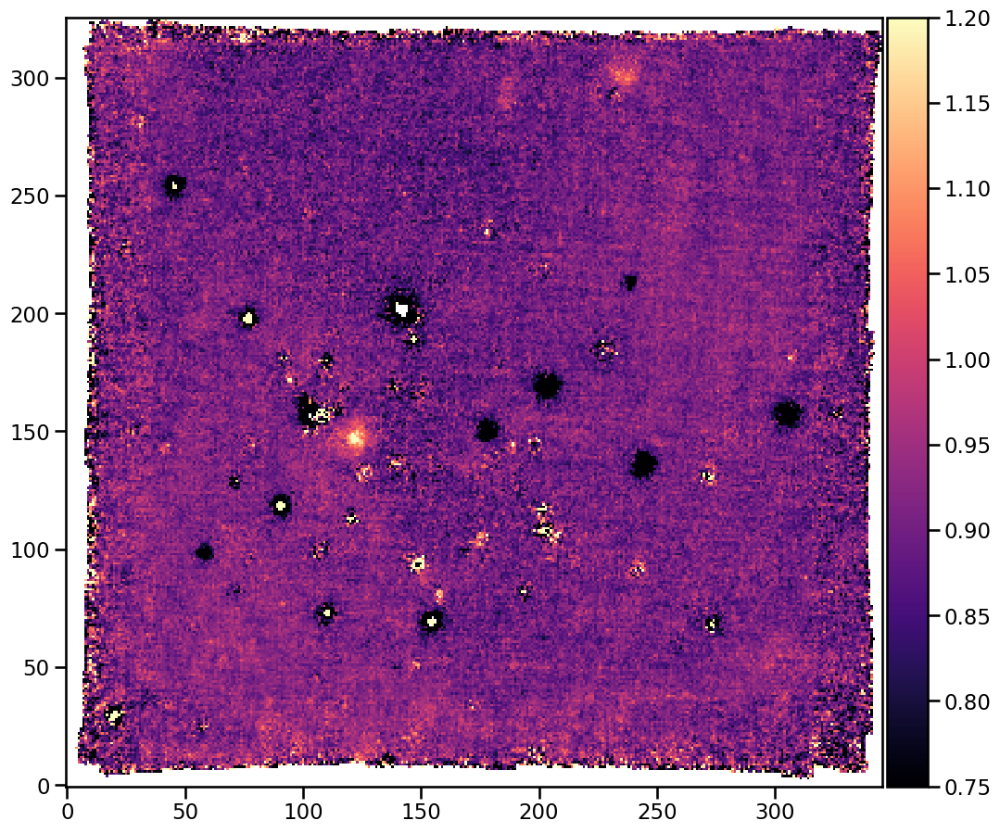

In [84]:
fig, ax = plt.subplots(figsize=(12, 12))
((im7065 + im7281) / im6678).plot(colorbar="v", cmap="magma", vmin=0.75, vmax=1.2)

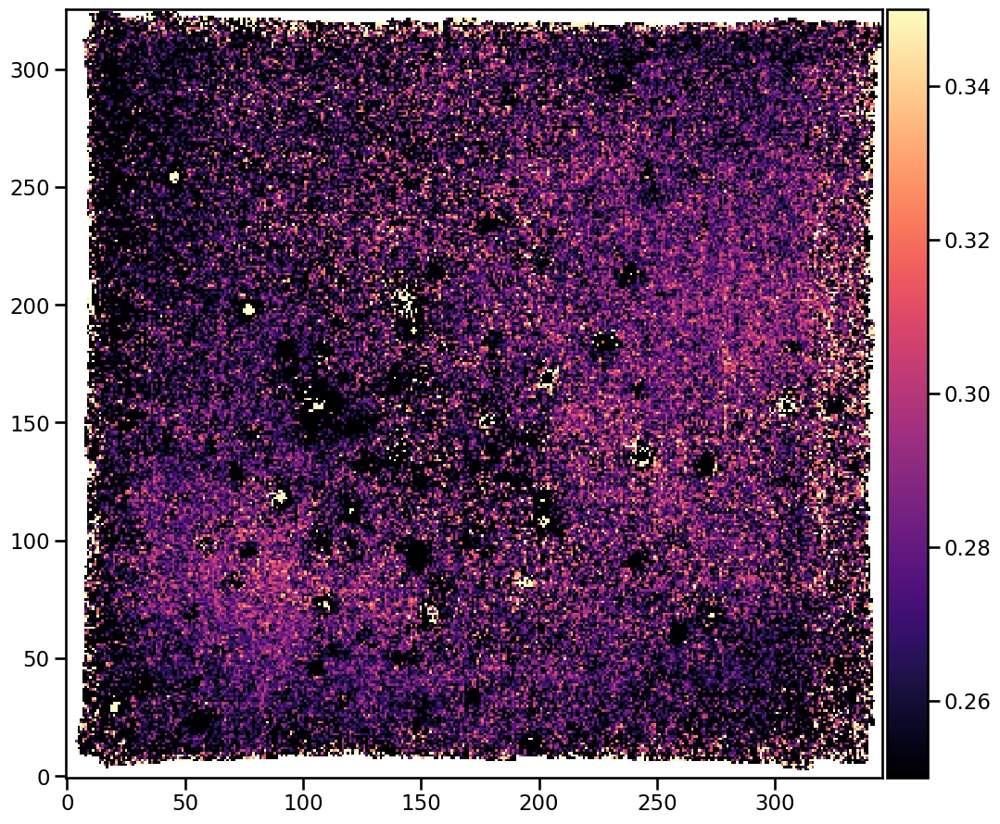

In [85]:
fig, ax = plt.subplots(figsize=(12, 12))
(im7281 / im7065).plot(colorbar="v", cmap="magma", vmin=0.25, vmax=0.35)

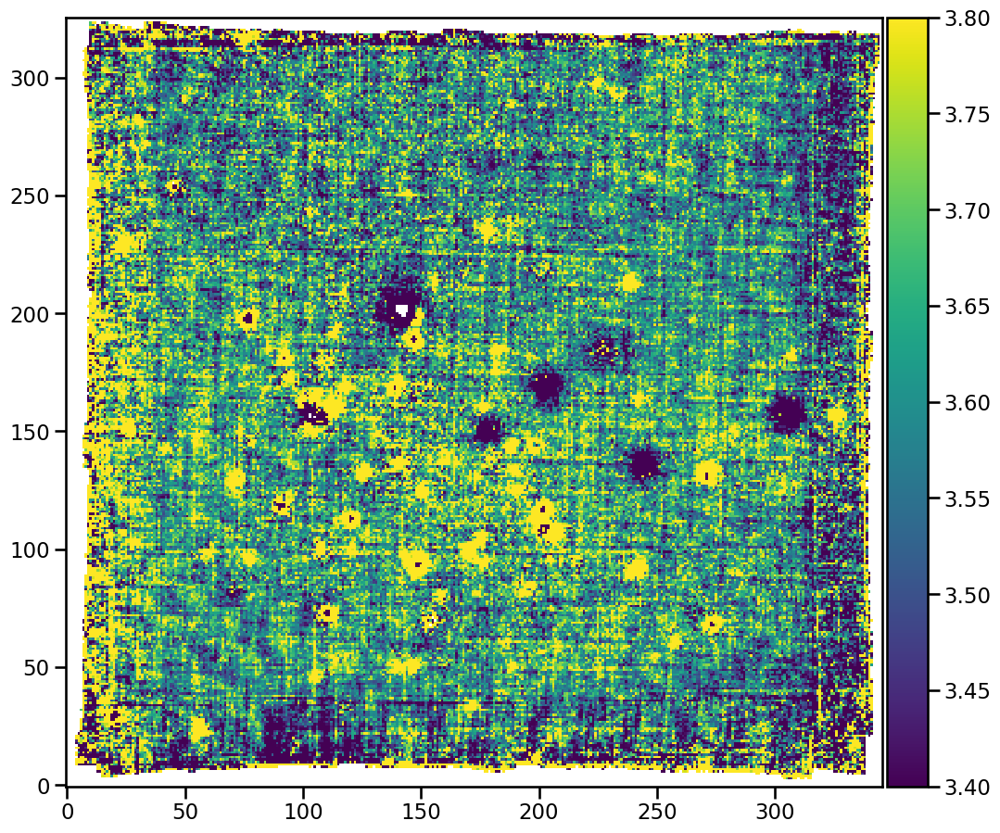

In [86]:
fig, ax = plt.subplots(figsize=(12, 12))
(im5875/ im6678).plot(colorbar="v", cmap="viridis", vmin=3.4, vmax=3.8)

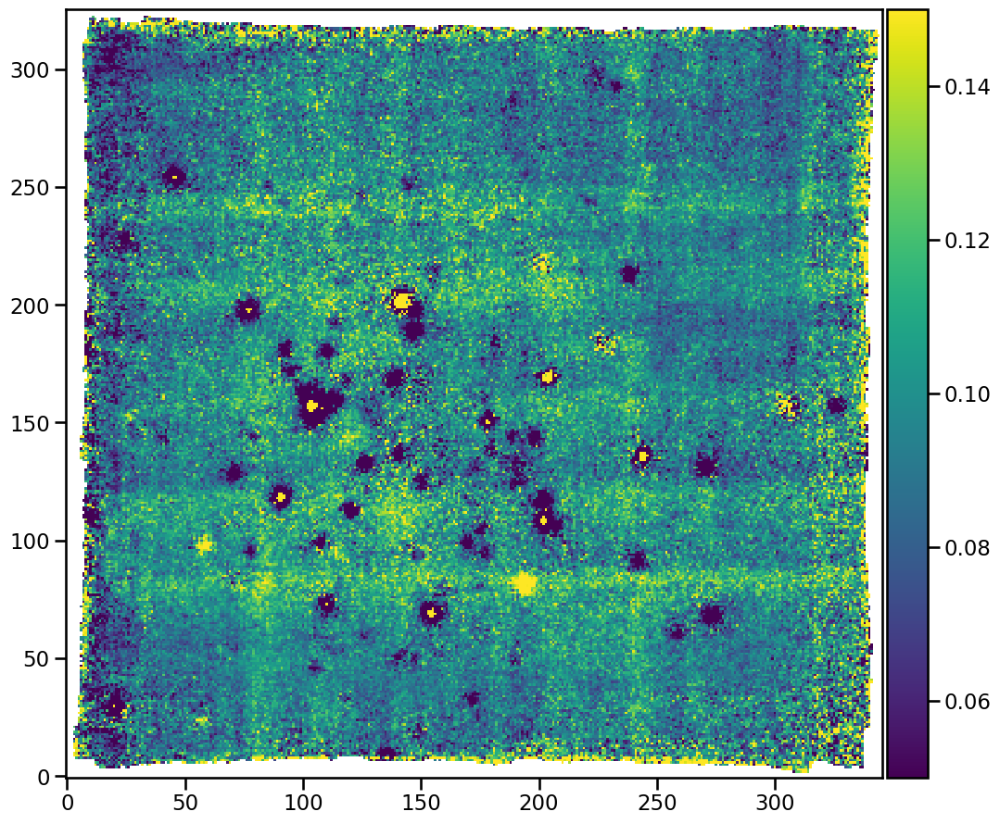

In [87]:
fig, ax = plt.subplots(figsize=(12, 12))
(im5016 / im5875).plot(colorbar="v", cmap="viridis", vmin=0.05, vmax=0.15)

## Calculate He II / Hβ



In [88]:
im4686 = get_image_raw("he-ii-4685-68")

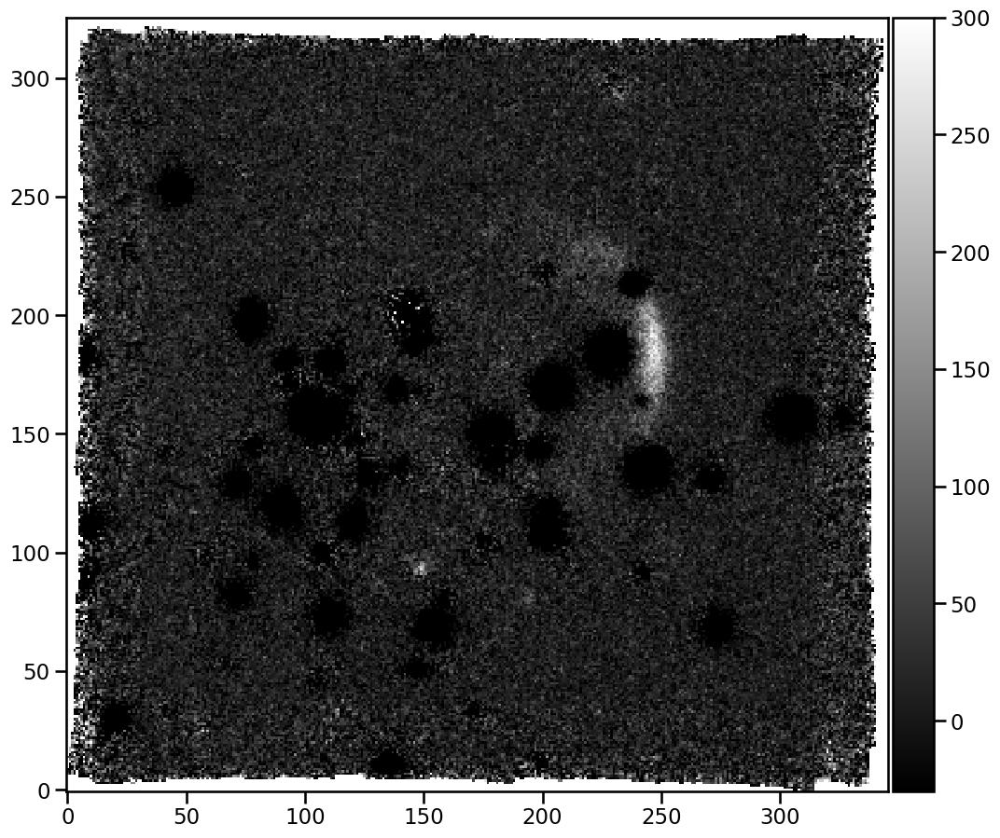

In [89]:
fig, ax = plt.subplots(figsize=(12, 12))
im4686.plot(colorbar="v", cmap="gray", vmin=-30.0, vmax=300)

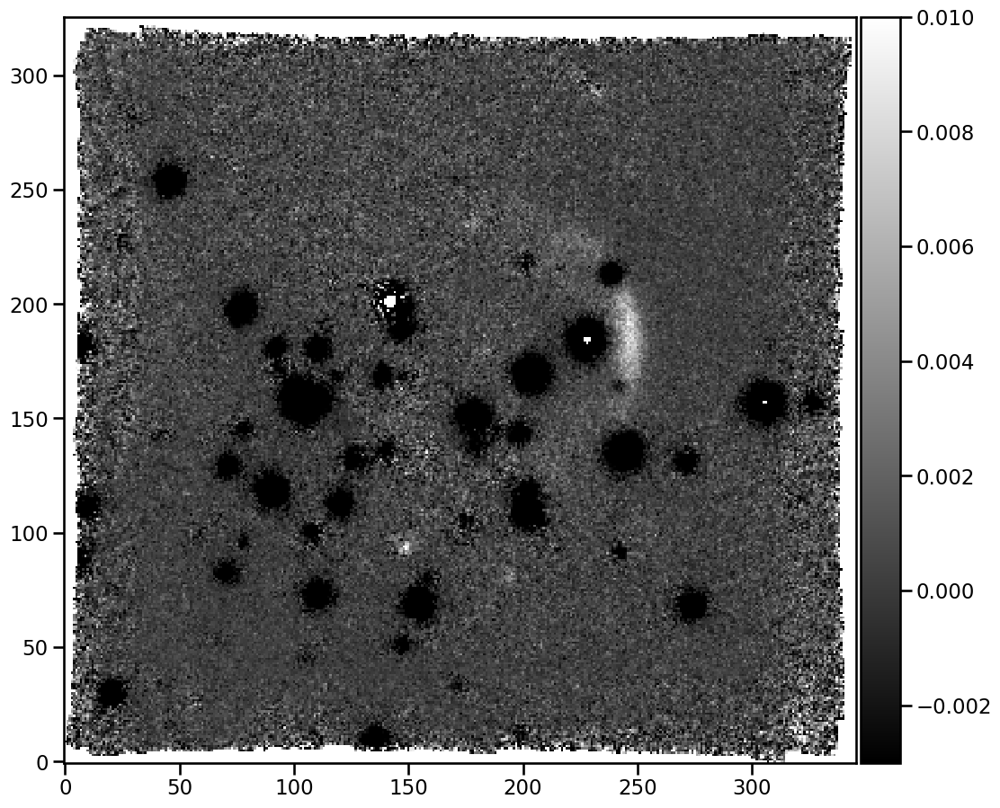

In [90]:
imR_heii_hb = im4686 / imhb

fig, ax = plt.subplots(figsize=(12, 12))
imR_heii_hb.plot(colorbar="v", cmap="gray", vmin=-0.003, vmax=0.01)

Text(0.5, 0.98, 'Correlation between He II / Hβ and He I / Hβ ratios')

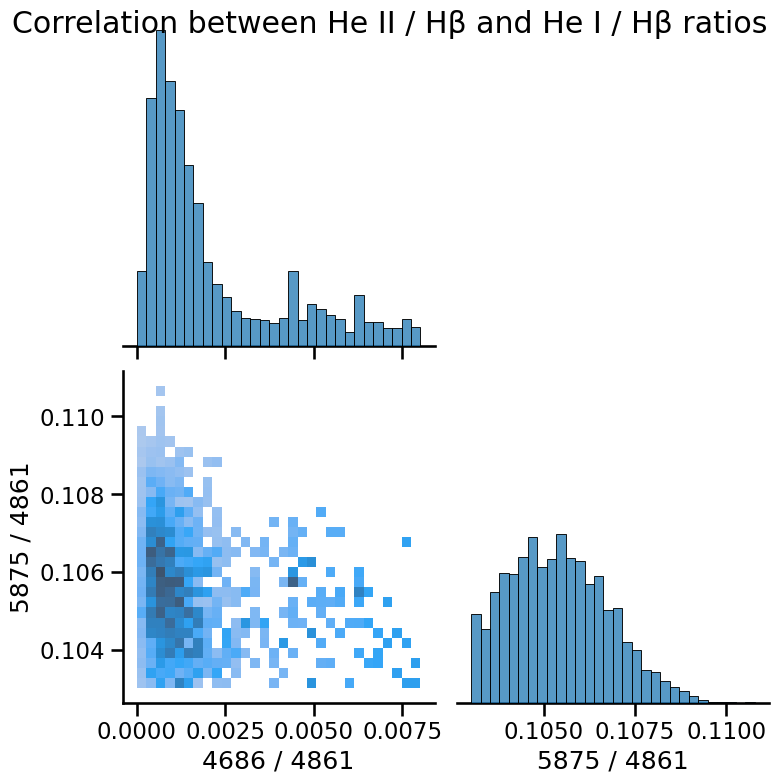

In [91]:
n = 2
xslice, yslice = slice(200, 300), slice(100, 250)
x = imR_heii_hb[yslice, xslice].rebin(n).data
y = (
    imR_hei_hb[yslice, xslice].rebin(n).data
    / red_R_hei_hb[yslice, xslice].rebin(n).data
)
z = im4686[yslice, xslice].rebin(n).data
m = x < 0.03
m = m & (x > 0)
m = m & (y < 0.113)
m = m & (y > 0.103)
m = (
    m
    & ~imR_heii_hb[yslice, xslice].rebin(n).mask
    & ~imR_hei_hb[yslice, xslice].rebin(n).mask
)
df = pd.DataFrame(
    {
        "4686 / 4861": x[m],
        "5875 / 4861": y[m],
    }
)
g = sns.pairplot(
    df,
    kind="hist",
    height=4,
    corner=True,
    plot_kws=dict(weights=z[m], bins=30),
    diag_kws=dict(weights=z[m], bins=30),
)
g.fig.suptitle("Correlation between He II / Hβ and He I / Hβ ratios")

So there is a *tiny* change in 5875/4861 from 0.109 to 0.107 as 4686/4861 increases.

In [92]:
df["high"] = df["4686 / 4861"] > 0.005
df

,4686 / 4861,5875 / 4861,high
0,0.000456,0.104744,False
1,0.000015,0.103495,False
2,0.001615,0.106001,False
3,0.000686,0.105375,False
4,0.000410,0.105410,False
...,...,...,...
2437,0.000456,0.106067,False
2438,0.000342,0.105009,False
2439,0.000306,0.104888,False
2440,0.000108,0.103916,False


<Axes: xlabel='5875 / 4861', ylabel='Probability'>

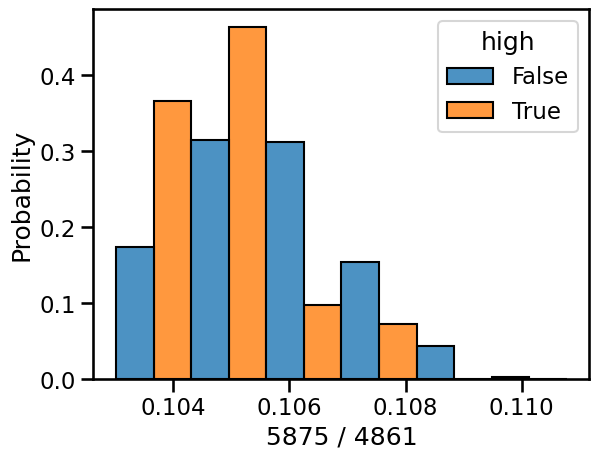

In [93]:
sns.histplot(
    data=df,
    x="5875 / 4861",
    hue="high",
    multiple="dodge",
    shrink=1.0,
    stat="probability",
    common_norm=False,
    alpha=0.8,
    bins=6,
)

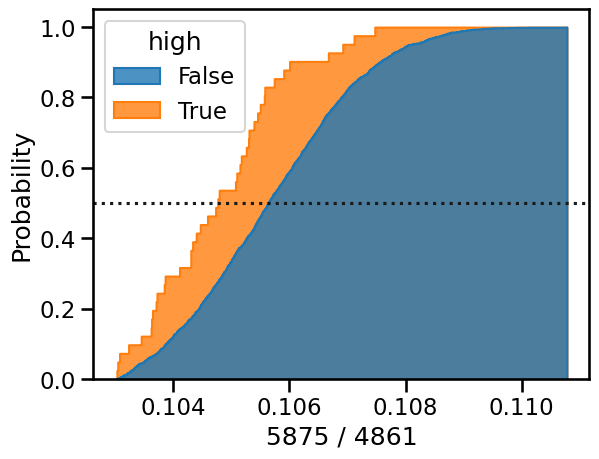

In [94]:
df["high"] = df["4686 / 4861"] > 0.005
sns.histplot(
    data=df,
    x="5875 / 4861",
    hue="high",
    #multiple="dodge",
    shrink=1.0,
    stat="probability",
    cumulative=True,
    common_norm=False,
    alpha=0.8,
    bins=1000,
    element="step",
).axhline(0.5, linestyle="dotted", color="k")

Try to remove the pattern noise

In [95]:
imR_heii_hb_fake = imR_heii_hb.copy()
m = imR_heii_hb_fake.data > 0.01
imR_heii_hb_fake.data[m] = np.nan
vv = np.nanmedian(imR_heii_hb_fake.data, axis=0, keepdims=True)
hh = np.nanmedian(imR_heii_hb_fake.data, axis=1, keepdims=True)
imR_heii_hb_fake.data = vv + hh
imR_heii_hb_fake.data -= np.nanmedian(vv + hh)
imR_heii_hb_c = imR_heii_hb.copy()
imR_heii_hb_c.data -= imR_heii_hb_fake.data

/var/folders/0q/3pcjvc3n6sn2wk6g8ck6ry300000gn/T/ipykernel_81351/1126909528.py:4: RuntimeWarning: All-NaN slice encountered
  vv = np.nanmedian(imR_heii_hb_fake.data, axis=0, keepdims=True)
/var/folders/0q/3pcjvc3n6sn2wk6g8ck6ry300000gn/T/ipykernel_81351/1126909528.py:5: RuntimeWarning: All-NaN slice encountered
  hh = np.nanmedian(imR_heii_hb_fake.data, axis=1, keepdims=True)


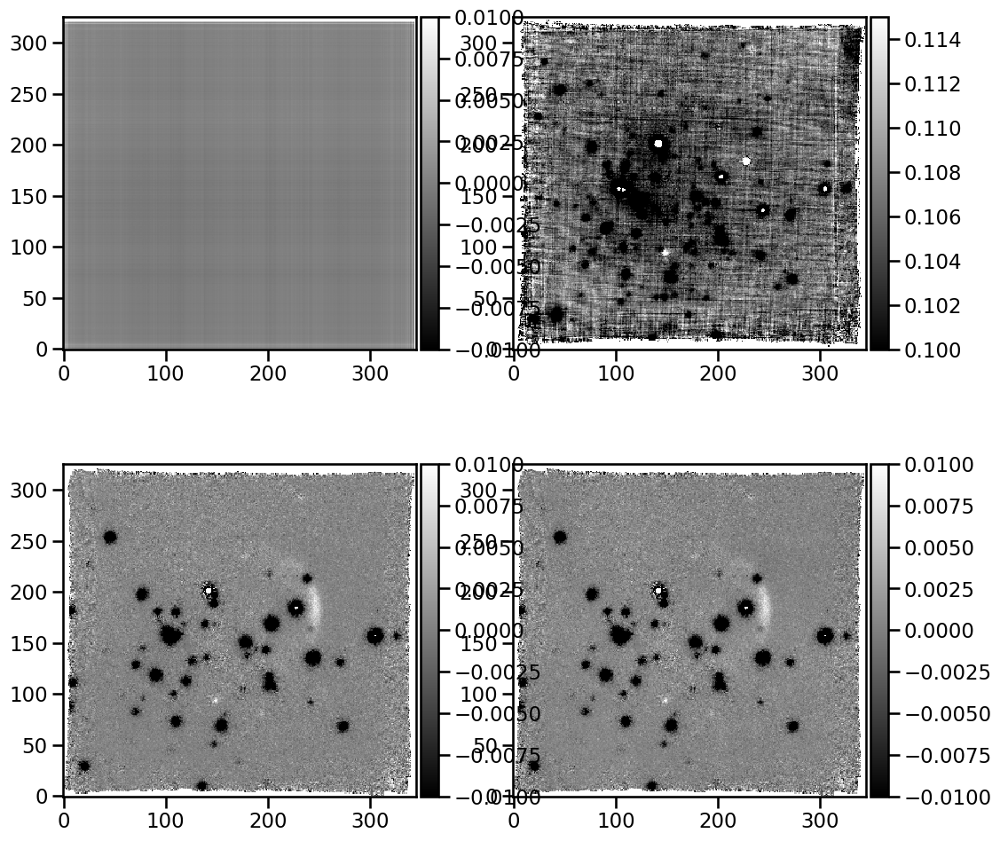

In [96]:
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
imR_heii_hb_fake.plot(ax=axes[0, 0], colorbar="v", cmap="gray", vmin=-0.01, vmax=0.01)
(imR_hei_hb / red_R_hei_hb).plot(ax=axes[0, 1], 
                colorbar="v", cmap="gray", 
                vmin=0.1, vmax=0.115)
imR_heii_hb.plot(ax=axes[1, 0], colorbar="v", cmap="gray", vmin=-0.01, vmax=0.01)
imR_heii_hb_c.plot(ax=axes[1, 1], colorbar="v", cmap="gray", vmin=-0.01, vmax=0.01)

Text(0.5, 0.98, 'Correlation between He II / Hβ and He I / Hβ ratios')

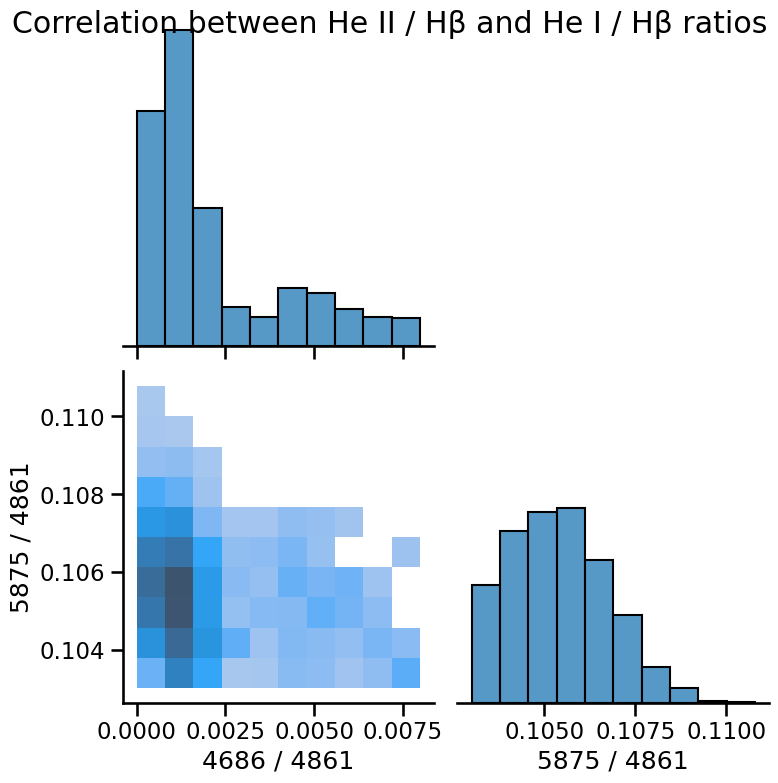

In [97]:
n = 2
xslice, yslice = slice(200, 300), slice(100, 250)
#xslice, yslice = slice(230, 300), slice(130, 220)
x = imR_heii_hb_c[yslice, xslice].rebin(n).data
y = (
    imR_hei_hb[yslice, xslice].rebin(n).data
    / red_R_hei_hb[yslice, xslice].rebin(n).data
)
z = im4686[yslice, xslice].rebin(n).data
m = x < 0.03
m = m & (x > 0)
m = m & (y < 0.113)
m = m & (y > 0.103)
m = (
    m
    & ~imR_heii_hb[yslice, xslice].rebin(n).mask
    & ~imR_hei_hb[yslice, xslice].rebin(n).mask
)
df = pd.DataFrame(
    {
        "4686 / 4861": x[m],
        "5875 / 4861": y[m],
    }
)
g = sns.pairplot(
    df,
    kind="hist",
    height=4,
    corner=True,
    plot_kws=dict(weights=z[m], bins=10),
    diag_kws=dict(weights=z[m], bins=10),
)
g.fig.suptitle("Correlation between He II / Hβ and He I / Hβ ratios")

<Axes: xlabel='5875 / 4861', ylabel='Probability'>

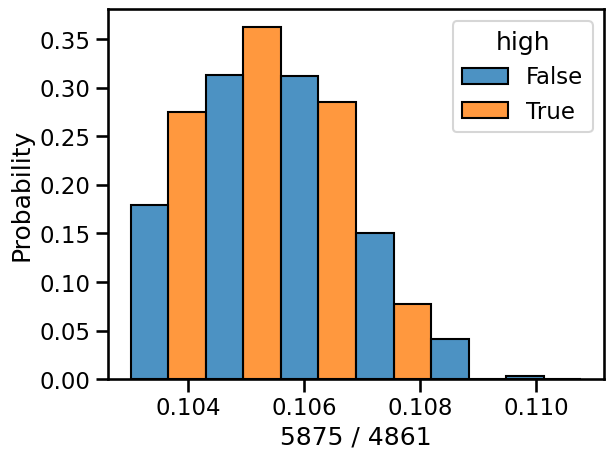

In [98]:
df["high"] = df["4686 / 4861"] > 0.003
sns.histplot(
    data=df,
    x="5875 / 4861",
    hue="high",
    multiple="dodge",
    shrink=1.0,
    stat="probability",
    common_norm=False,
    alpha=0.8,
    bins=6,
)

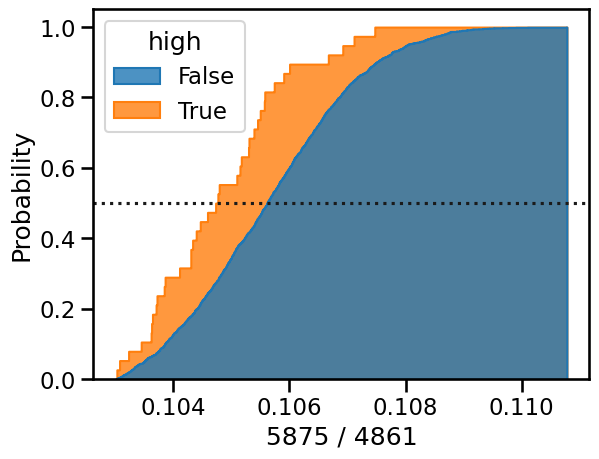

In [99]:
df["high"] = df["4686 / 4861"] > 0.005
sns.histplot(
    data=df,
    x="5875 / 4861",
    hue="high",
    #multiple="dodge",
    shrink=1.0,
    stat="probability",
    cumulative=True,
    common_norm=False,
    alpha=0.8,
    bins=1000,
    element="step",
).axhline(0.5, linestyle="dotted", color="k")

So, the depatterning improved the map but did not help with the statistics. 



## [Ar IV] diagnostics for bow shock

In [100]:
im4711 = get_image_raw("ar-iv-4711-37")
im4740 = get_image_raw("ar-iv-4740-17")
im7171 = get_image_raw("ar-iv-7170-5")
im7237 = get_image_raw("uil-7237-66")
im7263 = get_image_raw("ar-iv-7262-7")
im7136 = get_image_raw("ar-iii-7135-78")

In [101]:
im8151 = get_image_raw("uil-8150-72")

Also get the [Cl IV] lines

In [102]:
im7530 = get_image_raw("cl-iv-7530-8")
im8046 = get_image_raw("cl-iv-8045-62")

### Maps of all the [Ar IV] lines

Text(0.5, 1.0, '[Ar III] 7136')

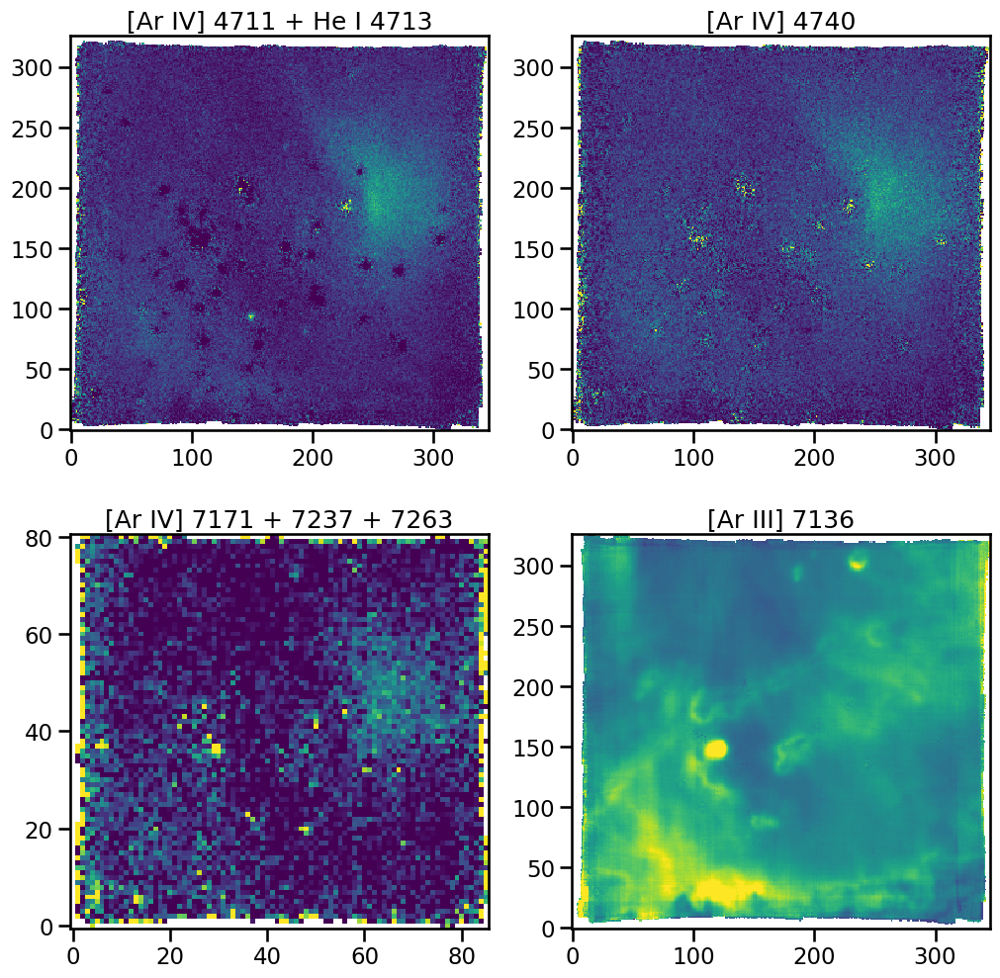

In [103]:
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
im4711.plot(ax=axes[0, 0], vmin=0, vmax=600)
im4740.plot(ax=axes[0, 1], vmin=0, vmax=450)
(im7171 + im7263 + im7237 - 0.3 * im8151).rebin(4).plot(ax=axes[1, 0], vmin=-3, vmax=30)
im7136.plot(ax=axes[1, 1], vmin=0, vmax=4500)
axes[0, 0].set_title("[Ar IV] 4711 + He I 4713")
axes[0, 1].set_title("[Ar IV] 4740")
axes[1, 0].set_title("[Ar IV] 7171 + 7237 + 7263")
axes[1, 1].set_title("[Ar III] 7136")

Text(0.5, 1.0, '[Ar III] 7136')

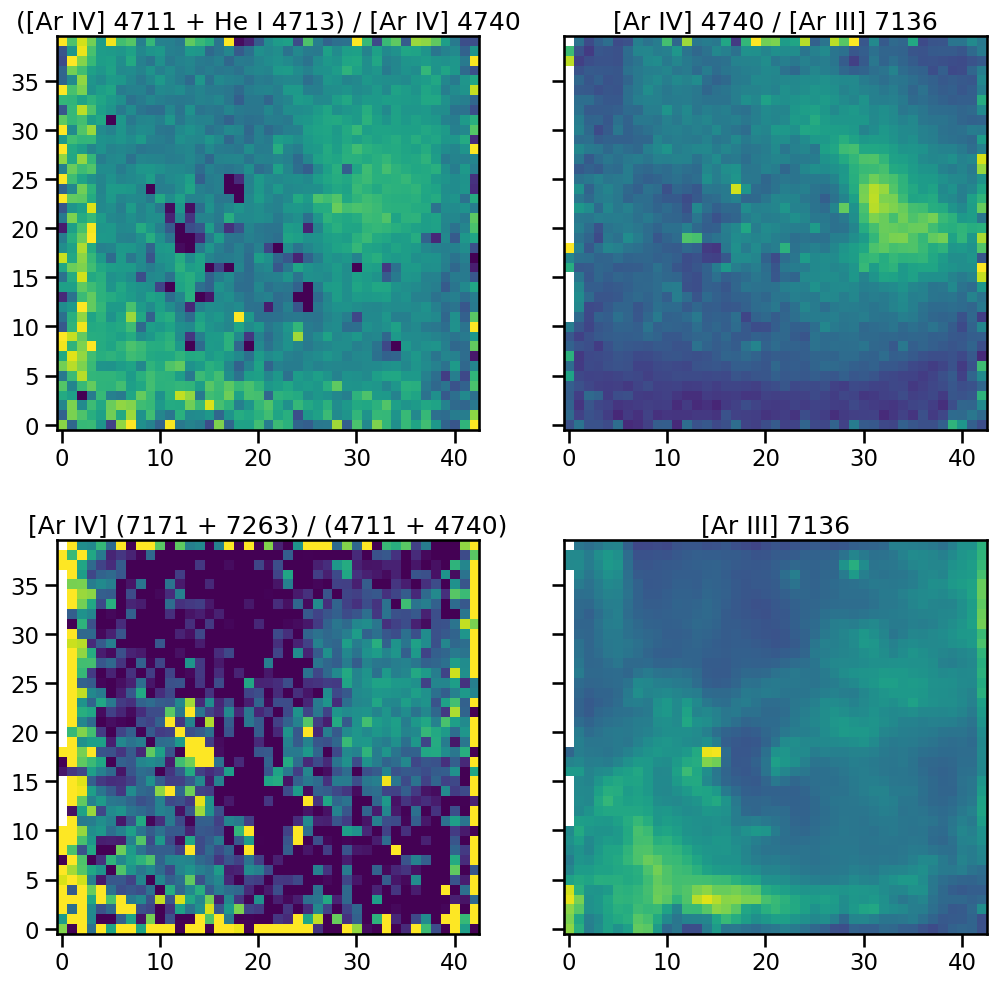

In [104]:
n = 8
fig, axes = plt.subplots(2, 2, sharey=True, figsize=(12, 12))
(im4711.rebin(n) / im4740.rebin(n)).plot(ax=axes[0, 0], vmin=0, vmax=2)
(im4740.rebin(n) / im7136.rebin(n)).plot(ax=axes[0, 1], vmin=0, vmax=0.1)
((im7171 + im7263 + im7237 - 0.3 * im8151).rebin(n) / (im4740.rebin(n) + im4711.rebin(n))).plot(
    ax=axes[1, 0], vmin=-0.02, vmax=0.06
)
im7136.rebin(n).plot(ax=axes[1, 1], vmin=0, vmax=5500)
axes[0, 0].set_title("([Ar IV] 4711 + He I 4713) / [Ar IV] 4740")
axes[0, 1].set_title("[Ar IV] 4740 / [Ar III] 7136")
axes[1, 0].set_title("[Ar IV] (7171 + 7263) / (4711 + 4740)")
axes[1, 1].set_title("[Ar III] 7136")

### Now look at [Cl IV]

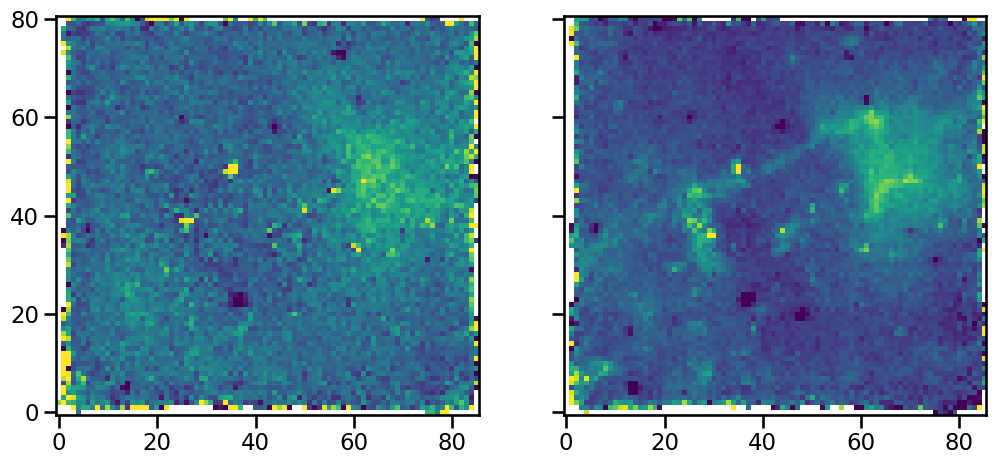

In [105]:
n = 4
fig, axes = plt.subplots(1, 2, sharey=True, figsize=(12, 6))
im7530.rebin(n).plot(ax=axes[0], vmin=0, vmax=40)
im8046.rebin(n).plot(ax=axes[1], vmin=0, vmax=80)

Subtract the molecular H component

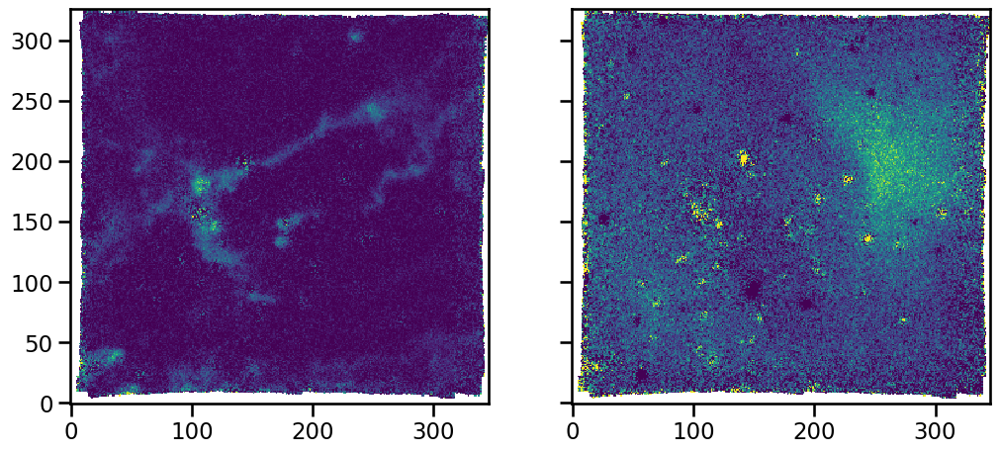

In [106]:
n = 1
fig, axes = plt.subplots(1, 2, sharey=True, figsize=(12, 6))
im8151.rebin(n).plot(ax=axes[0], vmin=0, vmax=160)
(im8046 - 0.45 * im8151).rebin(n).plot(ax=axes[1], vmin=0, vmax=80)

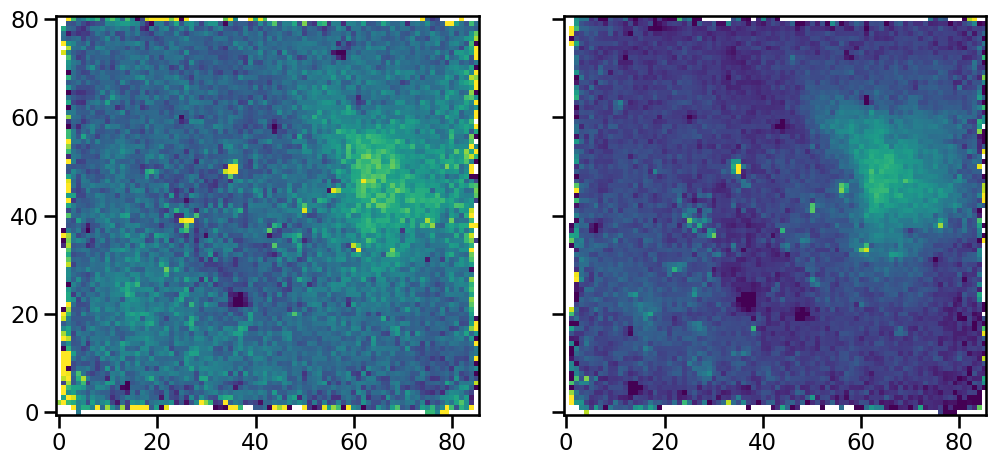

In [107]:
n = 4
fig, axes = plt.subplots(1, 2, sharey=True, figsize=(12, 6))
im7530.rebin(n).plot(ax=axes[0], vmin=0, vmax=40)
(im8046  - 0.45 * im8151).rebin(n).plot(ax=axes[1], vmin=0, vmax=80)

### Finding an He I line to subtract

Now we must subtract the He I 4713 line from [Ar IV] 4711

In [108]:
hei = pn.RecAtom("He", 1)

In [109]:
dens = [10, 50, 100, 200, 400]
tems = [11000, 13000, 15000, 18000]
e4713 = hei.getEmissivity(tems, dens, wave=4713)
e5876 = hei.getEmissivity(tems, dens, wave=5876)
e6678 = hei.getEmissivity(tems, dens, wave=6678)
e7065 = hei.getEmissivity(tems, dens, wave=7065)
e7281 = hei.getEmissivity(tems, dens, wave=7281)
e4713 / e5876

array([[0.04018001, 0.04041871, 0.04052099, 0.04102455, 0.04151038],
       [0.04478989, 0.04505443, 0.04516687, 0.04574651, 0.04628835],
       [0.04927652, 0.04950486, 0.04960095, 0.05006681, 0.05048645],
       [0.05580846, 0.05582119, 0.05582645, 0.05571397, 0.05561849]])

There is a slight temperature dependence, but almost no density dependence if we use the 5876 line.  This is probably the best because it has good signal to noise.

We can assume that the He I temperature is the same as the [S III] temperature.

But we will check the other lines as well.

In [110]:
e4922 = hei.getEmissivity(tems, dens, wave=4922)
e5048 = hei.getEmissivity(tems, dens, wave=5048)
e4713 / e4922, e4713 / e5048, e4713 / e7065

(array([[0.40647141, 0.4093477 , 0.41058209, 0.4197778 , 0.42882288],
        [0.44643681, 0.45101333, 0.45297058, 0.46731489, 0.48121483],
        [0.48553439, 0.49177797, 0.4944359 , 0.51336974, 0.53137742],
        [0.5427877 , 0.55098623, 0.55444695, 0.57792091, 0.59955007]]),
 array([[2.6201732 , 2.62809804, 2.63147955, 2.66100576, 2.68942523],
        [2.65717403, 2.67070893, 2.67645533, 2.72186066, 2.76464152],
        [2.69116298, 2.71038632, 2.71850415, 2.77879408, 2.83442363],
        [2.73728489, 2.7644345 , 2.77581169, 2.85450951, 2.92517579]]),
 array([[0.22326467, 0.21858145, 0.21665065, 0.20348195, 0.19246447],
        [0.2265844 , 0.22037698, 0.21786125, 0.20165395, 0.18883985],
        [0.22955671, 0.22209605, 0.21911898, 0.2009038 , 0.18713682],
        [0.23350167, 0.22463296, 0.22116174, 0.20128646, 0.18696917]]))

The 4922 has the same T-dependence as 5876, just 10 times weaker. The 5048 has a constant ratio, but it is so weak that we cannot use it.  So 5876 it is ...

In [111]:
e6678 / e5876

array([[0.28397493, 0.2839017 , 0.28387033, 0.28362063, 0.28337974],
       [0.28326962, 0.28329251, 0.28330223, 0.28318797, 0.28308115],
       [0.28264415, 0.28286873, 0.28296323, 0.28322969, 0.28346971],
       [0.28181883, 0.28254556, 0.28284597, 0.28403077, 0.28503656]])

In [112]:
e7065 / e6678, e7281 / e7065

(array([[0.63373837, 0.65133009, 0.6588704 , 0.71085357, 0.76109242],
        [0.69783058, 0.72166589, 0.73179595, 0.80108095, 0.86589869],
        [0.75946891, 0.78799253, 0.7999816 , 0.87987912, 0.9517193 ],
        [0.84808621, 0.87950253, 0.892442  , 0.97450525, 1.043635  ]]),
 array([[0.3061047 , 0.30060112, 0.29833211, 0.28237236, 0.26901977],
        [0.30380156, 0.29629398, 0.29325134, 0.27322708, 0.25739514],
        [0.30168936, 0.29249668, 0.28882847, 0.26599959, 0.24874558],
        [0.29882711, 0.28769751, 0.28334138, 0.25807331, 0.23987128]]))

In [113]:
(e7065 + e7281) / e6678

array([[0.82772866, 0.84712064, 0.8554326 , 0.91157898, 0.96584133],
       [0.90983261, 0.93549115, 0.94639609, 1.01995796, 1.08877681],
       [0.9885926 , 1.01847772, 1.03103907, 1.1139266 , 1.18845527],
       [1.10151736, 1.13253321, 1.14530774, 1.22599905, 1.29397306]])

### Average values of T and reddening to use in the corrections

We would introduce too much noise by using the pixel-by-pixel values of $T$ and $E(B - V)$, so we will construct an average value by using the He I brightenss as a weight, but masking out the mYSO


In [114]:
def trim_edges(im, m):
    """Trim m pixels of each edge of image in place by setting mask"""
    im.mask[:m, :] = True
    im.mask[-m:, :] = True
    im.mask[:, :m] = True
    im.mask[:, -m:] = True
    return None

Text(0.5, 1.0, 'Weight mask for He I emission')

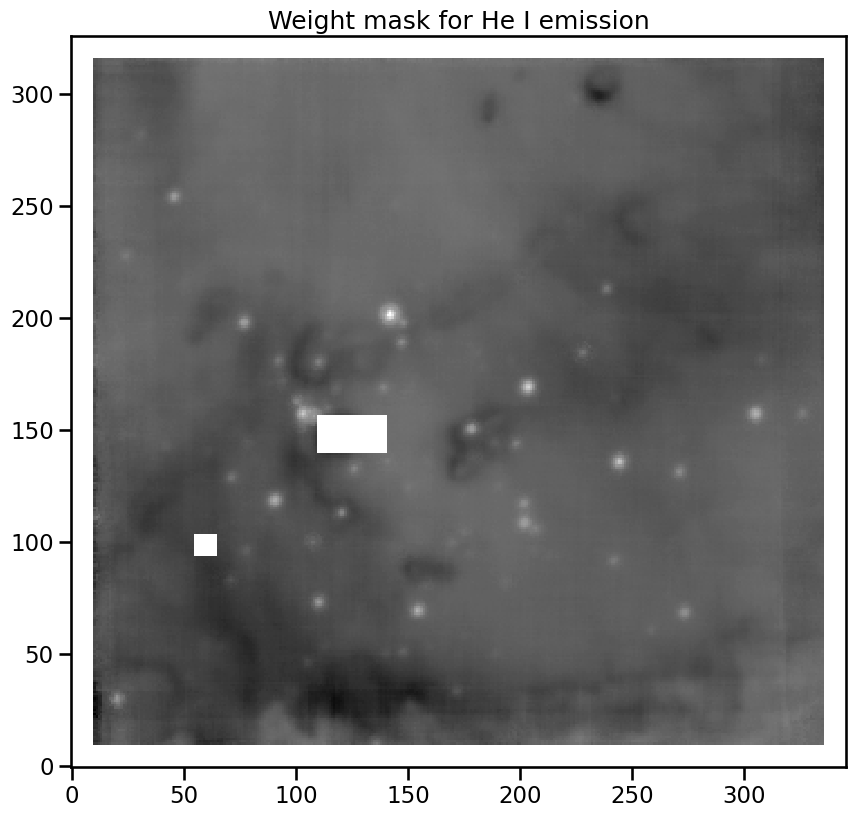

In [115]:
im_hei_weight = im5875.copy()
im_hei_weight.mask[140:157, 110:141] = True
im_hei_weight.mask[94:104, 55:65] = True
trim_edges(im_hei_weight, 10)
im_hei_weight.data.mask = im_hei_weight.mask
fig, ax = plt.subplots(figsize=(10, 10))
im_hei_weight.plot(cmap="gray_r")
ax.set_title("Weight mask for He I emission")

That looks OK. Now calculate some averages:

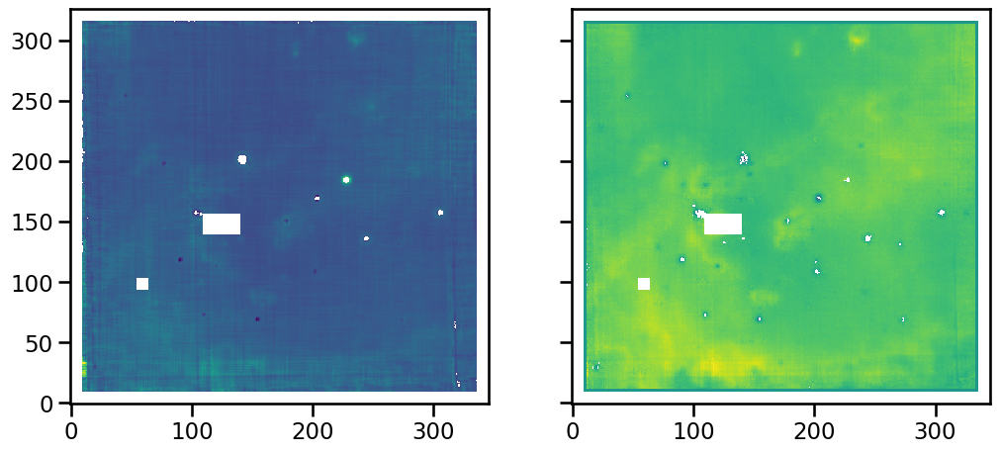

In [179]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True)
im1 = im_hei_weight.copy()
im1.data = im_hei_weight.data * imEBV.data
im1.mask = im_hei_weight.mask | imEBV.mask
im1.plot(ax=axes[0])
im2 = im_hei_weight.copy()
im2.data = im_hei_weight.data * imT_siii.data
im2.mask = im_hei_weight.mask | imT_siii.mask
im2.plot(ax=axes[1])

In [180]:
avHe_EBV = np.average(imEBV.data, weights=im_hei_weight.data)
avHe_Tsiii = np.average(imT_siii.data, weights=im_hei_weight.data)
f"He I brightness-weighted averages: E(B-V) = {avHe_EBV:.2f}, T = {avHe_Tsiii/1000:.2f} kK"

'He I brightness-weighted averages: E(B-V) = 0.17, T = nan kK'

In [181]:
median_EBV

0.1374645935930482

The `avHe_Tsiii` looks good. But to be honest, I am a bit suspicious of the `avHe_EBV` reddening, since there are lots of anomalous spots of high $E(B-V)$ that correspond to stars (presumably underlying stellar absorption affecting the Balmer decrement).

I could use the median instead, but I have ended up using the weighted one after all, since we seem to be oversubtracting if anything.

In [182]:
avHe_reddening_4713_5876 = 10 ** (0.4 * avHe_EBV * (rc.X(4713) - rc.X(5876)))
median_reddening_4713_5876 = 10 ** (0.4 * median_EBV * (rc.X(4713) - rc.X(5876)))
avHe_reddening_4713_5876, median_reddening_4713_5876

(1.1644396212614305, 1.134864834019863)

In [183]:
dens = 100.0
avHe_e4713_5876 = hei.getEmissivity(avHe_Tsiii, dens, wave=4713) / hei.getEmissivity(
    avHe_Tsiii, dens, wave=5876
)
avHe_e4713_5876

nan

Take advantage to save extinction-corrected maps of the high-ionization lines.  These are using the avHe reddening, not the pixel-by-pixel values

In [184]:
avHe_corr_4686 = 10 ** (0.4 * avHe_EBV * rc.X(4686))
avHe_corr_4686

1.6863131461586944

In [185]:
(im4686 * avHe_corr_4686).write(str(ROOT / "data/ngc346-ZZ-heii-4686-correct.fits"))

In [186]:
((imhb) * 10 ** (0.4 * avHe_EBV * rc.X(4861))).write(
    str(ROOT / "data/ngc346-ZZ-hi-4861-correct.fits"),
)
(im5875 * 10 ** (0.4 * avHe_EBV * rc.X(5875))).write(
    str(ROOT / "data/ngc346-ZZ-hei-5875-correct.fits"),
)
(im7136 * 10 ** (0.4 * avHe_EBV * rc.X(7136))).write(
    str(ROOT / "data/ngc346-ZZ-ariii-7136-correct.fits"),
)

### Subtract the contribution of He I 4713 to [Ar IV] 4711

Now do the correction by faking the 4713 line and subtracting it. 

In [187]:
predicted_ratio_4713_5876 = avHe_e4713_5876 / avHe_reddening_4713_5876
predicted_ratio_4713_5876

nan

Although we have gone to all this trouble to calculate the "correct" intensity of the He I 4713 line, this is not much use, since we need to account for the fact that only a fraction of the He I line enters in the 3-wav pixels of [Ar IV].  This is the disadvantage of not summing over the entire line

We deal with this by taking the individual channels of the He I line, only using the A and B channels since for 4713 they overlap most with the [Ar IV] 4711 line

In [188]:
im5876_A = get_image_raw("he-i-5875-62", channel="A")
im5876_B = get_image_raw("he-i-5875-62", channel="B")

In [189]:
im_fake_4713 =  predicted_ratio_4713_5876 * (im5876_A + 0.3 * im5876_B)
# im_fake_4713 = 0.025 * im5875
im4711c = im4711 - im_fake_4713

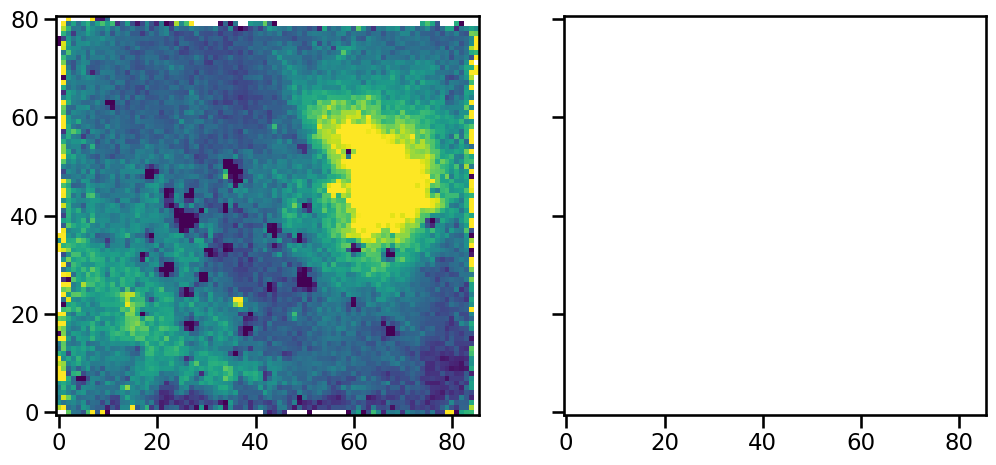

In [190]:
n = 4
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True)
im4711.rebin(n).plot(ax=axes[0], vmin=0, vmax=200)
(im_fake_4713).rebin(n).plot(ax=axes[1], vmin=0, vmax=200)

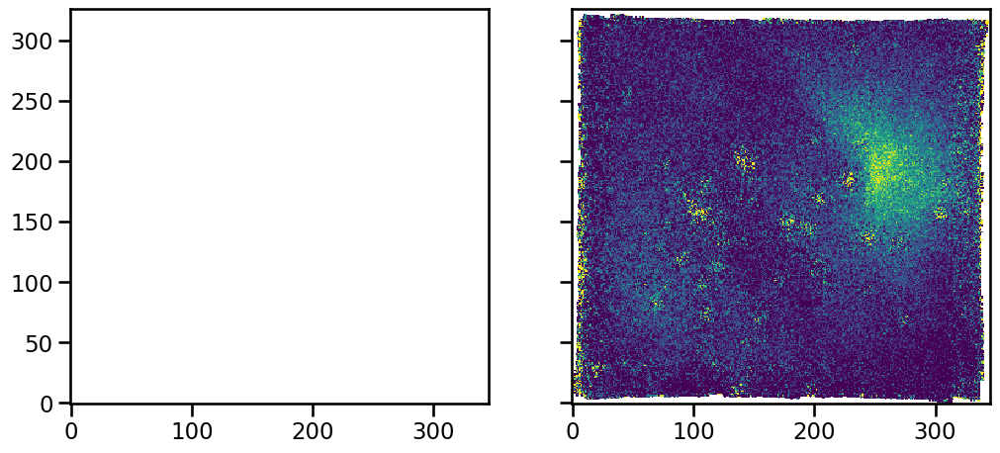

In [191]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True)
(im4711 - im_fake_4713).plot(ax=axes[0], vmin=0, vmax=250)
(im4740 - 50).plot(ax=axes[1], vmin=0, vmax=250)

Look at the joint distros

Text(0.5, 0.98, 'Correlation between [Ar IV] 4740, 4711 brightness')

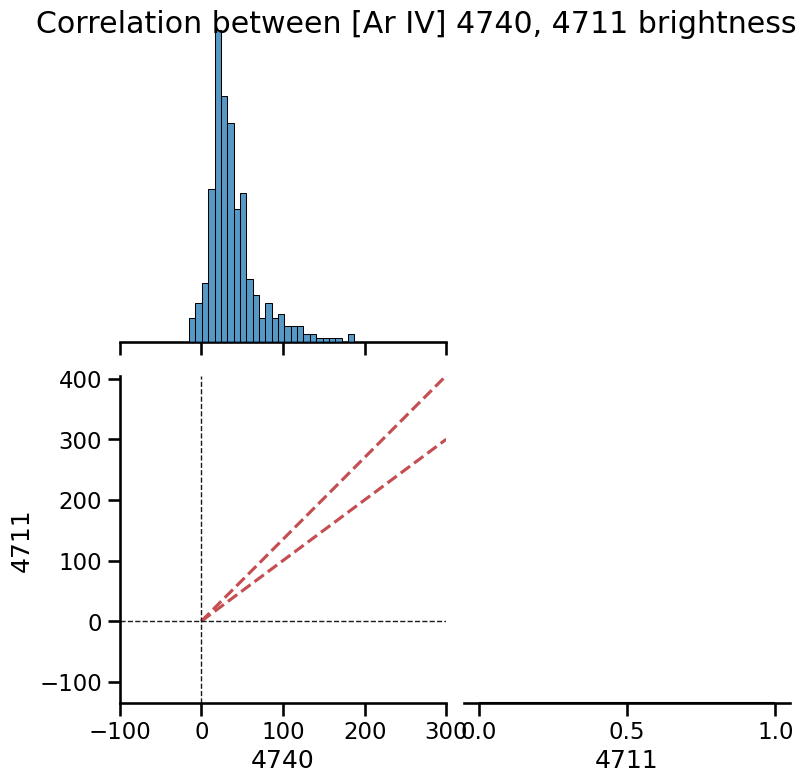

In [192]:
imax = 300
imin = -100
slope = 1.35
slope2 = 1.0
offset_4740 = 50
n = 16
x = (im4740 - offset_4740).rebin(n).data
y = (im4711 - im_fake_4713).rebin(n).data
m = x < imax
m = m & (x > imin)
m = m & (y < slope * imax)
m = m & (y > slope * imin)
m = m & ~im4740.rebin(n).mask & ~im4711.rebin(n).mask
df = pd.DataFrame(
    {
        "4740": x[m],
        "4711": y[m],
    }
)
mm = np.hypot(x, y / slope) > 100
g = sns.pairplot(
    df,
    kind="hist",
    height=4,
    corner=True,
)
g.axes[1, 0].plot([0, imax], [0, slope * imax], "--", color="r")
g.axes[1, 0].plot([0, imax], [0, slope2 * imax], "--", c="r")
g.axes[1, 0].axhline(0, ls="dashed", color="k", lw=1)
g.axes[1, 0].axvline(0, ls="dashed", color="k", lw=1)
g.axes[1, 0].scatter(x[mm], y[mm], alpha=0.3, marker=".", s=10*n, color="r", lw=0)
g.axes[1, 0].set(xlim=[imin, imax], ylim=[slope * imin, slope * imax])

g.fig.suptitle("Correlation between [Ar IV] 4740, 4711 brightness")

This shows that the we need to subtract an offset of around 50 from 4740 in order for it to be consistent with the He-subtracted 4711

Do the same for [Cl IV]


Text(0.5, 0.98, 'Correlation between [Cl IV] 8046, 7530 brightness')

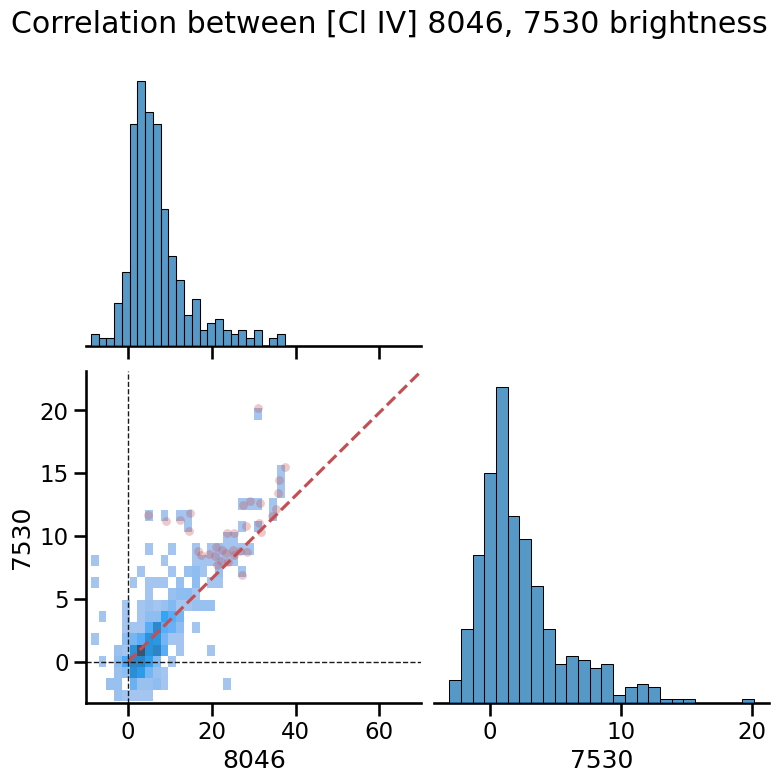

In [193]:
imax = 70
imin = -10
slope = 0.33
slope2 = 1.0
offset_4740 = 50
n = 16
x = (im8046 - 0.45 * im8151 - 12).rebin(n).data
y = (im7530 - 10 - 3).rebin(n).data
m = x < imax
m = m & (x > imin)
m = m & (y < slope * imax)
m = m & (y > slope * imin)
m = m & ~im8046.rebin(n).mask & ~im7530.rebin(n).mask
df = pd.DataFrame(
    {
        "8046": x[m],
        "7530": y[m],
    }
)
mm = np.hypot(x, y / slope) > 30
g = sns.pairplot(
    df,
    kind="hist",
    height=4,
    corner=True,
)
g.axes[1, 0].plot([0, imax], [0, slope * imax], "--", color="r")
# g.axes[1, 0].plot([0, imax], [0, slope2 * imax], "--", c="r")
g.axes[1, 0].axhline(0, ls="dashed", color="k", lw=1)
g.axes[1, 0].axvline(0, ls="dashed", color="k", lw=1)
g.axes[1, 0].scatter(x[mm], y[mm], alpha=0.3, marker=".", s=10*n, color="r", lw=0)
g.axes[1, 0].set(xlim=[imin, imax], ylim=[slope * imin, slope * imax])

g.fig.suptitle("Correlation between [Cl IV] 8046, 7530 brightness")

Text(0.5, 0.98, 'Correlation between [Ar IV] 4740 and [Cl IV] 8046 brightness')

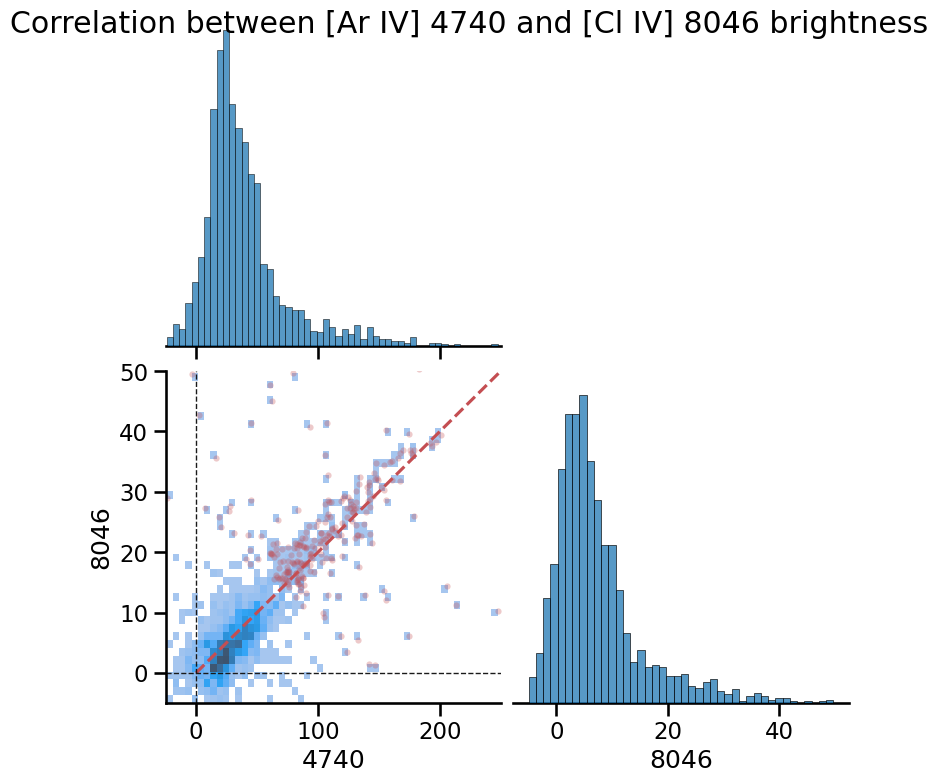

In [194]:
imax = 250
imin = -25
slope = 0.2
slope2 = 1.0
offset_4740 = 50
n = 8
x = (im4740 - offset_4740).rebin(n).data
y = (im8046 - 0.45 * im8151 - 12).rebin(n).data
m = x < imax
m = m & (x > imin)
m = m & (y < slope * imax)
m = m & (y > slope * imin)
m = m & ~im8046.rebin(n).mask & ~im7530.rebin(n).mask
df = pd.DataFrame(
    {
        "4740": x[m],
        "8046": y[m],
    }
)
mm = np.hypot(x, y / slope) > 100
g = sns.pairplot(
    df,
    kind="hist",
    height=4,
    corner=True,
)
g.axes[1, 0].plot([0, imax], [0, slope * imax], "--", color="r")
# g.axes[1, 0].plot([0, imax], [0, slope2 * imax], "--", c="r")
g.axes[1, 0].axhline(0, ls="dashed", color="k", lw=1)
g.axes[1, 0].axvline(0, ls="dashed", color="k", lw=1)
g.axes[1, 0].scatter(x[mm], y[mm], alpha=0.3, marker=".", s=10*n, color="r", lw=0)
g.axes[1, 0].set(xlim=[imin, imax], ylim=[slope * imin, slope * imax])

g.fig.suptitle("Correlation between [Ar IV] 4740 and [Cl IV] 8046 brightness")

### Apply mask to [Ar IV] ratios

Make a common minimal mask to use for all the [Ar IV] lines, which we will then combine with a brightness-based mask for the weaker lines and ratios:

#### Use the existing IV mask for simplicity

In [195]:
zone_iv_mask_file = list(ROOT.glob("**/*IV-mask*.fits"))[0]
zone_iii_mask_file = list(ROOT.glob("**/*III-mask*.fits"))[0]
zone_iv_mask_file

PosixPath('/Users/will/Dropbox/muse-hii-regions/data/n346-lines/zone-IV-mask.fits')

In [196]:
from astropy.io import fits

In [197]:
zone_iv_mask = fits.open(zone_iv_mask_file)[0].data
zone_iii_mask = fits.open(zone_iii_mask_file)[0].data

In [198]:
broad_mask = ~(zone_iii_mask + zone_iv_mask).astype(bool)
narrow_mask = ~zone_iv_mask.astype(bool)

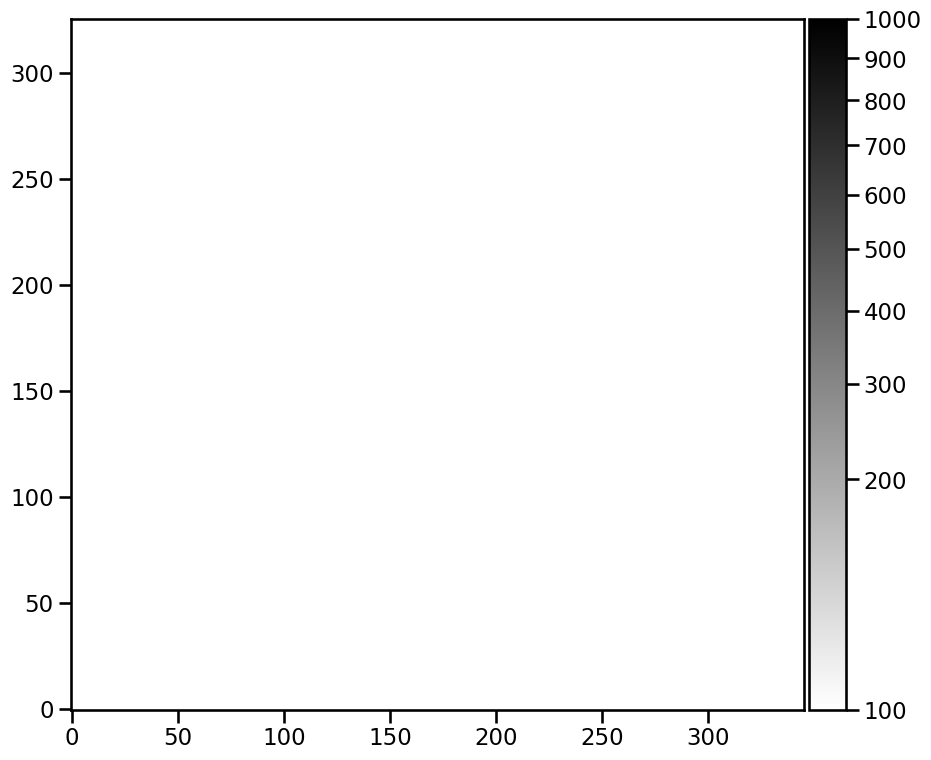

In [199]:
im_ariv_sum = im4711c + im4740
# im_ariv_sum.mask = broad_mask
fig, ax = plt.subplots(figsize=(10, 10))
im_ariv_sum.plot(colorbar="v", vmin=100, vmax=1000, cmap="gray_r", scale="sqrt")

Current strategy is not to apply these masks to the images, but to use them directly when I do the statistics

In [200]:
cont4861 = get_image_raw("h-i-4861-32", variant="cont")

That is looking good.  

#### Apply the mask to all the other images

I am no longer doing this

In [201]:
# for im in im4711c, im4740, im7171, im7263, im7237:
#     im.mask = broad_mask

### Find average reddening for [Ar IV] lines

Now find average reddening for [Ar IV] lines.  Try two methods: (1) brightness-weighted mean; (2) make a mask based on the Ar IV brightness and then take median in that area.

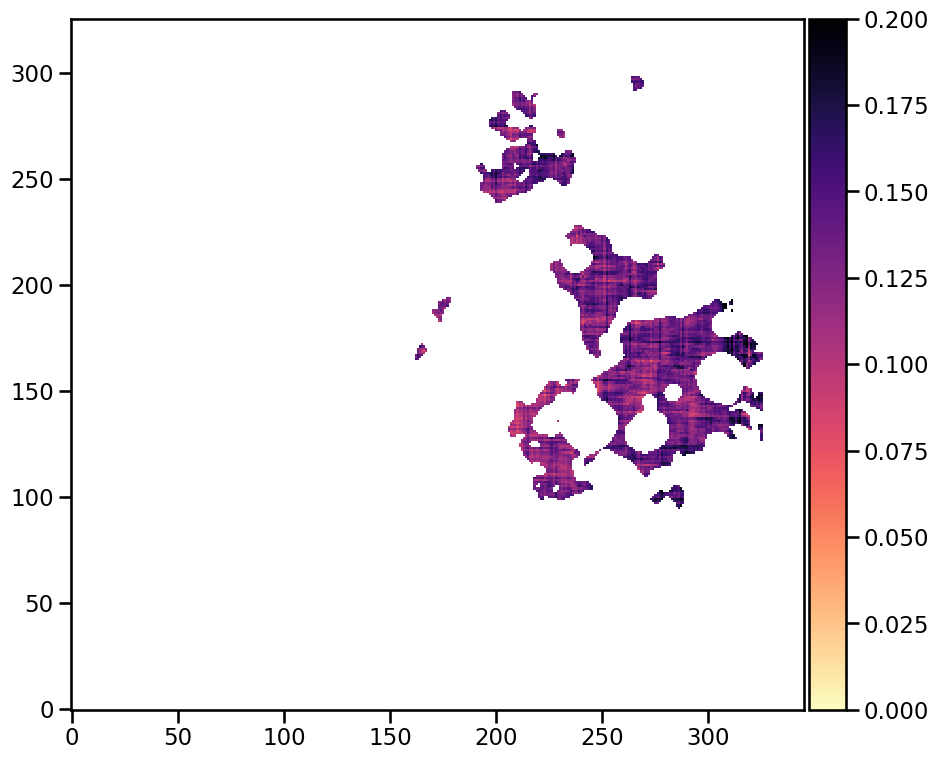

In [202]:
fig, ax = plt.subplots(figsize=(10, 10))
im = im_ariv_sum.copy()
im.data = np.where(
    narrow_mask,
    np.nan,
    imEBV.data,
)
# im.mask = im.mask | (im_ariv_sum.data < 300)
trim_edges(im, 20)
im.plot(vmin=0, vmax=0.2, cmap="magma_r", colorbar="v")

In [203]:
avArIV_EBV = np.average(imEBV.data[~narrow_mask], weights=im_ariv_sum.data[~narrow_mask])
medianArIV_EBV = np.median(im.data.data[~narrow_mask])
avArIV_EBV, medianArIV_EBV

(masked, 0.13495777213434648)

So there isn't much difference. But we take the median since it should be less sensitive to those spots of higher $E(B-V)$ due to stars.

### Apply extinction correction to all lines:

In [204]:
im7136r = (im7136) * 10 ** (0.4 * medianArIV_EBV * rc.X(7136))
im4740r = (im4740 - offset_4740) * 10 ** (0.4 * medianArIV_EBV * rc.X(4740))
im4711r = (im4711 - im_fake_4713) * 10 ** (0.4 * medianArIV_EBV * rc.X(4711))
im7171r = (im7171) * 10 ** (0.4 * medianArIV_EBV * rc.X(7171))
im7263r = (im7263) * 10 ** (0.4 * medianArIV_EBV * rc.X(7263))
im7237r = (im7237 - 0.3 * im8151) * 10 ** (0.4 * medianArIV_EBV * rc.X(7237))
for im in im4711r, im4740r, im7171r, im7136r, im7263r, im7237r:
    trim_edges(im, 20)

In [205]:
offsets = {
    "7171": 6,
    "7237": -11,
    "7263": -3,
}
offsets_sum = sum(offsets.values())
offsets_sum

-8

Note the offsets in the red lines, which I found from doing the correlation plots below. **But we do not apply these yet.**

And replace the summed image:

In [206]:
im_ariv_sum = im4711r + im4740r
im_ariv_red3 = im7171r + im7237r + im7263r

Calculate the ratios

In [207]:
ariv_R1 = im4711r / im4740r
# ariv_R1.mask = ariv_R1.mask | (im_ariv_sum.data < 400)
ariv_R345 = im_ariv_red3 / im_ariv_sum
# ariv_R345.mask = ariv_R345.mask | (im_ariv_sum.data < 400)

### Inspect maps of ariv lines

Text(0.5, 1.0, '[Ar IV] 7263')

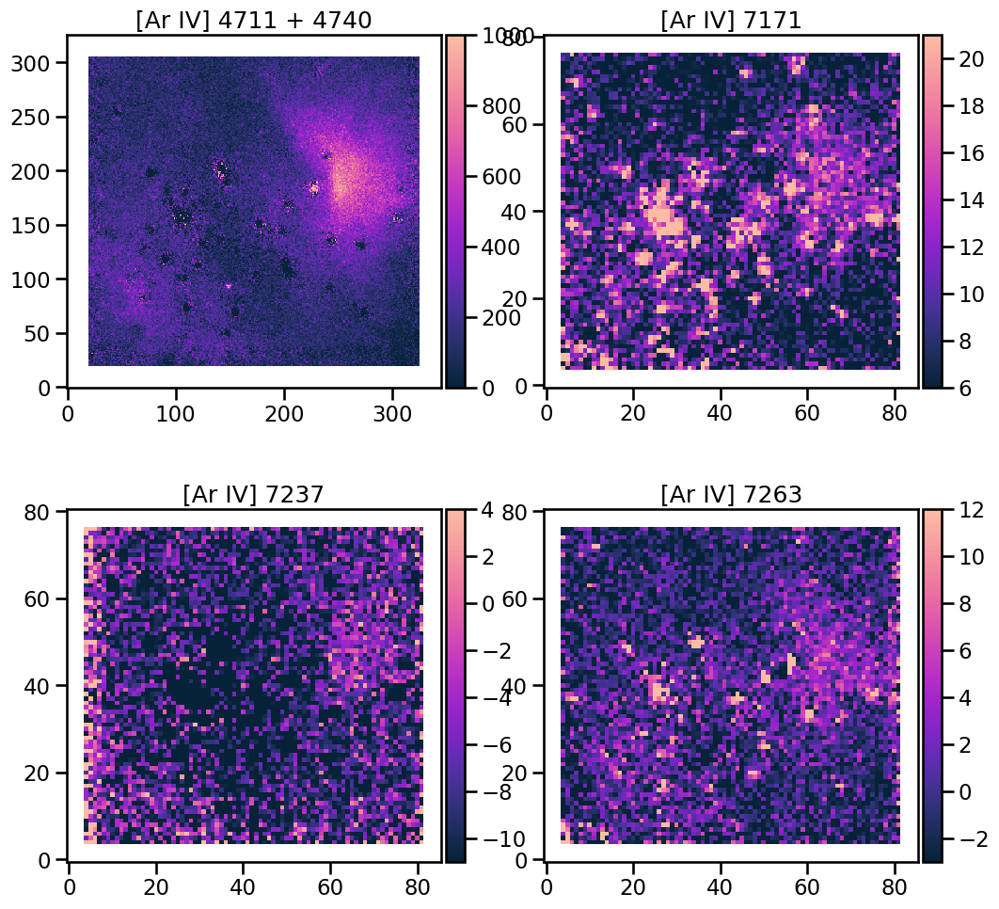

In [208]:
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
(im4711r + im4740r).plot(ax=axes[0, 0], vmin=0, vmax=1000, colorbar="v", cmap=cmr.bubblegum)
n = 16
(im7171r).rebin(4).plot(
    ax=axes[0, 1],                     
    vmin=offsets["7171"],                     
    vmax=15 + offsets["7171"],
    colorbar="v", 
    cmap=cmr.bubblegum,
)
(im7237r).rebin(4).plot(
    ax=axes[1, 0], 
    vmin=offsets["7237"], 
    vmax=15 + offsets["7237"], 
    colorbar="v", 
    cmap=cmr.bubblegum,
)
(im7263r).rebin(4).plot(
    ax=axes[1, 1], 
    vmin=offsets["7263"], 
    vmax=15 + offsets["7263"], 
    colorbar="v", 
    cmap=cmr.bubblegum,
)
axes[0, 0].set_title("[Ar IV] 4711 + 4740")
axes[0, 1].set_title("[Ar IV] 7171")
axes[1, 0].set_title("[Ar IV] 7237")
axes[1, 1].set_title("[Ar IV] 7263")

Text(0.5, 1.0, '[Ar IV] Sum 7XXX / Sum 47XX')

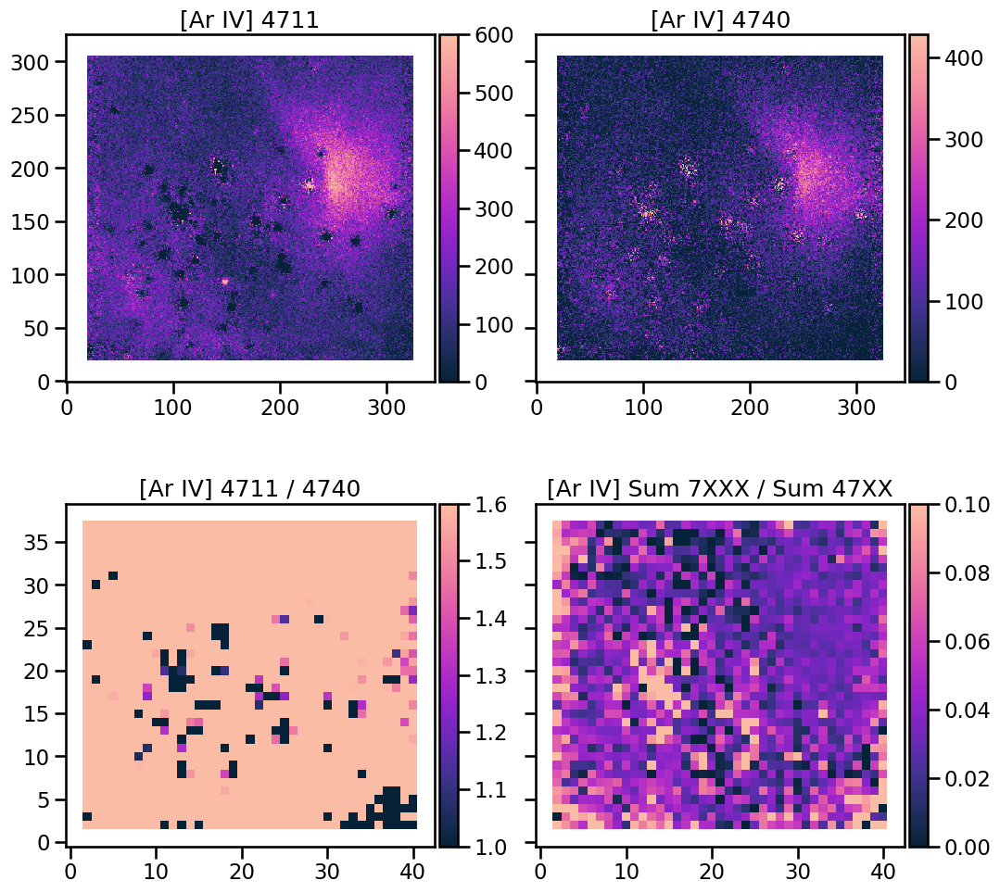

In [209]:
fig, axes = plt.subplots(2, 2, figsize=(12, 12), sharex="row", sharey="row")
im4711r.plot(ax=axes[0, 0], vmin=0, vmax=600, colorbar="v", cmap=cmr.bubblegum)
im4740r.plot(ax=axes[0, 1], vmin=0, vmax=600 / 1.4, colorbar="v", cmap=cmr.bubblegum)
n = 8
(
    im4711r.rebin(n) / im4740r.rebin(n)
).plot(ax=axes[1, 0], vmin=1.0, vmax=1.6, colorbar="v", cmap=cmr.bubblegum)

(
    (im_ariv_red3.rebin(n) - offsets_sum) / im_ariv_sum.rebin(n)
).plot(ax=axes[1, 1], vmin=0, vmax=0.1, colorbar="v", cmap=cmr.bubblegum)
axes[0, 0].set_title("[Ar IV] 4711")
axes[0, 1].set_title("[Ar IV] 4740")
axes[1, 0].set_title("[Ar IV] 4711 / 4740")
axes[1, 1].set_title("[Ar IV] Sum 7XXX / Sum 47XX")


Save the combined image, corrected for extinction:

In [210]:
im_ariv_sum.write(
    str(ROOT / "data/ngc346-ZZ-ariv-4711-plus-4740-correct.fits"), savemask="nan"
)
im_ariv_red3.write(
    str(ROOT / "data/ngc346-ZZ-ariv-7171-7237-7263-correct.fits"), savemask="nan"
)
im4740r.write(str(ROOT / "data/ngc346-ZZ-ariv-4740-correct.fits"), savemask="nan")
im4711r.write(str(ROOT / "data/ngc346-ZZ-ariv-4711-correct.fits"), savemask="nan")
im7171r.write(str(ROOT / "data/ngc346-ZZ-ariv-7171-correct.fits"), savemask="nan")
im7237r.write(str(ROOT / "data/ngc346-ZZ-ariv-7237-correct.fits"), savemask="nan")
im7263r.write(str(ROOT / "data/ngc346-ZZ-ariv-7263-correct.fits"), savemask="nan")
im7263r.write(str(ROOT / "data/ngc346-ZZ-ariv-7263-correct.fits"), savemask="nan")

### Density-sensitive correlations

Text(0.5, 0.98, 'Correlation between [Ar IV] 4711 and 4740')

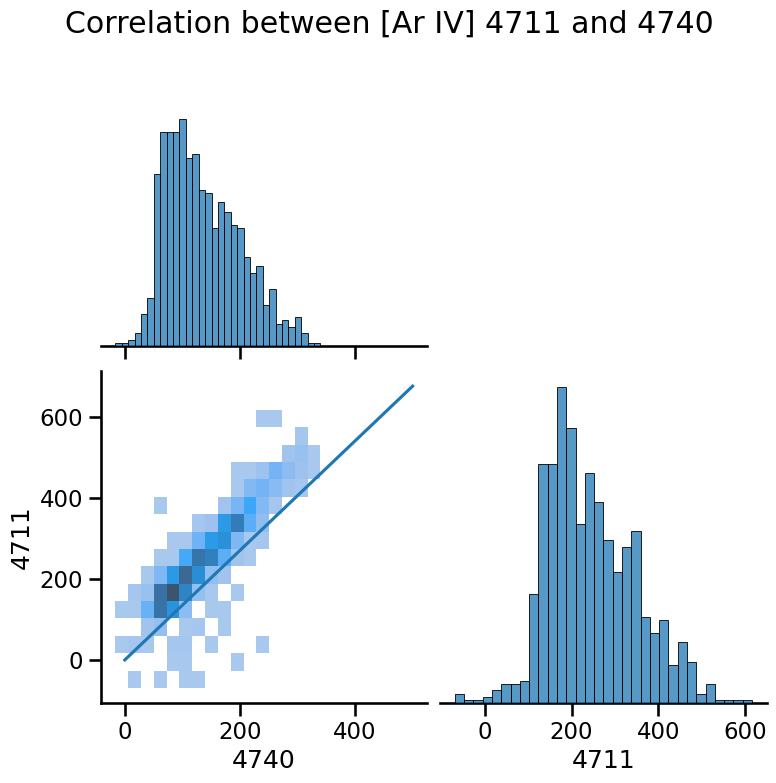

In [211]:
n = 4
xslice, yslice = slice(200, 300), slice(100, 250)
ratio = 1.35
xmax = 500
ymax = ratio * xmax
x = im4740r[yslice, xslice].rebin(n).data
y = im4711r[yslice, xslice].rebin(n).data
z = im_ariv_sum[yslice, xslice].rebin(n).data
m = (x > -100.0) & (y > -100.0) & (x < xmax) & (y < ymax)
# m = m & (x > 0)
# m = m & (y < 0.113)
# m = m & (y > 0.103)
m = m & ~im4740r[yslice, xslice].rebin(n).mask & ~im4711r[yslice, xslice].rebin(n).mask
df = pd.DataFrame(
    {
        "4740": x[m],
        "4711": y[m],
    }
)
g = sns.pairplot(
    df,
    kind="hist",
    height=4,
    corner=True,
    plot_kws=dict(
        # weights=z[m],
        bins=64
        // n
    ),
    diag_kws=dict(
        # weights=z[m],
        bins=128
        // n
    ),
)
g.axes[1, 0].plot([0, xmax], [0, ymax])
g.fig.suptitle("Correlation between [Ar IV] 4711 and 4740")

Text(0.5, 0.98, 'Correlation between [Ar IV] 4740 and 4711 / 4740')

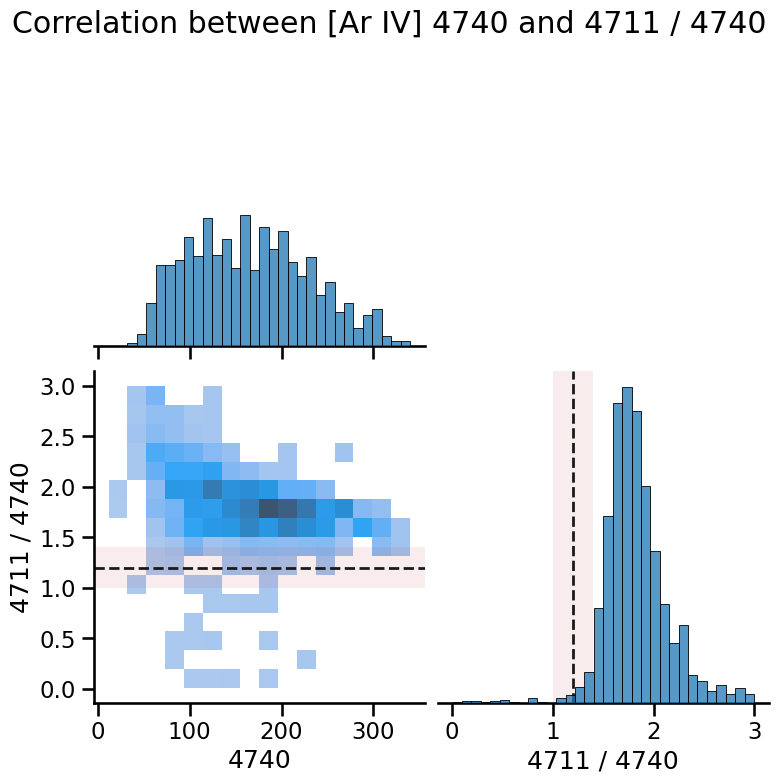

In [212]:
n = 4
xslice, yslice = slice(200, 300), slice(100, 250)
ratio = 1.2
dr = 0.2
rmin, rmax = ratio - dr, ratio + dr
xmax = 500
ymax = ratio * xmax
x = im4740r[yslice, xslice].rebin(n).data
y = im4711r[yslice, xslice].rebin(n).data
z = im_ariv_sum[yslice, xslice].rebin(n).data
m = (x > -100.0) & (y > -100.0) & (x < xmax) & (y < ymax)
y = y / x
m = m & (y < 2.5 * ratio) & (y > 0.0)
m = m & ~im4740[yslice, xslice].rebin(n).mask & ~im4711[yslice, xslice].rebin(n).mask
df = pd.DataFrame(
    {
        "4740": x[m],
        "4711 / 4740": y[m],
    }
)
g = sns.pairplot(
    df,
    kind="hist",
    height=4,
    corner=True,
    plot_kws=dict(weights=z[m], bins=64 // n),
    diag_kws=dict(weights=z[m], bins=128 // n),
)
g.axes[1, 0].axhline(ratio, linestyle="dashed", color="k", linewidth=2)
g.axes[1, 0].axhspan(rmin, rmax, color="r", linewidth=0, alpha=0.1)

g.axes[1, 1].axvline(ratio, linestyle="dashed", color="k", linewidth=2)
g.axes[1, 1].axvspan(rmin, rmax, color="r", linewidth=0, alpha=0.1)
g.fig.suptitle("Correlation between [Ar IV] 4740 and 4711 / 4740")

So the density-sensitive ratio is $R_1 = 1.4 \pm 0.2$

(array([    0.        ,     0.        ,     0.        ,     0.        ,
            0.        ,     0.        ,     0.        ,     0.        ,
            0.        ,     0.        ,     0.        ,     0.        ,
            0.        ,     0.        ,     0.        ,     0.        ,
            0.        ,     0.        ,     0.        ,     0.        ,
            0.        ,     0.        ,     0.        ,     0.        ,
            0.        ,     0.        ,     0.        ,     0.        ,
          740.25330746,  1352.53806191,  2150.85631649,  4170.84768707,
         5735.86943454,  4218.51218602,  7243.76213828,  5669.45517014,
         9125.07623669, 10328.50869577,  4555.12199412,  6829.78904974]),
 array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 ,
        0.55, 0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95, 1.  , 1.05,
        1.1 , 1.15, 1.2 , 1.25, 1.3 , 1.35, 1.4 , 1.45, 1.5 , 1.55, 1.6 ,
        1.65, 1.7 , 1.75, 1.8 , 1.85, 1.9 , 1.95, 2.  ])

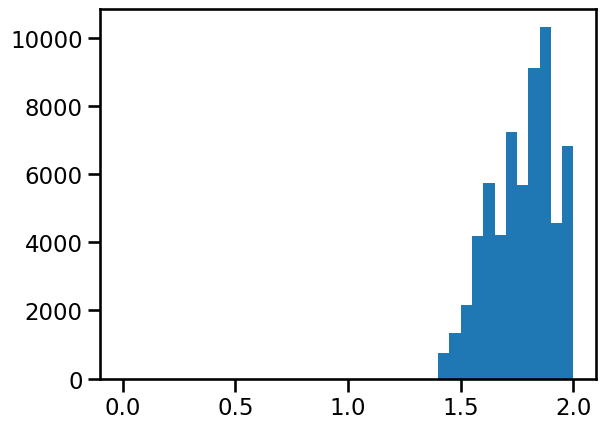

In [213]:
n = 4
fig, ax = plt.subplots()
m = (im_ariv_sum.rebin(n).data > 600)
ax.hist(ariv_R1.rebin(n).data[m], weights=im_ariv_sum.rebin(n).data[m], range=[0, 2.0], bins=40)

In [214]:
ariv = pn.Atom("Ar", 4)

In [215]:
ariv.getTemDen([1.1, 1.25, 1.35, 1.38], tem=17500, wave1=4711, wave2=4740)

array([2522.67611308,  970.33195304,  161.02620276,           nan])

In [216]:
ariv.getTemDen([1.1, 1.25, 1.35, 1.38], tem=15000, wave1=4711, wave2=4740)

array([2455.00789273, 1003.12041491,  233.67314247,   23.9502662 ])

So we are close to the low density limit, with a nominal value of 1000.  We need to get a very precise estimate of the uncertainty in order to get the error bars.

In [217]:
dens = [10, 50, 100, 200, 400]
tems = [10000, 15000, 20000]
ariv_lines = [4711, 4740, 4741, 7171, 7237, 7263]
e_ariv = {
    _wave: ariv.getEmissivity(tems, dens, wave=_wave)
    for _wave in ariv_lines
}

In [218]:
e_ariv[4711] / e_ariv[4740]

array([[1.42166996, 1.41428758, 1.40517648, 1.38733359, 1.35309331],
       [1.38192688, 1.37602205, 1.36871811, 1.35436169, 1.32661513],
       [1.35361768, 1.34860075, 1.34238649, 1.33014406, 1.30637804]])

In [219]:
e_ariv[7171] / (e_ariv[4711] + e_ariv[4740])

array([[0.00801412, 0.00803107, 0.00805216, 0.00809406, 0.00817668],
       [0.01571663, 0.01574439, 0.01577897, 0.01584772, 0.0159836 ],
       [0.02197455, 0.0220092 , 0.02205238, 0.0221383 , 0.02230837]])

In [220]:
e_ariv[7263] / e_ariv[7171]

array([[0.85420557, 0.85389919, 0.85352024, 0.85277549, 0.85133662],
       [0.84589225, 0.84565703, 0.8453656 , 0.84479122, 0.84367535],
       [0.84327373, 0.84306527, 0.84280673, 0.84229632, 0.8413014 ]])

In [221]:
e_ariv[7237] / e_ariv[7171]

array([[0.74171871, 0.74171871, 0.74171871, 0.74171871, 0.74171871],
       [0.74171871, 0.74171871, 0.74171871, 0.74171871, 0.74171871],
       [0.74171871, 0.74171871, 0.74171871, 0.74171871, 0.74171871]])

In [222]:
ariv.getSources()

['Ar4: All A values (line gauge): Rynkun, P., Gaigalas, G., & Jonsson, P. 2019, Astronomy and Astrophysics, 623, A155: ',
 'Ar4: Energy levels: \n    Ref. 15349 of NIST 2014 (try this: http://physics.nist.gov/cgi-bin/ASBib1/get_ASBib_ref.cgi?db=el&db_id=15349&comment_code=&element=Ar&spectr_charge=4&): ',
 'Ar4: All collision strengths: Ramsbottom & Bell 1997, ADNDT, 66, 1: ']

### Now for the T diagnostics

First, with all the lines

Text(0.5, 0.98, 'Correlation between [Ar IV] 4711+40 and 7171+')

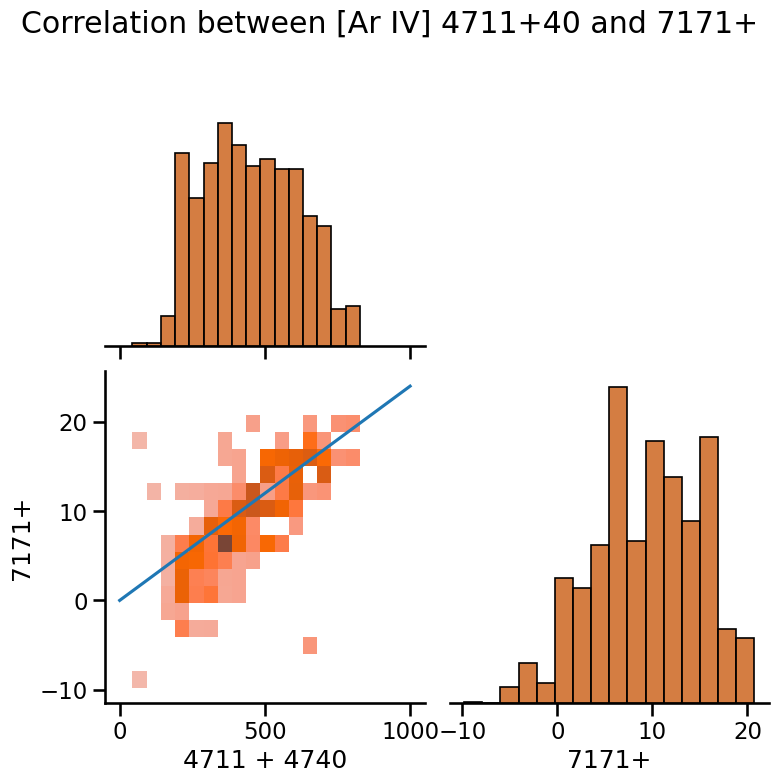

In [223]:
n = 8
color = "xkcd:dark orange"
xslice, yslice = slice(200, 300), slice(100, 250)
ratio = 0.024
xmin, xmax = -50, 1000
ymax = ratio * xmax
ymin = -0.5 * ymax
_im = im_ariv_sum.copy()
_im.data = np.where(
    # broad_mask,
    False,
    np.nan,
    _im.data,
)
x = im_ariv_sum[yslice, xslice].rebin(n).data
y = im_ariv_red3[yslice, xslice].rebin(n).data - (-3)
z = _im[yslice, xslice].rebin(n).data
m = (x > xmin) & (y > ymin) & (x < xmax) & (y < ymax)
m = (
    m
    & ~im_ariv_sum[yslice, xslice].rebin(n).mask
    & ~im_ariv_red3[yslice, xslice].rebin(n).mask
)
# m = m & (~broad_mask.rebin(n))
df = pd.DataFrame(
    {
        "4711 + 4740": x[m],
        "7171+": y[m],
    }
)
g = sns.pairplot(
    df,
    kind="hist",
    height=4,
    corner=True,
    plot_kws=dict(weights=z[m], bins=128 // n, color=color),
    diag_kws=dict(weights=z[m], bins=128 // n, color=color),
)
g.axes[1, 0].plot([0, xmax], [0, ymax])
g.fig.suptitle("Correlation between [Ar IV] 4711+40 and 7171+")

In [224]:
g.axes[1, 0].get_xlabel()

'4711 + 4740'

In [225]:
offsets

{'7171': 6, '7237': -11, '7263': -3}

#### Individual lines with narrow mask

7171 0.008014115599358234
7171 0.015716630175259542
7171 0.02197454619087335
7237 0.0059442194867692
7237 0.01165731866428329
7237 0.016298932060720382
7263 0.0068457022059966975
7263 0.013294575706129635
7263 0.018530557427629404


Text(0.5, 0.98, 'Correlation between [Ar IV] 4711+40 and each 7XXX line')

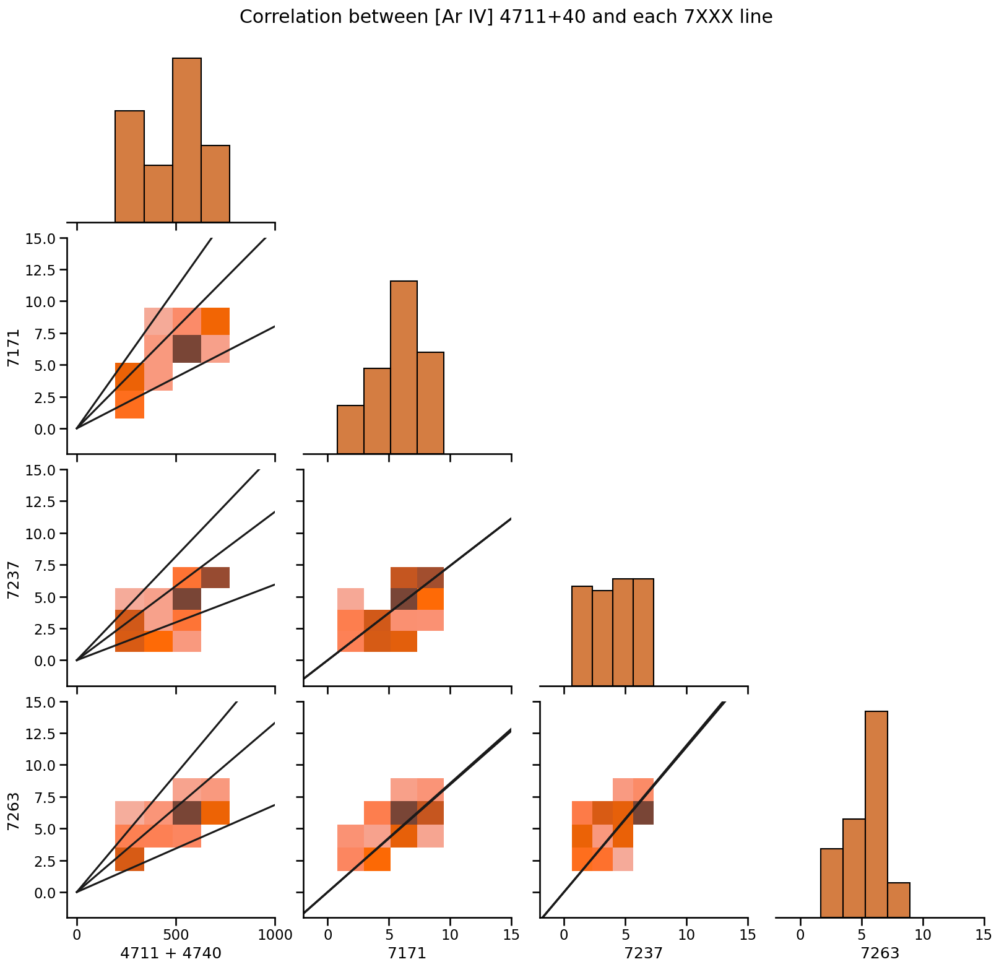

In [226]:
n = 16
color = "xkcd:dark orange"
xslice, yslice = slice(200, 300), slice(100, 250)
ratio = 0.016
xmin, xmax = -50, 1000
ymin, ymax = -2, 15
_im = im_ariv_sum.copy()
_im.data = np.where(
    narrow_mask,
    # False,
    np.nan,
    _im.data,
)
x = im_ariv_sum[yslice, xslice].rebin(n).data
# Ratio names from Keenan 1997
y4 = (im7171r[yslice, xslice] - offsets["7171"]).rebin(n).data 
y2 = (im7237r[yslice, xslice] - offsets["7237"]).rebin(n).data 
y3 = (im7263r[yslice, xslice] - offsets["7263"]).rebin(n).data 
z = _im[yslice, xslice].rebin(n).data
m = (x > xmin) & (x < xmax) 
m &= (y2 > ymin) & (y2 < ymax) 
m &= (y3 > ymin) & (y3 < ymax) 
m &= (y4 > ymin) & (y4 < ymax) 
m = (
    m
    & ~im_ariv_sum[yslice, xslice].rebin(n).mask
)
# m = m & (~broad_mask.rebin(n))
df = pd.DataFrame(
    {
        "4711 + 4740": x[m],
        "7171": y4[m],
        "7237": y2[m],
        "7263": y3[m],
    }
)
g = sns.pairplot(
    df,
    kind="hist",
    height=4,
    corner=True,
    plot_kws=dict(weights=z[m], bins=64 // n, color=color),
    diag_kws=dict(weights=z[m], bins=64 // n, color=color),
)
# g.axes[1, 0].plot([0, xmax], [0, ymax])
for ax in g.axes.flat:
    if ax:
        if "47" in ax.get_xlabel():
            ax.set_xlim(xmin, xmax)
            _line = ax.get_ylabel()
            try:
                _line = int(_line.strip())
                _ratios = e_ariv[_line] / (e_ariv[4711] + e_ariv[4740])
                for ratio in _ratios[:, 0]:
                    print(_line, ratio)
                    ax.plot([0, xmax], [0, ratio * xmax], color="k")
            except KeyError:
                pass
        else:
            ax.set_xlim(ymin, ymax)
            _xline = ax.get_xlabel()
            _yline = ax.get_ylabel()
            if _xline and _yline:
                _xline = int(_xline.strip())
                _yline = int(_yline.strip())
                _ratios = e_ariv[_yline] / e_ariv[_xline]
                for ratio in _ratios[:, 0]:
                    ax.plot([ymin, ymax], [ratio * ymin, ratio * ymax], color="k")
           
        if "47" in ax.get_ylabel():
            ax.set_ylim(xmin, xmax)
        else:
            ax.set_ylim(ymin, ymax)
g.fig.suptitle("Correlation between [Ar IV] 4711+40 and each 7XXX line")

#### Individual lines with no mask

7171 0.008014115599358234
7171 0.015716630175259542
7171 0.02197454619087335
7237 0.0059442194867692
7237 0.01165731866428329
7237 0.016298932060720382
7263 0.0068457022059966975
7263 0.013294575706129635
7263 0.018530557427629404


Text(0.5, 0.98, 'Correlation between [Ar IV] 4711+40 and each 7XXX line')

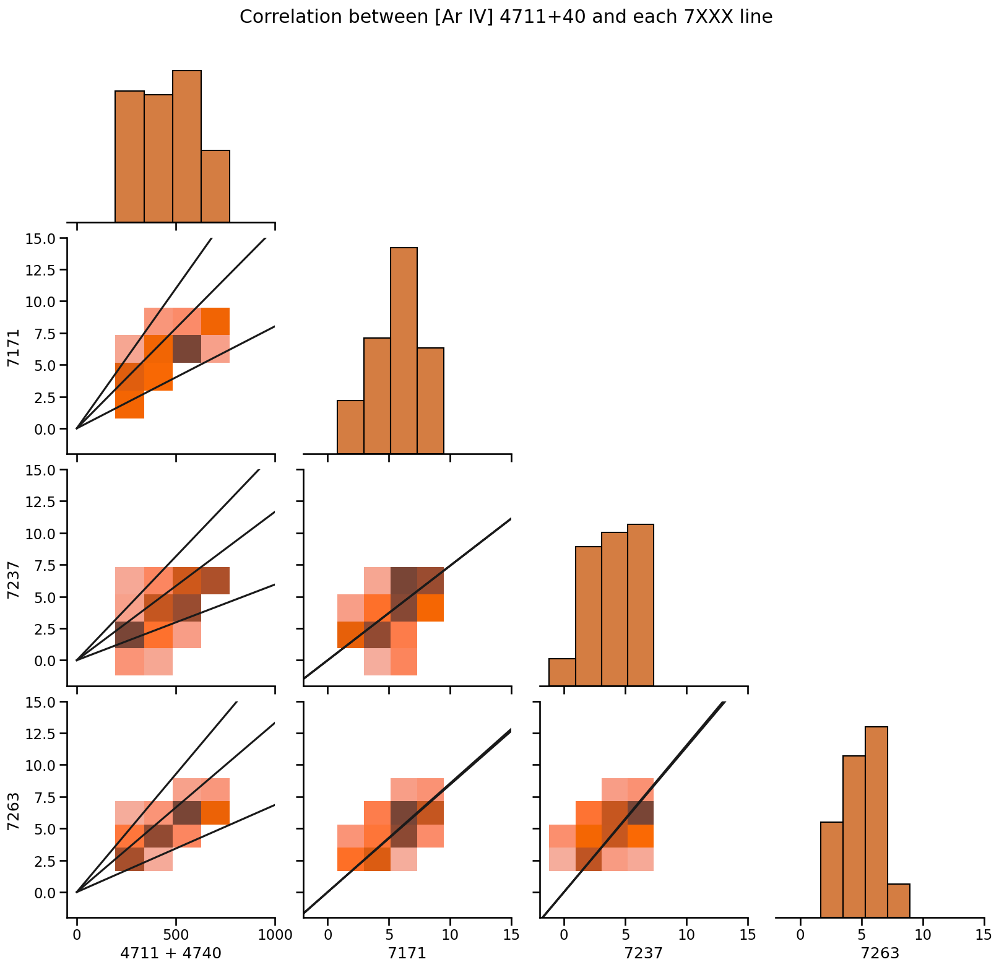

In [227]:
n = 16
color = "xkcd:dark orange"
xslice, yslice = slice(200, 300), slice(100, 250)
ratio = 0.016
xmin, xmax = -50, 1000
ymin, ymax = -2, 15
_im = im_ariv_sum.copy()
_im.data = np.where(
    # narrow_mask,
    False,
    np.nan,
    _im.data,
)
x = im_ariv_sum[yslice, xslice].rebin(n).data
# Ratio names from Keenan 1997
y4 = (im7171r[yslice, xslice] - offsets["7171"]).rebin(n).data 
y2 = (im7237r[yslice, xslice] - offsets["7237"]).rebin(n).data 
y3 = (im7263r[yslice, xslice] - offsets["7263"]).rebin(n).data 
z = _im[yslice, xslice].rebin(n).data
m = (x > xmin) & (x < xmax) 
m &= (y2 > ymin) & (y2 < ymax) 
m &= (y3 > ymin) & (y3 < ymax) 
m &= (y4 > ymin) & (y4 < ymax) 
m = (
    m
    & ~im_ariv_sum[yslice, xslice].rebin(n).mask
)
# m = m & (~broad_mask.rebin(n))
df = pd.DataFrame(
    {
        "4711 + 4740": x[m],
        "7171": y4[m],
        "7237": y2[m],
        "7263": y3[m],
    }
)
g = sns.pairplot(
    df,
    kind="hist",
    height=4,
    corner=True,
    plot_kws=dict(weights=z[m], bins=64 // n, color=color),
    diag_kws=dict(weights=z[m], bins=64 // n, color=color),
)
# g.axes[1, 0].plot([0, xmax], [0, ymax])
for ax in g.axes.flat:
    if ax:
        if "47" in ax.get_xlabel():
            ax.set_xlim(xmin, xmax)
            _line = ax.get_ylabel()
            try:
                _line = int(_line.strip())
                _ratios = e_ariv[_line] / (e_ariv[4711] + e_ariv[4740])
                for ratio in _ratios[:, 0]:
                    print(_line, ratio)
                    ax.plot([0, xmax], [0, ratio * xmax], color="k")
            except KeyError:
                pass
        else:
            ax.set_xlim(ymin, ymax)
            _xline = ax.get_xlabel()
            _yline = ax.get_ylabel()
            if _xline and _yline:
                _xline = int(_xline.strip())
                _yline = int(_yline.strip())
                _ratios = e_ariv[_yline] / e_ariv[_xline]
                for ratio in _ratios[:, 0]:
                    ax.plot([ymin, ymax], [ratio * ymin, ratio * ymax], color="k")
           
        if "47" in ax.get_ylabel():
            ax.set_ylim(xmin, xmax)
        else:
            ax.set_ylim(ymin, ymax)
g.fig.suptitle("Correlation between [Ar IV] 4711+40 and each 7XXX line")

And do the one that is contaminated by H_2 (but we removed it)

In [228]:
im7171rr = im7171r - offsets["7171"]
im7237rr = im7237r - offsets["7237"]
im7263rr = im7263r - offsets["7263"]
im7xxx = im7171rr + im7237rr + im7263rr

These are all fine.  Now include density and temperature indiocators together:



In [229]:
Ts = [5e3, 1e4, 1.5e4, 2.0e4, 2.5e4, 3.0e4]
# dens = [10.0, 100.0, 1000.0]
dens = [1.0, 200.0, 400.0, 600.0, 800.0, 1000.0]


Tfine = np.linspace(Ts[0], Ts[-1], 500)
dfine = np.linspace(dens[0], dens[-1], 500)

e4711 = ariv.getEmissivity(Tfine, dens, wave=4711)
e4740 = ariv.getEmissivity(Tfine, dens, wave=4740)
e7171 = ariv.getEmissivity(Tfine, dens, wave=7171)
e7237 = ariv.getEmissivity(Tfine, dens, wave=7237)
e7263 = ariv.getEmissivity(Tfine, dens, wave=7263)

rr1 = e4711 / e4740
rr4 = e7263 / (e4711 + e4740)
rr2 = e7171 / (e4711 + e4740)
rr3 = e7237 / (e4711 + e4740)
rr234 = rr2 + rr3 + rr4

e4711 = ariv.getEmissivity(Ts, dfine, wave=4711)
e4740 = ariv.getEmissivity(Ts, dfine, wave=4740)
e7171 = ariv.getEmissivity(Ts, dfine, wave=7171)
e7237 = ariv.getEmissivity(Ts, dfine, wave=7237)
e7263 = ariv.getEmissivity(Ts, dfine, wave=7263)

_rr1 = e4711 / e4740
_rr4 = e7263 / (e4711 + e4740)
_rr2 = e7171 / (e4711 + e4740)
_rr3 = e7237 / (e4711 + e4740)

_rr1 = _rr1.T
_rr2 = _rr2.T
_rr3 = _rr3.T
_rr4 = _rr4.T
_rr234 = _rr2 + _rr3 + _rr4


Following function is copied from the matplotlib docs.  Ideas originally from https://carstenschelp.github.io/2018/09/14/Plot_Confidence_Ellipse_001.html

I have modified it to include a weight array.


In [230]:
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

# See: https://carstenschelp.github.io/2018/09/14/Plot_Confidence_Ellipse_001.html


def confidence_ellipse(x, y, w, ax, n_std=3.0, facecolor="none", **kwargs):
    """
    Create a plot of the covariance confidence ellipse of *x* and *y*.

    Parameters
    ----------
    x, y : array-like, shape (n, )
        Input data.

    w : array-like, shape (n, )
        Weights of each input point.

    ax : matplotlib.axes.Axes
        The axes object to draw the ellipse into.

    n_std : float
        The number of standard deviations to determine the ellipse's radiuses.

    **kwargs
        Forwarded to `~matplotlib.patches.Ellipse`

    Returns
    -------
    matplotlib.patches.Ellipse
    """
    if x.size != y.size:
        raise ValueError("x and y must be the same size")

    cov = np.cov(x, y, aweights=w)
    pearson = cov[0, 1] / np.sqrt(cov[0, 0] * cov[1, 1])
    # Using a special case to obtain the eigenvalues of this
    # two-dimensionl dataset.
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse(
        (0, 0),
        width=ell_radius_x * 2,
        height=ell_radius_y * 2,
        facecolor=facecolor,
        **kwargs,
    )

    # Calculating the stdandard deviation of x from
    # the squareroot of the variance and multiplying
    # with the given number of standard deviations.
    scale_x = np.sqrt(cov[0, 0]) * n_std
    mean_x = np.average(x, weights=w)

    # calculating the stdandard deviation of y ...
    scale_y = np.sqrt(cov[1, 1]) * n_std
    mean_y = np.average(y, weights=w)

    transf = (
        transforms.Affine2D()
        .rotate_deg(45)
        .scale(scale_x, scale_y)
        .translate(mean_x, mean_y)
    )

    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

'R1 = 1.735 +/- 0.095, R2 + R3 + R4 = 0.031 +/- 0.004'

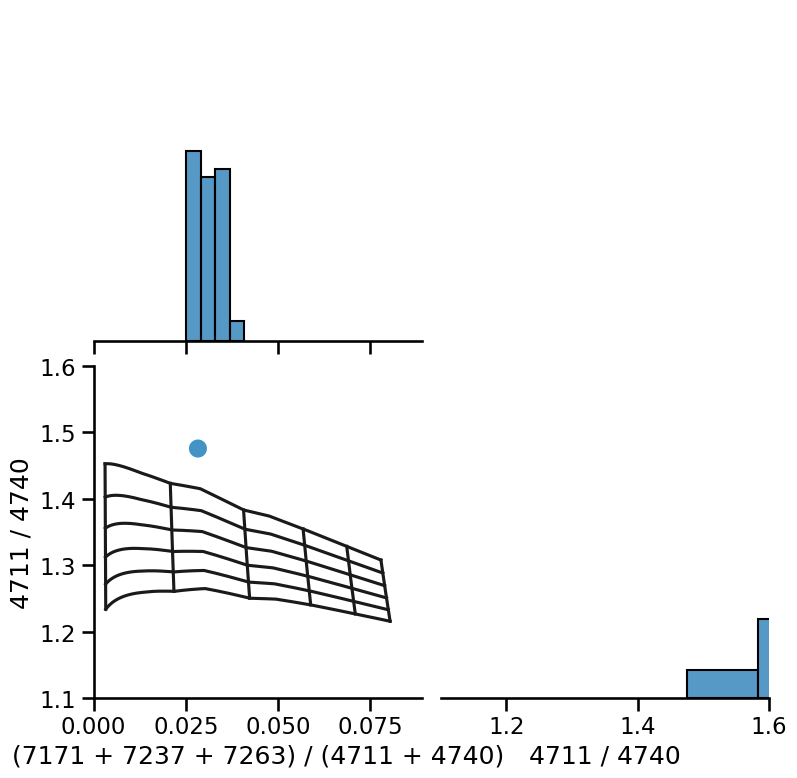

In [231]:
n = 16
xslice, yslice = slice(230, 300), slice(144, 245)
w_low_cutoff = 250
w_mid_cutoff = 300  # 375
xymin, xymax = 0.00, 0.089
zzmin, zzmax = 1.1, 1.6

_im = im_ariv_sum.copy()
_im.data = np.where(
    broad_mask,
    # False,
    np.nan,
    _im.data,
)

w = _im[yslice, xslice].rebin(n).data
x = im7xxx[yslice, xslice].rebin(n).data / w
z = im4711r[yslice, xslice].rebin(n).data / im4740r[yslice, xslice].rebin(n).data
m = w > w_mid_cutoff  # & (w < wmax)
# m = m & (x + y > 0.25*ratio) & (x + y < 2*ratio)
m = m & (z > 1.1) & (z < 2.1)
# m = m & ~ariv_R1[yslice, xslice].rebin(n).mask & ~ariv_R3_plus_R4[yslice, xslice].rebin(n).mask
df = pd.DataFrame(
    {
        "(7171 + 7237 + 7263) / (4711 + 4740)": x[m],
        "4711 / 4740": z[m],
        "sum": w[m],
    }
).sort_values(by="sum")
mean_R1 = np.average(z[m], weights=w[m])
mean_R234 = np.average(x[m], weights=w[m])

var_R1 = np.average((z[m] - mean_R1) ** 2, weights=w[m])
var_R234 = np.average((x[m] - mean_R234) ** 2, weights=w[m])

sig_R1 = np.sqrt(var_R1)
sig_R234 = np.sqrt(var_R234)

text = f"R1 = {mean_R1:.3f} +/- {sig_R1:.3f}"
text += f", R2 + R3 + R4 = {mean_R234:.3f} +/- {sig_R234:.3f}"

_vars = df.columns[:2]
g = sns.pairplot(
    df,
    x_vars=_vars,
    y_vars=_vars,
    kind="scatter",
    diag_kind="hist",
    height=4,
    corner=True,
    plot_kws=dict(
        # weights=z[m],
        c=df["sum"],
        cmap="Blues",
        s=200,
        vmin=w_low_cutoff,
    ),
    diag_kws=dict(
        weights=w[m],
        bins=4,
        #    bins=128//n,
    ),
)
g.axes[1, 0].plot(rr234, rr1, color="k")
g.axes[1, 0].plot(_rr234, _rr1, color="k")
confidence_ellipse(
    x[m],
    z[m],
    w[m],
    g.axes[1, 0],
    n_std=1,
    edgecolor="red",
    linewidth=2,
)
g.axes[1, 0].scatter(
    mean_R234,
    mean_R1,
    c="r",
    marker="+",
    s=400,
    linewidth=3,
)

g.axes[1, 0].set_xlim(xymin, xymax)
g.axes[1, 0].set_ylim(zzmin, zzmax)

g.axes[1, 1].set_xlim(*g.axes[1, 0].get_ylim())
g.axes[0, 0].set_xlim(*g.axes[1, 0].get_xlim())

g.fig.savefig(ROOT / "figs/ngc346-PZ-bow-shock-ariv-diagnostics-R1-R3.pdf")
# g.fig.suptitle("Correlation between [Ar IV] ratios");
text

In [232]:
df.columns[:2]

Index(['(7171 + 7237 + 7263) / (4711 + 4740)', '4711 / 4740'], dtype='object')

In [233]:
n = 8
xslice, yslice = slice(230, 300), slice(144, 245)
w_low_cutoff = 250
w_mid_cutoff = 350  # 375
xymin, xymax = 0.011, 0.059
zzmin, zzmax = 1.11, 1.5

ww = im_ariv_sum[yslice, xslice].rebin(n)
xx = im7263r[yslice, xslice].rebin(n) / ww
yy = im7171r[yslice, xslice].rebin(n) / ww

In [234]:
(xx.mask).sum()

0

In [235]:
xx.mask?

Type:        property
String form: <property object at 0x11fcf94e0>
Docstring:  
The shared masking array of the data and variance arrays.

This is a bool array which has the same shape as the data and variance
arrays. Setting an element of this array to True, flags the
corresponding pixels of the data and variance arrays, so that they
don't take part in subsequent calculations. Reverting this element to
False, unmasks the pixel again.

This array can be modified either directly by assignments to elements
of this property or by modifying the masks of the .data and .var
arrays. An entirely new mask array can also be assigned to this
property, provided that it has the same shape as the data array.

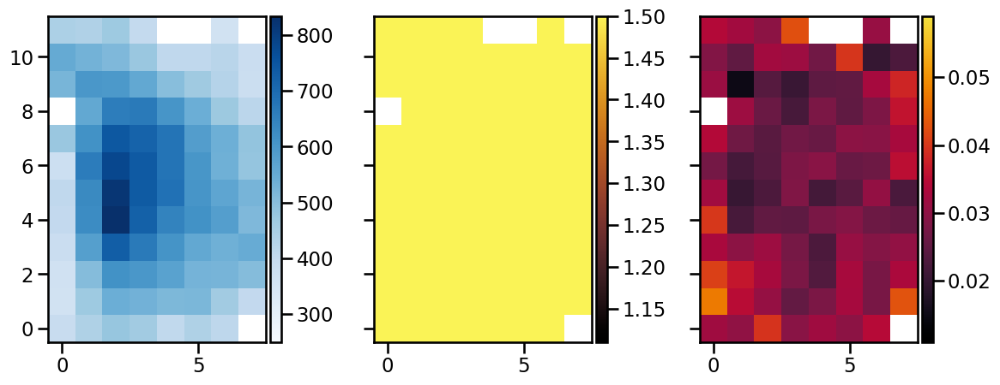

In [236]:
n = 8
xslice, yslice = slice(230, 300), slice(144, 245)
w_low_cutoff = 250
w_mid_cutoff = 350  # 375
xymin, xymax = 0.011, 0.059
zzmin, zzmax = 1.11, 1.5

ww = im_ariv_sum[yslice, xslice].rebin(n)
xx = im7263r[yslice, xslice].rebin(n) / ww
yy = im7171r[yslice, xslice].rebin(n) / ww
xy = xx + yy
zz = im4711r[yslice, xslice].rebin(n) / im4740r[yslice, xslice].rebin(n)
mm = ww.data > w_low_cutoff  # & (ww.data < wmax)
# mm = mm & (xy.data > xymin) & (xy.data < xymax)
# mm = mm & (zz.data > zzmin) & (zz.data < zzmax)
ww.mask = ww.mask | ~mm | (ww.data < w_mid_cutoff)
xy.mask = ww.mask
zz.mask = ww.mask
fig, axes = plt.subplots(1, 3, sharey=True, figsize=(12, 5))
ww.plot(ax=axes[0], colorbar="v", vmin=w_low_cutoff, vmax=None, cmap="Blues")
zz.plot(ax=axes[1], colorbar="v", vmin=zzmin, vmax=zzmax, cmap=cmr.amber)
xy.plot(ax=axes[2], colorbar="v", vmin=xymin, vmax=xymax, cmap=cmr.ember)
fig.tight_layout()
fig.savefig(ROOT / "figs/ngc346-PZ-bow-shock-ariv-diagnostics-maps.pdf")

In [237]:
cov = np.cov(x[m] + y[m], z[m], aweights=w[m])
pearson = cov[0, 1] / np.sqrt(cov[0, 0] * cov[1, 1])
cov, pearson, np.sqrt(cov[0, 0]), np.sqrt(cov[1, 1])

IndexError: boolean index did not match indexed array along dimension 0; dimension is 18 but corresponding boolean dimension is 6

#### Previous version of mask (no longer used)

I need to decide how bright a star needs to be before I mask out that bit of the image. 5000 in the `cont4686` image seems a reasonable value.

**Note** These cells are converted to raw so they will not execute